# World Data League 2022

## 🎯 Challenge
*Predict Waste Production for its Reduction*


## 👥 Authors
* Cristiana Carpinteiro
* Diogo Polónia
* João Afonso Pereira
* João Matos
* Patrícia Rocha

## 💻 Development

### EDA

Our EDA was highly dependent on the different approaches, so in this section there is only the overall analysis of the main dataset. The remaining EDA is distributed accross the rest of this notebook.

#### Main Dataset Description

https://data.austintexas.gov/Utilities-and-City-Services/Waste-Collection-Diversion-Report-daily-/mbnu-4wq9

Austin Resource Recovery daily report providing waste collection information. The dataset was last updated on July 11, 2021, and consists of roughly 741,000 rows and eight columns.

Columns description:
* Report Date - the date when the information was recorded
* Load Type - the specific type of load that is being collected
* Load Time - the time when the load was collected
* Load Weight - the weight, in pounds, of the load
* Dropoff Site - the location where each type of waste is delivered for disposal, recycling, or reuse
* Route Type - the general category of collection service provided by Austin Resource Recovery
* Route Number - Austin Resource Recovery route that the truck that collected this load was following
* Load ID

In [ ]:
data = pd.read_csv('Waste_Collection___Diversion_Report__daily_.csv')
data['Load Time'] = pd.to_datetime(data['Load Time'], format='%m/%d/%Y %I:%M:%S %p')

# Use Load Time as key timestamp
data.drop('Report Date', axis=1, inplace=True)

data.dropna(subset=['Load Weight'], inplace=True)
data = data[data['Load Weight'] > 0]

# Remove data post July 11, 2021 (the last time this dataset was updated)
data = data[data['Load Time'] < '2021-07-12']

# Remove entries that are likely to be duplicates
data['Load Date'] = pd.to_datetime(data['Load Time'].dt.date)
data = data.drop_duplicates(subset=['Load Type', 'Load Weight', 'Dropoff Site', 'Route Type', 'Route Number', 'Load Date'])

data.drop_duplicates(subset=['Load Type', 'Load Weight', 'Load ID'], keep='last', inplace=True, ignore_index=True)

In [ ]:
assert len(data) == len(data['Load ID'].unique()), 'Number of IDs doesn\'t match number of samples'

In [ ]:
data.sort_values('Load Time', inplace=True, ignore_index=True)
data

,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Load Date
0,RECYCLING - PAPER,2000-01-26 12:39:00,2940.0,MRF,RECYCLING,RH12,163262,2000-01-26
1,BULK,2001-03-16 09:38:00,4240.0,TDS LANDFILL,BULK,BU05,522335,2001-03-16
2,BULK,2001-03-16 13:33:00,4740.0,TDS LANDFILL,BULK,BU05,522334,2001-03-16
3,BULK,2001-10-16 11:51:00,14080.0,TDS LANDFILL,BULK,BU16,545997,2001-10-16
4,BULK,2001-10-16 15:28:00,8260.0,TDS LANDFILL,BULK,BU16,545996,2001-10-16
...,...,...,...,...,...,...,...,...
655357,BULK,2021-07-11 07:07:01,10100.0,TDS LANDFILL,BULK,BU27,842414,2021-07-11
655358,TIRES,2021-07-11 07:07:05,1500.0,TDS LANDFILL,BULK,BU16,848381,2021-07-11
655359,TIRES,2021-07-11 07:07:05,2120.0,MRF,BULK,BU16,848380,2021-07-11
655360,GARBAGE COLLECTIONS,2021-07-11 07:07:42,17200.0,TDS LANDFILL,GARBAGE COLLECTION,PW30,928229,2021-07-11


**Goal:** Predict the total weight of garbage collected per day in Austin, for the next future days

The first idea was to predict total weight per week for each route individually (not per day because the routes do not work every day), however the considerable number of different routes makes it difficult to be a practical solution. Also, the investigation in the weekly weight per route proved that the behaviours are difficult to predict and that there is a lot of variability from route to route. Therefore, the team decided to focus on forecasting the total weight per day for all routes.

The main value of this model is to allow the city council to understand future behaviours of the population. This way it can be prepared for peaks in the garbage production (and increase the number of trucks for example) and also for days with lower amounts of garbage to be collected (and decrease the number of trucks for example, also decreasing the CO2 emissions).

### Forecasting future daily waste collections

#### Imports and setup

In [ ]:
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt
color = sns.color_palette()
sns.set_style('darkgrid')

#### Process data

**Read daily waste collection dataset**

You need to have in the same directory a CSV file called 'waste_dataset.csv' with the data from the waste collection dataset.

https://data.austintexas.gov/Utilities-and-City-Services/Waste-Collection-Diversion-Report-daily-/mbnu-4wq9

In [ ]:
df = pd.read_csv('waste_dataset.csv')
df.head(3)

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID
0,12/08/2020,BULK,12/08/2020 03:02:00 PM,5220.0,TDS LANDFILL,BULK,BU13,899097
1,12/08/2020,RECYCLING - SINGLE STREAM,12/08/2020 10:00:00 AM,11140.0,TDS - MRF,RECYCLING - SINGLE STREAM,RTAU53,899078
2,12/03/2020,RECYCLING - SINGLE STREAM,12/03/2020 10:34:00 AM,10060.0,BALCONES RECYCLING,RECYCLING - SINGLE STREAM,RHBU10,899082


**Initial processing**

Filter some columns, filter for just garbage collections and other

In [ ]:
df['Load Date'] = df['Load Time'].apply(lambda x: x.split(' ')[0])
df = df.drop_duplicates(subset=['Load Type', 'Load Weight', 'Dropoff Site', 'Route Type', 'Route Number', 'Load Date'])

waste = df[['Load Type', 'Load Time', 'Load Weight', 'Route Number']].copy()
waste['Load Time'] = pd.to_datetime(waste['Load Time'])

waste = waste.rename(columns={'Load Type': 'type', 'Load Time': 'time', 'Load Weight': 'weight', 'Route Number': 'route'})
waste_filtered = waste.dropna().loc[(waste['type'] == 'GARBAGE COLLECTIONS') & (waste['weight'] > 0)]

waste_day = waste_filtered.copy()
waste_day['time'] = waste_day['time'].apply(lambda t: t.date())
waste_day.head(3)

,type,time,weight,route
5,GARBAGE COLLECTIONS,2020-12-04,22720.0,PAF03
8,GARBAGE COLLECTIONS,2020-12-04,26320.0,PAF01
20,GARBAGE COLLECTIONS,2020-12-07,21960.0,PAM06


**Year analysis**

Check the representation of each year in the dataset 

In [ ]:
year_analysis = waste_day.drop(columns=['type']).groupby(['time']).sum().reset_index().sort_values(by='time').copy()
year_analysis['time'] = pd.to_datetime(year_analysis['time'])
year_analysis['year'] = year_analysis['time'].dt.year
year_analysis['is_leap'] = year_analysis['time'].dt.is_leap_year
year_analysis['days_in_year'] = year_analysis.apply(lambda row: 366 if row['is_leap'] == True else 365, axis=1)
year_analysis_gb = year_analysis.groupby('year').max().reset_index()[['year', 'days_in_year']]
available_days_df = pd.DataFrame(year_analysis['year'].value_counts()).reset_index().rename(columns={'year': 'available_days', 'index': 'year'})
year_analysis_gb = year_analysis_gb.merge(available_days_df, on='year')
year_analysis_gb['percentage'] = year_analysis_gb.apply(lambda row: (row['available_days']/row['days_in_year'])*100, axis=1)
year_analysis_gb

,year,days_in_year,available_days,percentage
0,2004,366,74,20.218579
1,2005,365,280,76.712329
2,2006,365,302,82.739726
3,2007,365,301,82.465753
4,2008,366,299,81.693989
5,2009,365,308,84.383562
6,2010,365,307,84.109589
7,2011,365,310,84.931507
8,2012,366,309,84.426230
9,2013,365,308,84.383562


Only 2004, 2005 and 2021 have a representation of less than 80%. The data from 2021 is the most recent and will be used to test the model, so it will remain in the dataset, but the data from 2004 and 2005 will be removed. A new file with the processed dataset will be saved.

In [ ]:
waste_day['time'] = pd.to_datetime(waste_day['time'])
waste_day_gb = waste_day.loc[waste_day['time'].dt.year > 2005].drop(columns=['type']).groupby(['time', 'route']).sum().reset_index().sort_values(by='time')
waste_day_gb.to_csv("processed_waste_dataset.csv", index=False)
waste_day_gb.head(3)

,time,route,weight
0,2006-01-02,PAM01,35540.0
25,2006-01-02,PAM79,1500.0
26,2006-01-02,PAMCOM,4580.0


**Route analysis**

Check the total number of routes, which is considerable and makes it impossible to create one model per route.

Total number of routes: 458


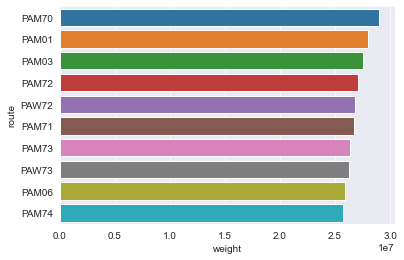

In [ ]:
route_analysis = waste_day_gb.copy()
route_analysis = route_analysis.groupby(['route']).sum().reset_index().sort_values(by='weight', ascending=False)
print("Total number of routes:", len(route_analysis))
sns.barplot(x='weight', y='route', data=route_analysis.iloc[:10])
plt.show()

**Prepare data for time series analysis**

Filter out the data from before 2018, to make it more efficient to visualize the data and fit the model

In [ ]:
data = pd.read_csv('processed_waste_dataset.csv').drop(columns=['route'])

data['time'] = pd.to_datetime(data['time'])
data = data.loc[data['time'].dt.year >= 2018]

data = data.groupby('time').sum().reset_index()

print("Last day:", data['time'].max())
                                      
data = data.sort_values(by='time', ascending=True)
data.head(3)

Last day: 2021-07-11 00:00:00


,time,weight
0,2018-01-02,1343660.0
1,2018-01-03,879260.0
2,2018-01-04,1309640.0


**Split data into train and test**

Test will be from the middle of the last june (more or less the last month)

In [ ]:
train_df = data.loc[data['time'] < datetime(2021, 6, 15)].set_index('time')
test_df = data.loc[data['time'] >= datetime(2021, 6, 15)].set_index('time')

print("Number of days in train data = {}\nNumber of days in test data = {}".format(len(train_df), len(test_df)))

Number of days in train data = 1061
Number of days in test data = 22


####Time series analysis

**Visualization of train and test**

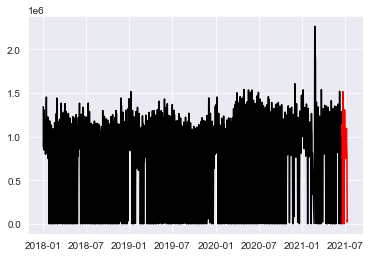

In [ ]:
plt.plot(train_df.index, train_df['weight'], c='black')
plt.plot(test_df.index, test_df['weight'], c='red')

**Visualization of test**

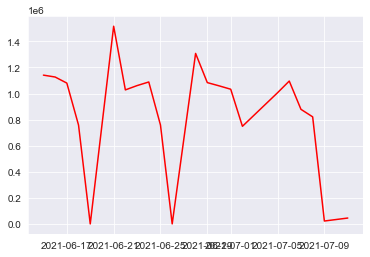

In [ ]:
plt.plot(test_df.index, test_df['weight'], c='red')

**Seasonal decompose**

Frequency is the total number of days in 1 year.

<Figure size 432x288 with 0 Axes>

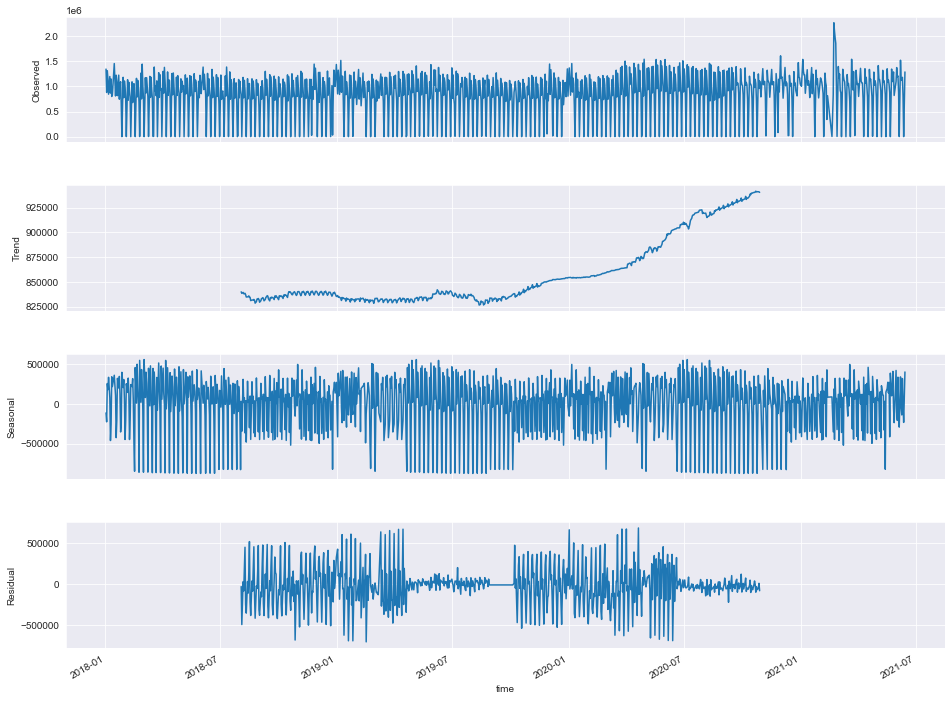

In [ ]:
result = seasonal_decompose(train_df, model='additive', freq=365)

fig = plt.figure()  
fig = result.plot()  
fig.set_size_inches(15, 12)
plt.show()

There a visual trend in the data, but to be sure it is necessary to test the stationarity of the time series

**Test stationarity**

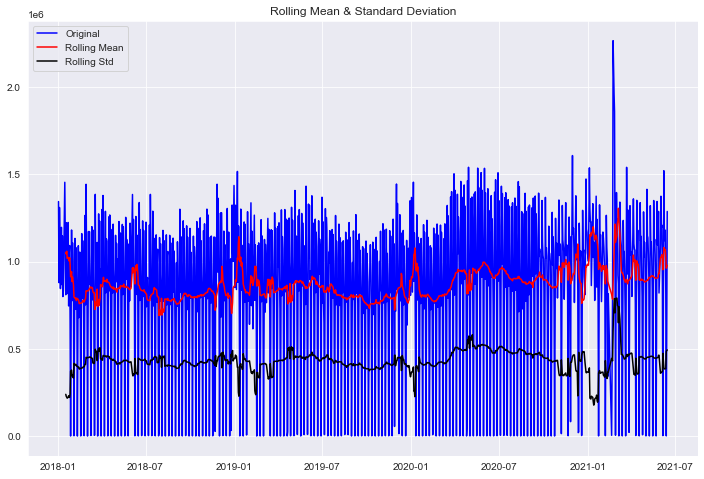

Results of Dickey-Fuller Test:
p-value = 0.0000. The series is likely stationary.
Test Statistic                   -5.466664
p-value                           0.000002
#Lags Used                       17.000000
Number of Observations Used    1043.000000
Critical Value (1%)              -3.436635
Critical Value (5%)              -2.864315
Critical Value (10%)             -2.568248
dtype: float64


In [ ]:
def test_stationarity(timeseries, window = 12, cutoff = 0.01):

    rolmean = timeseries.rolling(window).mean()
    rolstd = timeseries.rolling(window).std()

    fig = plt.figure(figsize=(12, 8))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    #Dickey-Fuller test
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC', maxlag = 20 )
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    pvalue = dftest[1]
    if pvalue < cutoff:
        print('p-value = %.4f. The series is likely stationary.' % pvalue)
    else:
        print('p-value = %.4f. The series is likely non-stationary.' % pvalue)
    
    print(dfoutput)
    
test_stationarity(train_df['weight'])

The data is officialy stationary because the p_value is lower than the 5% threshold of significance.

**Seasonality analysis**

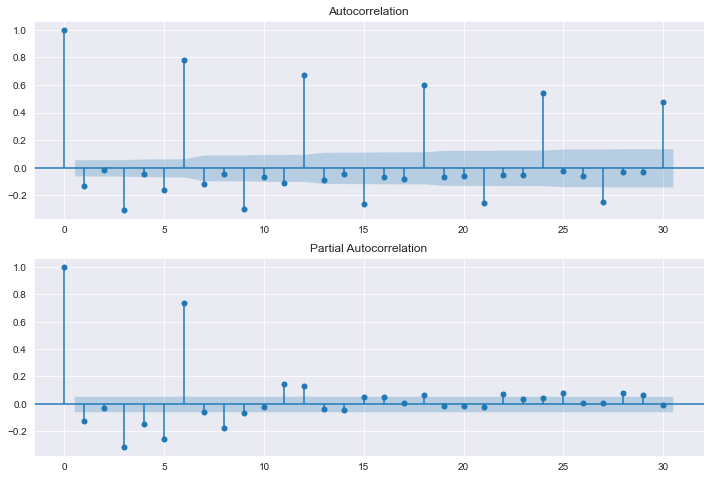

In [ ]:
import statsmodels.api as sm

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(train_df['weight'], lags=30, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(train_df['weight'], lags=30, ax=ax2)

There is a clear peak every 6 points, from the autocorrelation plot.

#### Model

**SARIMAX(P,Q,D)** - the data has seasonality, so the team decided to use a SARIMA right away

P = 6 (repetition every 6 points in the autocorrelation)

Q = 1 (stationary)

D = 0 (empirical)

Test MAE / 1000: 213.1
Test RMSE: 344618.6


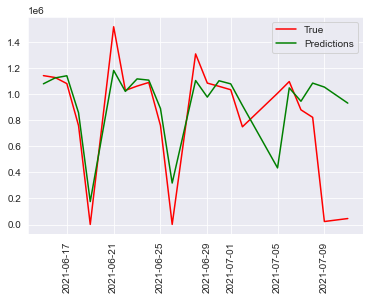

In [ ]:
model = SARIMAX(train_df['weight'], order = (6, 1, 0))
model = model.fit()

y_pred = model.get_forecast(len(test_df.index))
y_pred_df = y_pred.conf_int(alpha = 0.05) 
y_pred_df["Predictions"] = ARMAmodel.predict(start = y_pred_df.index[0], end = y_pred_df.index[-1])
y_pred_df.index = test_df.index
y_pred_out = y_pred_df["Predictions"] 

test_score = mean_absolute_error(test_df['weight'], y_pred_out) / 1000
print(f'Test MAE / 1000: {test_score:.1f}')

test_rmse = sqrt(mean_squared_error(test_df['weight'], y_pred_out))
print(f'Test RMSE: {test_rmse:.1f}')

plt.plot(test_df.index, test_df['weight'], c='red', label = 'True')
plt.plot(y_pred_out, color='green', label = 'Predictions')
plt.legend()
plt.xticks(rotation=90)
plt.show()

**Naive forecasting**

In [ ]:
all_df = pd.concat([train_df, test_df], axis=0)

all_df = pd.concat([all_df.shift(1), all_df], axis=1)
all_df.columns = ['t-1', 't+1']

X = all_df.values
train, test = X[1:-22], X[-22:]
X_train, y_train = train[:,0], train[:,1]
X_test, y_test = test[:,0], test[:,1]

Test MSE / 1000: 352.1
Test RMSE: 544548.5


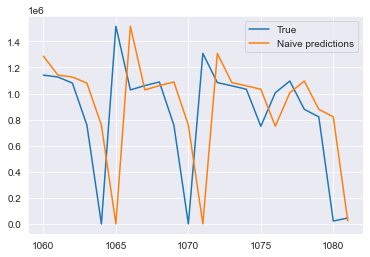

In [ ]:
def model_persistence(x):
    return x
 
all_preds = []
for x in X_test:
    y_pred = model_persistence(x)
    all_preds.append(y_pred)
    
test_score = mean_absolute_error(y_test, all_preds) / 1000
print(f'Test MSE / 1000: {test_score:.1f}')

test_rmse = sqrt(mean_squared_error(y_test, all_preds))
print(f'Test RMSE: {test_rmse:.1f}')
 
# plot predictions and expected results
plt.plot([None for i in y_train] + [x for x in y_test], label='True')
plt.plot([None for i in y_train] + [x for x in all_preds], label='Naive predictions')
plt.legend()
plt.show()

**Plot forecasting, naive and true together**

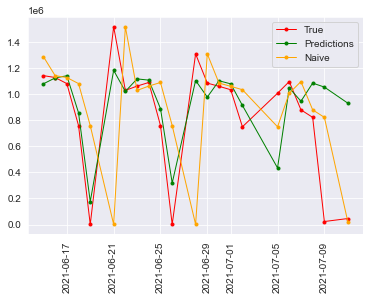

In [ ]:
plt.plot(test_df.index, test_df['weight'], c='red', label = 'True', marker='o', ms=3, lw=1)
plt.plot(y_pred_out, color='green', label = 'Predictions', marker='o', ms=3, lw=1)
plt.plot(test_df.index, [x for x in all_preds], label='Naive', c='orange', marker='o', ms=3, lw=1)
plt.legend()
plt.xticks(rotation=90)
plt.show()

#### Conclusions

The team's forecast algorithm obtained better performance than the naive model, so the forecasting task was a success.

### Geographical distributions of garbage, recycling & ratio of recycling

#### Imports and setup

In [ ]:
# Uncomment to install some of the libraries below
# !pip3 install geopandas

import warnings
warnings.filterwarnings('ignore')

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import xgboost

from google.colab import drive
from matplotlib import pyplot
from matplotlib import rcParams
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error

In [ ]:
# rcParams['figure.figsize'] = 16, 8
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['lines.linewidth'] = 2.

In [ ]:
drive.mount('/content/drive')
working_dir = '/content/drive/MyDrive/Colab Notebooks'
os.chdir(working_dir)

Mounted at /content/drive


#### Read data

In [ ]:
data = pd.read_csv('Waste_Collection___Diversion_Report__daily_.csv')
data['Load Time'] = pd.to_datetime(data['Load Time'], format='%m/%d/%Y %I:%M:%S %p')

# Use Load Time as key timestamp
data.drop('Report Date', axis=1, inplace=True)

data.dropna(subset=['Load Weight'], inplace=True)
data = data[data['Load Weight'] > 0]

# Remove data post July 11, 2021 (the last time this dataset was updated)
data = data[data['Load Time'] < '2021-07-12']

# Remove entries that are likely to be duplicates
data['Load Date'] = pd.to_datetime(data['Load Time'].dt.date)
data = data.drop_duplicates(subset=['Load Type', 'Load Weight', 'Dropoff Site', 'Route Type', 'Route Number', 'Load Date'])

data.drop_duplicates(subset=['Load Type', 'Load Weight', 'Load ID'], keep='last', inplace=True, ignore_index=True)

In [ ]:
assert len(data) == len(data['Load ID'].unique()), 'Number of IDs doesn\'t match number of samples'

In [ ]:
data.sort_values('Load Time', inplace=True, ignore_index=True)
data

,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Load Date
0,RECYCLING - PAPER,2000-01-26 12:39:00,2940.0,MRF,RECYCLING,RH12,163262,2000-01-26
1,BULK,2001-03-16 09:38:00,4240.0,TDS LANDFILL,BULK,BU05,522335,2001-03-16
2,BULK,2001-03-16 13:33:00,4740.0,TDS LANDFILL,BULK,BU05,522334,2001-03-16
3,BULK,2001-10-16 11:51:00,14080.0,TDS LANDFILL,BULK,BU16,545997,2001-10-16
4,BULK,2001-10-16 15:28:00,8260.0,TDS LANDFILL,BULK,BU16,545996,2001-10-16
...,...,...,...,...,...,...,...,...
655357,BULK,2021-07-11 07:07:01,10100.0,TDS LANDFILL,BULK,BU27,842414,2021-07-11
655358,TIRES,2021-07-11 07:07:05,1500.0,TDS LANDFILL,BULK,BU16,848381,2021-07-11
655359,TIRES,2021-07-11 07:07:05,2120.0,MRF,BULK,BU16,848380,2021-07-11
655360,GARBAGE COLLECTIONS,2021-07-11 07:07:42,17200.0,TDS LANDFILL,GARBAGE COLLECTION,PW30,928229,2021-07-11


#### Garbage Collection and Recycling Single Stream Routes

https://data.austintexas.gov/Locations-and-Maps/Garbage-Routes/azhh-4hg8
https://data.austintexas.gov/dataset/BOUNDARIES_recycle_collection_routes/7tin-f8k2


The data provided spans years in which Austin grew and changed a lot, most likely with changing waste collection and routes, explaining why some of the latter are not in the current route map(s). Some route numbers also occur only once, suggesting on-demand waste collection, which would not appear in the regular boundaries map.

Since some route numbers do not have a bounded region, we will only focus on the ones that do.

In [ ]:
garbage_boundaries = gpd.read_file('garbage_routes.geojson')
recycling_boundaries = gpd.read_file('recycling_routes.geojson')

In [ ]:
garbage_route_numbers = list(garbage_boundaries['garb_rt'])
recycling_route_numbers = list(recycling_boundaries['route_name'])

# Only consider data with a bounded route
garbage_data = data[data['Route Number'].isin(garbage_route_numbers)]
recycling_data = data[data['Route Number'].isin(recycling_route_numbers)]

In [ ]:
garbage_data = garbage_data[garbage_data['Load Type'] == 'GARBAGE COLLECTIONS']
recycling_data = recycling_data[recycling_data['Load Type'] == 'RECYCLING - SINGLE STREAM']

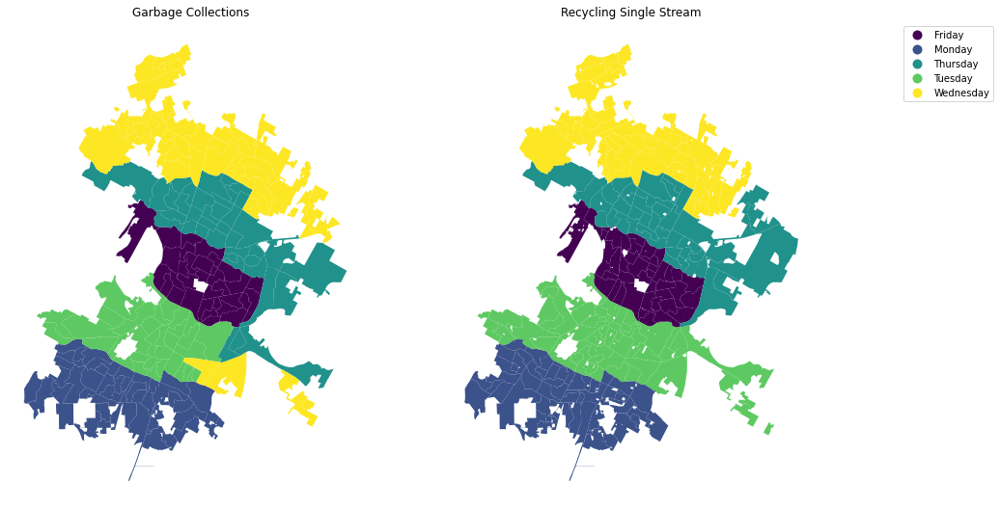

In [ ]:
# Waste Collection Days in Austin
fig, (ax1, ax2) = pyplot.subplots(ncols=2, sharex=True, sharey=True, figsize=(15,15))
garbage_boundaries.plot(ax=ax1, column='garb_day', cmap='viridis')
recycling_boundaries.plot(ax=ax2, column='service_day', cmap='viridis', legend=True, legend_kwds={'bbox_to_anchor': (1.5, 1)})
ax1.set_title('Garbage Collections')
ax2.set_title('Recycling Single Stream')
ax1.set_axis_off()
ax2.set_axis_off()

In [ ]:
garbage_data_2010 = garbage_data[garbage_data['Load Time'].dt.year == 2010]
recycling_data_2010 = recycling_data[recycling_data['Load Time'].dt.year == 2010]
garbage_data_2020 = garbage_data[garbage_data['Load Time'].dt.year == 2020]
recycling_data_2020 = recycling_data[recycling_data['Load Time'].dt.year == 2020]

In [ ]:
for route in garbage_route_numbers:
  garbage_boundaries.loc[garbage_boundaries['garb_rt'] == route, 'load_2010'] = garbage_data_2010[garbage_data_2010['Route Number'] == route]['Load Weight'].sum()
  garbage_boundaries.loc[garbage_boundaries['garb_rt'] == route, 'load_2020'] = garbage_data_2020[garbage_data_2020['Route Number'] == route]['Load Weight'].sum()

for route in recycling_route_numbers:
  recycling_boundaries.loc[recycling_boundaries['route_name'] == route, 'load_2010'] = recycling_data_2010[recycling_data_2010['Route Number'] == route]['Load Weight'].sum()
  recycling_boundaries.loc[recycling_boundaries['route_name'] == route, 'load_2020'] = recycling_data_2020[recycling_data_2020['Route Number'] == route]['Load Weight'].sum()

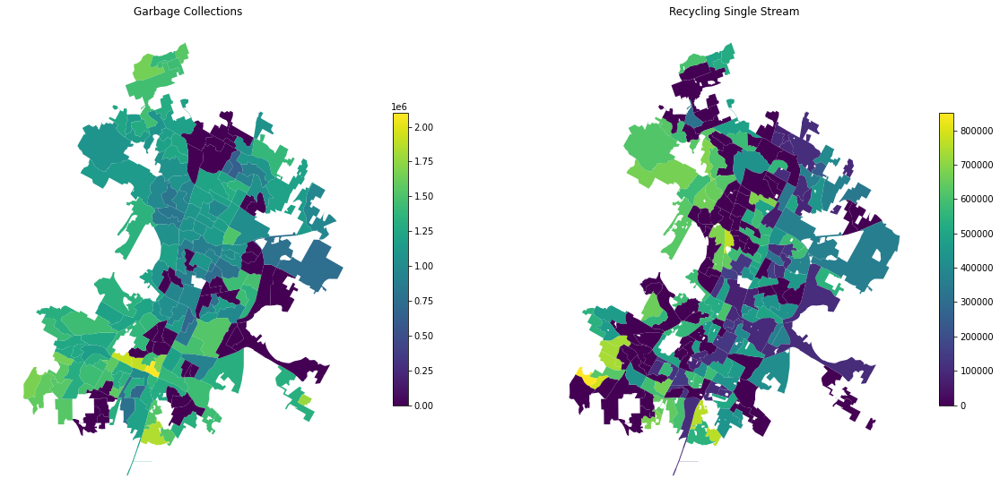

In [ ]:
# Collected Garbage per route in 2010
fig, (ax1, ax2) = pyplot.subplots(ncols=2, sharex=True, sharey=True, figsize=(20, 20))
garbage_boundaries.plot(ax=ax1, column='load_2010', cmap='viridis', legend=True, legend_kwds={'shrink': 0.3})
recycling_boundaries.plot(ax=ax2, column='load_2010', cmap='viridis', legend=True, legend_kwds={'shrink': 0.3})
ax1.set_title('Garbage Collections')
ax2.set_title('Recycling Single Stream')
ax1.set_axis_off()
ax2.set_axis_off()

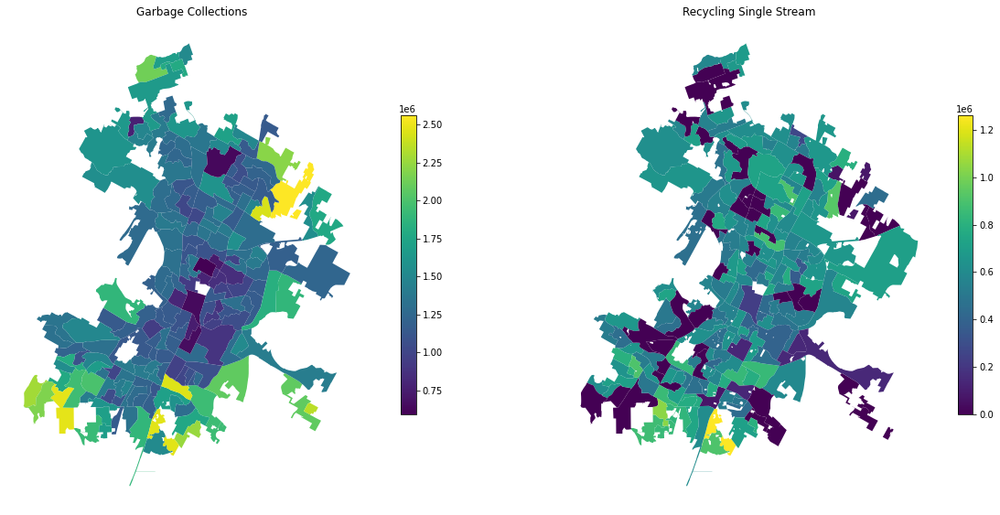

In [ ]:
# Collected Garbage per route in 2020
fig, (ax1, ax2) = pyplot.subplots(ncols=2, sharex=True, sharey=True, figsize=(20, 20))
garbage_boundaries.plot(ax=ax1, column='load_2020', cmap='viridis', legend=True, legend_kwds={'shrink': 0.3})
recycling_boundaries.plot(ax=ax2, column='load_2020', cmap='viridis', legend=True, legend_kwds={'shrink': 0.3})
ax1.set_title('Garbage Collections')
ax2.set_title('Recycling Single Stream')
ax1.set_axis_off()
ax2.set_axis_off()

Although the recycling rate has increased over time, Americans recycle just 35% of their municipal waste, while Germany, the most efficient country, recycles 68% (Source: https://www.theguardian.com/us-news/2019/jul/02/us-plastic-waste-recycling). To identify city areas (routes) in which people recycle less, we calculated an approximate recycling rate, depicting the amount of solid waste that is diverted from landfills for recycling.

In [ ]:
aux_garbage_boundaries = garbage_boundaries[['garb_rt', 'geometry', 'load_2020']].rename(columns={'garb_rt': 'route_name'})
aux_recycling_boundaries = recycling_boundaries[['route_name', 'geometry', 'load_2020']]

In [ ]:
# Try matching recycling boundaries with garbage boundaries by intersection of multipolygons
for i, _ in enumerate(aux_recycling_boundaries['route_name']):
  loads = []
  for j, load in enumerate(aux_garbage_boundaries['load_2020']):
    if aux_recycling_boundaries.loc[i, 'geometry'].intersects(aux_garbage_boundaries.loc[j, 'geometry']):
      loads.append(aux_garbage_boundaries.loc[j, 'load_2020'])

  aux_recycling_boundaries.loc[i, 'garbage_load'] =  np.mean(loads)

aux_recycling_boundaries.rename(columns={'load_2020': 'recycling_load'}, inplace=True)
aux_recycling_boundaries = aux_recycling_boundaries[aux_recycling_boundaries['recycling_load'] > 0]

In [ ]:
# Recycling rate = R / (R + G)
aux_recycling_boundaries['ratio'] = aux_recycling_boundaries['recycling_load'] / (aux_recycling_boundaries['recycling_load'] + aux_recycling_boundaries['garbage_load'])

In [ ]:
aux_recycling_boundaries['ratio'].describe()

count    173.000000
mean       0.305795
std        0.071720
min        0.028081
25%        0.277822
50%        0.310330
75%        0.349206
max        0.461413
Name: ratio, dtype: float64

By analyzing the following map, we can see what areas in Austin have an alarmingly low recycling rate. Those areas have less population density, hinting at the industries being the culprits for the waste. (?)

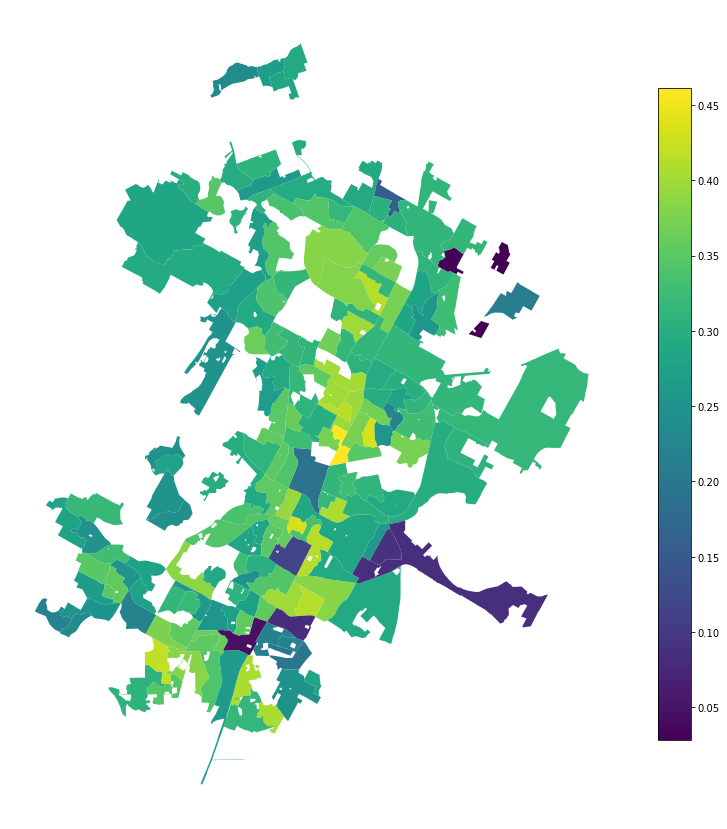

In [ ]:
# Recycling rate in 2020, depicting the areas where people recycle the least
ax = aux_recycling_boundaries.plot(column='ratio', legend=True, figsize=(15, 15), legend_kwds={'shrink': 0.8})
ax.set_axis_off()

### Collection and processing of demographic data

**Imports for the section**

In [ ]:
import pandas as pd
import csv

#### Web Scraping of Tables

Demographic data was scraped from ZipAtlas. We checked whether the website allows web scraping by appending “/robots.txt” to the end of the URL of the website (http://zipatlas.com/robots.txt).

In [ ]:
general_df = pd.read_html("http://zipatlas.com/us/tx/austin/zip-78739.html")
general_df[46]

,0,1,2,3,4
0,Vehicles per household,Number,Percent,Texas Avg.,National Avg.
1,None,8,0.29 %,6.72 %,9.57 %
2,1,326,11.99 %,32.60 %,31.22 %
3,2,1675,61.58 %,37.09 %,34.76 %
4,3 or more,648,23.82 %,14.25 %,15.45 %


**Try to scrap all zip codes**

In [ ]:
zip_codes = [78701, 78702, 78703, 78704, 78705, 78717, 78719, 78721, 78722, 78723, 78724, 78725, 78726, 78727, 78728, 78729, 78730, 78731, 78732, 78733, 78734, 78735, 78736, 78737, 78738, 78739, 78741, 78742, 78744, 78745, 78746, 78747, 78748, 78749, 78750, 78751, 78752, 78753, 78754, 78756, 78757, 78758, 78759]
dic = [8,10,11,13,14,16,18,19,20,22,24,26,28,30,31,33,35,36,38,40,42,44,46,48,50]
table_dic = {}
for zip_code in zip_codes:
    general_df = pd.read_html(f"http://zipatlas.com/us/tx/austin/zip-{zip_code}.html")
    temp = {}
    for table in dic:
        temp[table] = general_df[table]
    table_dic[zip_code] = temp
table_dic

IndexError: ignored

In [ ]:
zip_code

78739

Zip Code 78739 has less tables. After analysing manually, we found out these tables were:
table 46: Rent Payment
teble 48: Rent Payment over Income

Because this Zip Code is the only one in Garbage Route PAN03, then we can't leave this Zip Code out of analyis
Therefore, the table_dic will be populated without zip code 78739, and for this Zip Code the unexsting tables will be populated with values equal to 0 (so we can change those values to the mean of that attributes)

**Scrap possible zip codes**

In [ ]:
table_dic = {}
zip_codes = [78701, 78702, 78703, 78704, 78705, 78717, 78719, 78721, 78722, 78723, 78724, 78725, 78726, 78727, 78728, 78729, 78730, 78731, 78732, 78733, 78734, 78735, 78736, 78737, 78738, 78741, 78742, 78744, 78745, 78746, 78747, 78748, 78749, 78750, 78751, 78752, 78753, 78754, 78756, 78757, 78758, 78759]
dic = [8,10,11,13,14,16,18,19,20,22,24,26,28,30,31,33,35,36,38,40,42,44,46,48,50]
for zip_code in zip_codes:
    general_df = pd.read_html(f"http://zipatlas.com/us/tx/austin/zip-{zip_code}.html")
    temp = {}
    for table in dic:
        temp[table] = general_df[table]
    table_dic[zip_code] = temp

**Populate zip code 78739 with 0, which has 2 missing tables**

In [ ]:
general_df = pd.read_html("http://zipatlas.com/us/tx/austin/zip-78739.html")
temp = {}
dic = [8,10,11,13,14,16,18,19,20,22,24,26,28,30,31,33,35,36,38,40,42,44]
for table in dic:
    temp[table] = general_df[table]
    
# missing tables in source (rent_value & rent_value_over_income). Tables copied form other zip code and changed to 0 (for futur population with avg)
temp[46] = table_dic[78701][46].copy()
for col in temp[46].columns:
    if col != 0:
        temp[46][col].values[:] = 0
temp[48] = table_dic[78701][48].copy()
for col in temp[48].columns:
    if col != 0:
        temp[48][col].values[:] = 0
# last table
temp[50] = general_df[46]
table_dic[78739] = temp

#### Concatenate all Tables from all zipcodes

In [ ]:
df_zip_codes = pd.DataFrame()
for zip_code_key in table_dic:
    df_zip_code = pd.DataFrame()
    for table_key in table_dic[zip_code_key]:
        temp_table = table_dic[zip_code_key][table_key][[0,1]]
        temp_table = temp_table.set_index(0).T.add_prefix(temp_table.iloc(0)[0][0] + '_').iloc[:,1:]
        temp_table = temp_table.rename(index={1:zip_code_key})
        df_zip_code = pd.concat([df_zip_code,temp_table], axis=1)
    df_zip_codes = pd.concat([df_zip_codes,df_zip_code], axis=0)
df_zip_codes.head()

,Gender_Male,Gender_Female,Gender_Males / Female,Gender_Total Population,Age Group_Under 5 years,Age Group_5 to 9 years,Age Group_10 to 14 years,Age Group_15 to 19 years,Age Group_20 to 24 years,Age Group_25 to 34 years,...,Rent payment as a percentage of income_15 to 19 percent,Rent payment as a percentage of income_20 to 24 percent,Rent payment as a percentage of income_25 to 29 percent,Rent payment as a percentage of income_30 to 34 percent,Rent payment as a percentage of income_35 percent or more,Rent payment as a percentage of income_Not computed,Vehicles per household_None,Vehicles per household_1,Vehicles per household_2,Vehicles per household_3 or more
78701,2506,1349,1.86,3855,46,31,35,160,580,988,...,105,145,121,111,358,89,233,1043,412,57
78702,11337,11197,1.01,22534,1986,1978,1915,1832,1861,3387,...,414,360,428,259,1207,435,1946,2912,1784,617
78703,9747,9838,0.99,19585,1203,952,829,711,1345,4965,...,506,636,469,517,1574,216,438,4518,3674,948
78704,22453,20796,1.08,43249,2745,2116,1754,2522,5360,11228,...,2328,2225,1867,1158,4245,518,2227,10399,6548,1449
78705,14128,12697,1.11,26825,200,158,135,8069,11747,3803,...,582,530,477,462,5198,1016,1246,5255,2411,1010


**Populate zip code 78739 with the average of other zip codes**

In [ ]:
columns = list(df_zip_codes.columns)[221:238]
temp_df = df_zip_codes.copy()
temp_df = temp_df.drop(78739)
for column in columns:
    avg = temp_df[column].mean()
    df_zip_codes.at[78739,column] = avg
df_zip_codes.head()

,Gender_Male,Gender_Female,Gender_Males / Female,Gender_Total Population,Age Group_Under 5 years,Age Group_5 to 9 years,Age Group_10 to 14 years,Age Group_15 to 19 years,Age Group_20 to 24 years,Age Group_25 to 34 years,...,Rent payment as a percentage of income_15 to 19 percent,Rent payment as a percentage of income_20 to 24 percent,Rent payment as a percentage of income_25 to 29 percent,Rent payment as a percentage of income_30 to 34 percent,Rent payment as a percentage of income_35 percent or more,Rent payment as a percentage of income_Not computed,Vehicles per household_None,Vehicles per household_1,Vehicles per household_2,Vehicles per household_3 or more
78701,2506.0,1349.0,1.86,3855.0,46.0,31.0,35.0,160.0,580.0,988.0,...,105,145,121,111,358,89,233,1043,412,57
78702,11337.0,11197.0,1.01,22534.0,1986.0,1978.0,1915.0,1832.0,1861.0,3387.0,...,414,360,428,259,1207,435,1946,2912,1784,617
78703,9747.0,9838.0,0.99,19585.0,1203.0,952.0,829.0,711.0,1345.0,4965.0,...,506,636,469,517,1574,216,438,4518,3674,948
78704,22453.0,20796.0,1.08,43249.0,2745.0,2116.0,1754.0,2522.0,5360.0,11228.0,...,2328,2225,1867,1158,4245,518,2227,10399,6548,1449
78705,14128.0,12697.0,1.11,26825.0,200.0,158.0,135.0,8069.0,11747.0,3803.0,...,582,530,477,462,5198,1016,1246,5255,2411,1010


#### Save zip codes demographics to CSV

In [ ]:
df_zip_codes.to_csv("2010census_byzipcode.csv")

### Regression model for total waste collection per route (zone) using demographic data

#### Imports and setup

In [ ]:
# Uncomment to install some of the libraries below
!pip3 install geopandas
!pip3 install shap
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import xgboost
from sklearn.preprocessing import StandardScaler
from google.colab import drive
from matplotlib import rcParams
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

import shap  
import warnings
warnings.filterwarnings("ignore")

In [ ]:
rcParams['figure.figsize'] = 16, 8
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['lines.linewidth'] = 2.

In [ ]:
drive.mount('/content/drive')
working_dir = '/content/drive/MyDrive/Yodas/Scripts'
os.chdir(working_dir)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Load main dataset

In [ ]:
data = pd.read_csv('Waste_Collection___Diversion_Report__daily_.csv')
data['Load Time'] = pd.to_datetime(data['Load Time'], format='%m/%d/%Y %I:%M:%S %p')

# Use Load Time as key timestamp
data.drop('Report Date', axis=1, inplace=True)

data.dropna(subset=['Load Weight'], inplace=True)
data = data[data['Load Weight'] > 0]

# Remove data post July 11, 2021 (the last time this dataset was updated)
data = data[data['Load Time'] < '2021-07-12']

# Remove entries that are likely to be duplicates
data['Load Date'] = pd.to_datetime(data['Load Time'].dt.date)
data = data.drop_duplicates(subset=['Load Type', 'Load Weight', 'Dropoff Site', 'Route Type', 'Route Number', 'Load Date'])

data.drop_duplicates(subset=['Load Type', 'Load Weight', 'Load ID'], keep='last', inplace=True, ignore_index=True)

#### Load garbage route boundaries

In [ ]:
garbage_boundaries = gpd.read_file('Garbage Routes.geojson')
garbage_boundaries.head()

,rt_old,garb_day,landfill,garb_rt,super_num,op_type,garb_sup,geometry
0,None,Thursday,TDS,PAH83,697,Auto,Gilbert,"MULTIPOLYGON (((-97.70618 30.36742, -97.70723 ..."
1,PAM84,Monday,TDS,PAM54,500,Auto,Castillo,"MULTIPOLYGON (((-97.83237 30.16213, -97.83237 ..."
2,None,Monday,TDS,PAM71,596,Auto,Carnline,"MULTIPOLYGON (((-97.72977 30.19009, -97.72103 ..."
3,PAH75,Thursday,TDS,PAH54,500,Auto,Castillo,"MULTIPOLYGON (((-97.65374 30.26269, -97.65322 ..."
4,None,Wednesday,TDS,PAW71,596,Auto,Carnline,"MULTIPOLYGON (((-97.64683 30.38640, -97.64724 ..."


In [ ]:
# Intersect route boundaries dataset with existing dataset, to create garbage dataset
garbage_route_numbers = list(garbage_boundaries['garb_rt'])
garbage_data = data[data['Route Number'].isin(garbage_route_numbers)]
garbage_data['Load Type'].value_counts()
garbage_data = garbage_data[garbage_data['Load Type']=='GARBAGE COLLECTIONS']

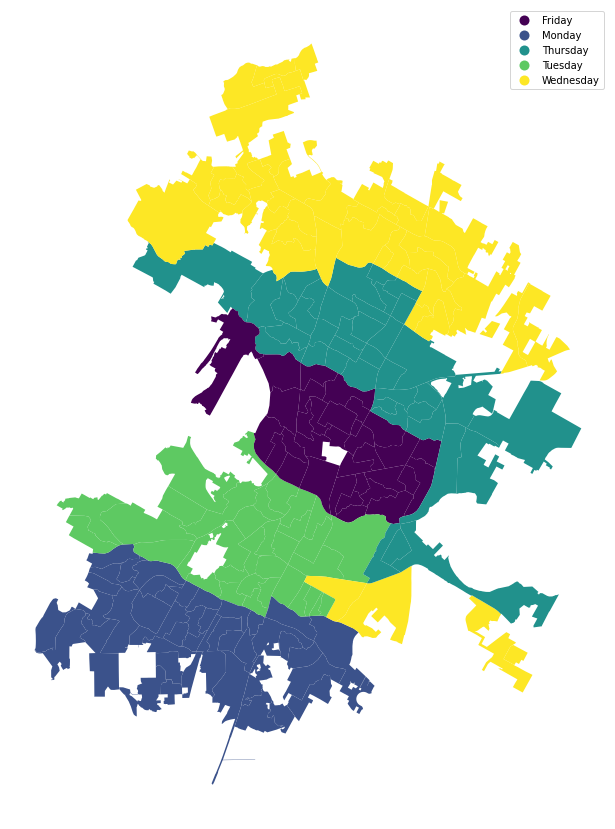

In [ ]:
ax = garbage_boundaries.plot(column='garb_day', cmap='viridis', legend=True, figsize=(15, 15), legend_kwds={'bbox_to_anchor': (1, 1)})
ax.set_axis_off()

**Match zip codes with recycling routes:** 

In [ ]:
zip_codes = gpd.read_file('austin_area_zip_codes.geojson')
for i, route in enumerate(garbage_boundaries['garb_rt']):
  mask = (garbage_boundaries['garb_rt'] == route)
  codes = []
  for j, code in enumerate(zip_codes['zipcode']):
    if garbage_boundaries.loc[i, 'geometry'].intersects(zip_codes.loc[j, 'geometry']):
      codes.append(zip_codes.loc[j, 'zipcode'])

  garbage_boundaries.loc[mask, 'zipcode'] = ' '.join(codes)
  garbage_boundaries.head()

**Matching zip code with population density:**

In [ ]:
population_by_zipcode = pd.read_excel('population_by_zipcode.xlsx')
population_by_zipcode.head()
routes_zip_codes = garbage_boundaries[['garb_rt', 'zipcode']].set_index('garb_rt')

In [ ]:
# Check if all zip codes are listed on the zip code dataset
for zip_codes in garbage_boundaries['zipcode']:
  mask = (garbage_boundaries['zipcode'] == zip_codes)
  zip_codes = zip_codes.split()
  listed_codes = []
  for code in zip_codes:
    if int(code) in list(population_by_zipcode['Zip Code']):
      listed_codes.append(code)

  garbage_boundaries.loc[mask, 'listed zipcode'] = ' '.join(listed_codes)

for zip_codes in garbage_boundaries['listed zipcode']:
  mask = (garbage_boundaries['listed zipcode'] == zip_codes)
  zip_codes = zip_codes.split()

  pop_density = []
  for code in zip_codes:
    if int(code) in list(population_by_zipcode['Zip Code']):
      pop_density.append(population_by_zipcode[population_by_zipcode['Zip Code'] == int(code)]['People / Sq. Mile'].values[0])
  garbage_boundaries.loc[mask, 'People/Sq. Mile'] = np.mean(pop_density)

mask = garbage_boundaries['People/Sq. Mile'].isna()
garbage_boundaries.loc[mask, 'People/Sq. Mile'] = np.nanmean(list(garbage_boundaries['People/Sq. Mile']))
garbage_boundaries.drop('zipcode', axis=1, inplace=True)
garbage_boundaries.rename(columns={'garb_rt': 'route_name'}, inplace=True)
data_garbage_zips = garbage_data.join(other=routes_zip_codes, on='Route Number')

In [ ]:
import pickle
with open("Routes_garbage", "wb") as fp:   #Pickling
  pickle.dump(data_garbage_zips, fp)

#### Matching original dataset with zipcodes 

In [ ]:
garbage_data = garbage_data[garbage_data['Route Number'].isin(garbage_route_numbers)]
garbage_data['date'] = pd.to_datetime(garbage_data['Load Time'].dt.strftime('%Y-%d-%m'), format='%Y-%d-%m')
garbage_data.sort_values(by='date', inplace=True)
garbage_data.reset_index(drop=True, inplace=True)

# Aggregate data by route and date (sum the load weight of each route and day)
garbage_data = garbage_data.groupby(['Route Number', 'Load Date']).agg({'Load Weight': 'sum'}).reset_index() 
garbage_data.sort_values(by='Load Date', inplace=True)
garbage_data['year'] = garbage_data['Load Date'].dt.year
garbage_data.dropna(inplace=True)
garbage_data.head()

,Route Number,Load Date,Load Weight,year
35096,PAM01,2004-02-28,30600.0,2004
79757,PAW60,2004-08-25,38560.0,2004
81477,PAW62,2004-08-25,33600.0,2004
80606,PAW61,2004-08-25,40580.0,2004
5255,PAF60,2004-08-25,26400.0,2004


#### Join demographic data with garbage routes

Get total recycled load in 2010 grouped by route and match it to zip code 

In [ ]:
garbage_data = garbage_data.rename(columns={'Route Number': 'route_name'})
garbage_data_2010 = garbage_data[garbage_data.year== 2010]
garbage_data_2010_by_route = garbage_data_2010.groupby(['route_name']).sum()

Merge with zipcodes

In [ ]:
data_merged = garbage_data_2010_by_route[['Load Weight']].merge(garbage_boundaries[['route_name', 'listed zipcode', 'People/Sq. Mile']],on='route_name')

Match census data with routes based on zipcode

In [ ]:
census_data = pd.read_csv('2010census_byzipcode.csv').rename(columns={'Unnamed: 0':'zipcode'})
census_by_route = []
all_route_zipcodes = []
for ix, row in data_merged.iterrows(): 
  route_zipcodes = row['listed zipcode'].split()
  all_route_zipcodes.append(route_zipcodes)
  for code in route_zipcodes:

    df = census_data[census_data.zipcode==int(code)]
    if len(df)==0: 
      print(code)
    df['route_name'] = row['route_name'] 
    census_by_route.append(df)
  df_cdata = pd.concat(census_by_route)

Create final dataset

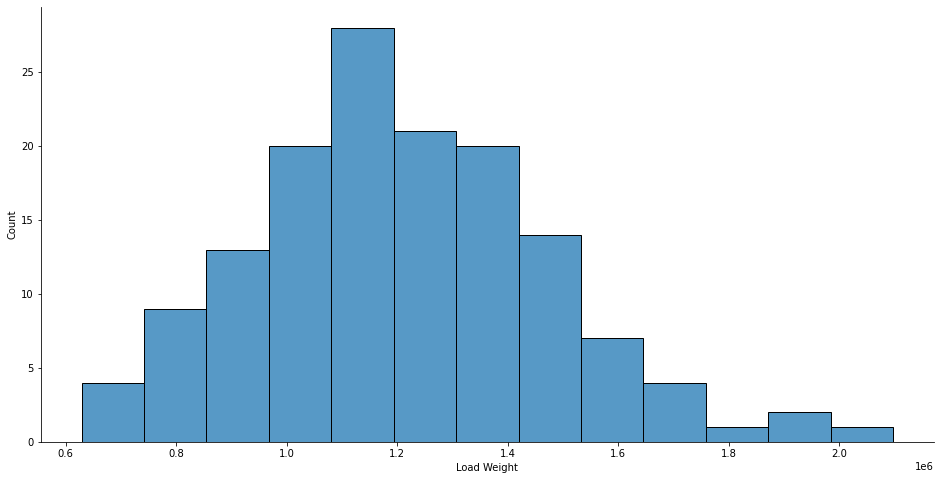

In [ ]:
all_census_data = df_cdata.groupby('route_name').mean()
all_data_merge_census = data_merged.merge(all_census_data, on='route_name') 
all_data = all_data_merge_census.set_index('route_name') 
sns.histplot(data=all_data, x='Load Weight')

#### Remove highly correlated features







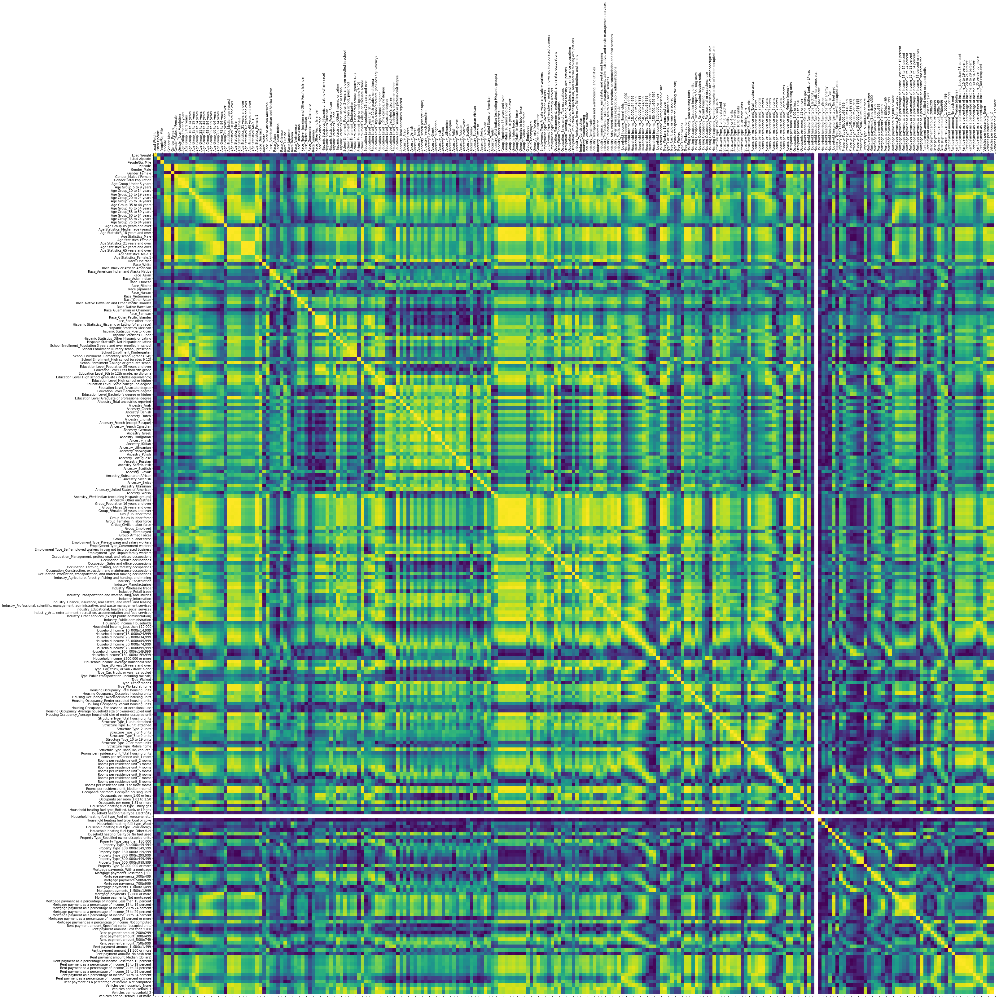

In [ ]:
cor_matrix = all_data.corr().abs()
feature_names = all_data.columns.values

fig = plt.figure(figsize=(50,50))
axes = fig.add_subplot(111)
axes.matshow(cor_matrix)
axes.set_xticks(np.arange(len(feature_names)))
axes.set_xticklabels(list(feature_names), rotation= 90); 
axes.set_yticks(np.arange(len(feature_names)))
axes.set_yticklabels(list(feature_names)); 

There is a large amount of features that are highly correlated, so we will drop the ones that have correlation higher than 0.95.

In [ ]:
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
all_data = all_data.drop(columns=to_drop)
all_data = all_data.dropna(axis='columns')
print('A total of ', len(to_drop), ' features should be removed: ')
print( *to_drop, sep='\n- ')

A total of  135  features should be removed: 
Gender_Female
- Gender_Total Population
- Age Group_5 to 9 years
- Age Group_10 to 14 years
- Age Group_25 to 34 years
- Age Group_35 to 44 years
- Age Group_45 to 54 years
- Age Group_55 to 59 years
- Age Group_60 to 64 years
- Age Group_65 to 74 years
- Age Group_85 years and over
- Age Statistics_18 years and over
- Age Statistics_Male
- Age Statistics_Female
- Age Statistics_21 years and over
- Age Statistics_62 years and over
- Age Statistics_65 years and over
- Age Statistics_Male.1
- Age Statistics_Female.1
- Race_One race
- Race_White
- Race_Some other race
- Hispanic Statistics_Hispanic or Latino (of any race)
- Hispanic Statistics_Mexican
- Hispanic Statistics_Puerto Rican
- Hispanic Statistics_Other Hispanic or Latino
- Hispanic Statistics_Not Hispanic or Latino
- School Enrollment_Population 3 years and over enrolled in school
- School Enrollment_Nursery school, preschool
- School Enrollment_Kindergarten
- School Enrollment_Elem

#### Build model

In [ ]:
y = all_data['Load Weight']
X = all_data.drop(columns=['Load Weight', 'listed zipcode', 'Household heating fuel type_Fuel oil, kerosene, etc.', 'Vehicles per household_None'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
feature_names = X_train.columns.values

**Feature selection**

In [ ]:
reg = ExtraTreesRegressor(n_estimators=100, random_state=0)
model = SelectFromModel(reg, prefit=False).fit(X_train, y_train)
X_train = model.transform(X_train)
X_test = model.transform(X_test)
feature_names = model.get_feature_names_out()
print('Kept Features:', *feature_names, sep='\n- ')

Kept Features:
- People/Sq. Mile
- Gender_Males / Female
- Age Group_20 to 24 years
- Age Statistics_Median age (years)
- Race_Native Hawaiian and Other Pacific Islander
- Race_Other Pacific Islander
- Ancestry_Danish
- Ancestry_Dutch
- Ancestry_Greek
- Group_Armed Forces
- Industry_Agriculture, forestry, fishing and hunting, and mining
- Household Income_Less than $10,000
- Household Income_$10,000 to $14,999
- Household Income_$200,000 or more
- Household Income_Average household size
- Type_Other means
- Housing Occupancy_Average household size of renter-occupied unit
- Structure Type_5 to 9 units
- Structure Type_10 to 19 units
- Rooms per residence unit_1 room
- Rooms per residence unit_Median (rooms)
- Household heating fuel type_Bottled, tank, or LP gas
- Household heating fuel type_No fuel used
- Property Type_$100,000 to $149,999
- Property Type_$300,000 to $499,999
- Mortgage payment as a percentage of income_Not computed
- Rent payment amount_Median (dollars)


Save list of most important features for plots to be done *later*

In [ ]:
import pickle
with open("features_garbage", "wb") as fp:   #Pickling
  pickle.dump(feature_names, fp)

**Scale data**

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

**Model tuning**

In [ ]:
regressor = RandomForestRegressor(random_state = 42)
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 5, stop = 500, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 0.5, 0.3]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(1, 10, num = 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [5, 10, 20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [ 5, 10, 15,20]
# Method of selecting samples for training each tree
bootstrap = [True]
# Create the random grid

param = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
grid_search = RandomizedSearchCV(estimator = regressor, param_distributions= param, n_iter=100,
                      cv = 5, n_jobs = -1, verbose = 3, scoring=['r2','neg_mean_absolute_percentage_error', 'neg_root_mean_squared_error'], refit='neg_mean_absolute_percentage_error')
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, None],
                                        'max_features': ['auto', 0.5, 0.3],
                                        'min_samples_leaf': [5, 10, 15, 20],
                                        'min_samples_split': [5, 10, 20],
                                        'n_estimators': [5, 60, 115, 170, 225,
                                                         280, 335, 390, 445,
                                                         500]},
                   refit='neg_mean_absolute_percentage_error',
                   scoring=['r2', 'neg_mean_absolute_percentage_error',
                            'neg_root_mean_squared_error'],
                   verbose=3)

Best model had a performance of: 0.14625707450875475
Best parameters {'n_estimators': 60, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.5, 'max_depth': 5, 'bootstrap': True}


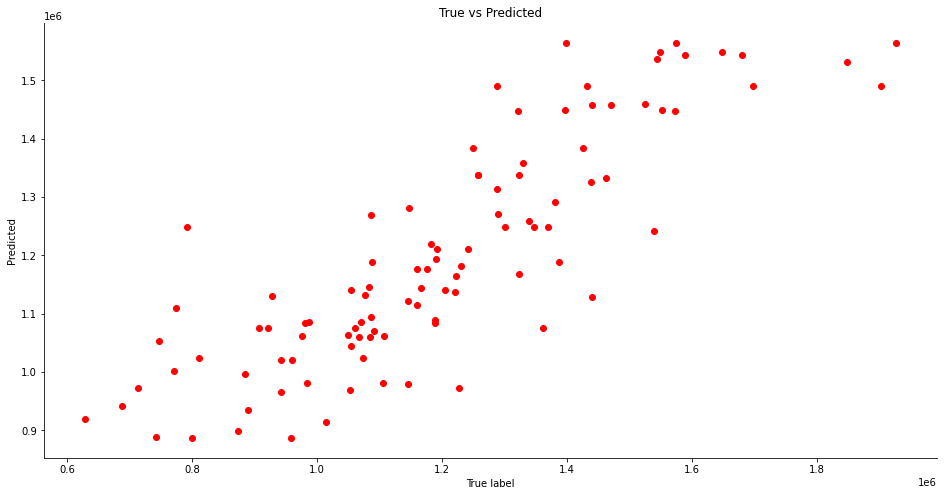

In [ ]:
print('Best model had a performance of:', np.abs(grid_search.best_score_))
y_pred_train = grid_search.predict(X_train)
print('Best parameters', grid_search.best_params_)

plt.scatter(y_train, y_pred_train, color = "red")
plt.title("True vs Predicted")
plt.xlabel("True label")
plt.ylabel("Predicted")
plt.show()

**Evaluate test set**

Performance in the test set: 0.13924972667982247


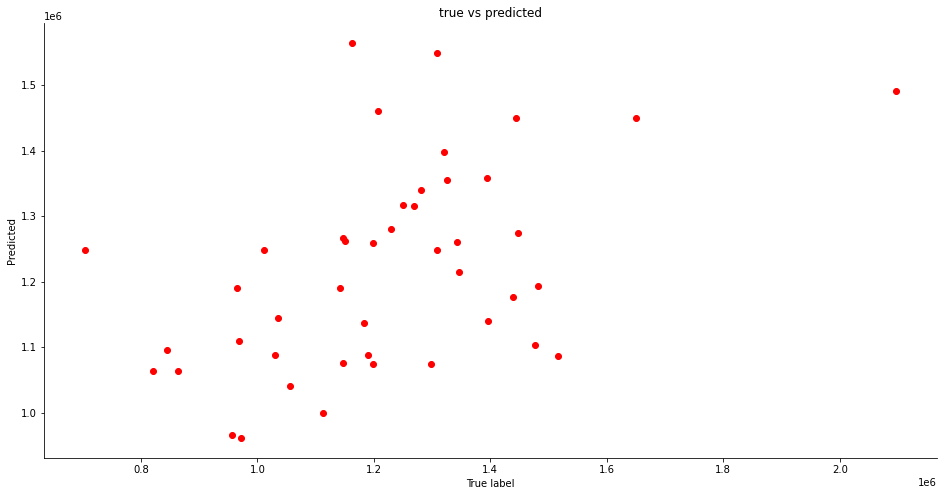

In [ ]:
print('Performance in the test set:', np.abs(grid_search.score(X_test, y_test)))
y_pred_test  = grid_search.predict(X_test)
plt.scatter(y_test, y_pred_test, color = "red")
plt.title("true vs predicted")
plt.xlabel("True label")
plt.ylabel("Predicted")
plt.show()

**Refit model**

In [ ]:
rf = regressor.set_params(**grid_search.best_params_)
rf.fit(X_train,y_train)

RandomForestRegressor(max_depth=5, max_features=0.5, min_samples_leaf=5,
                      min_samples_split=10, n_estimators=60, random_state=42)

#### Feature importance

  0%|          | 0/44 [00:00<?, ?it/s]

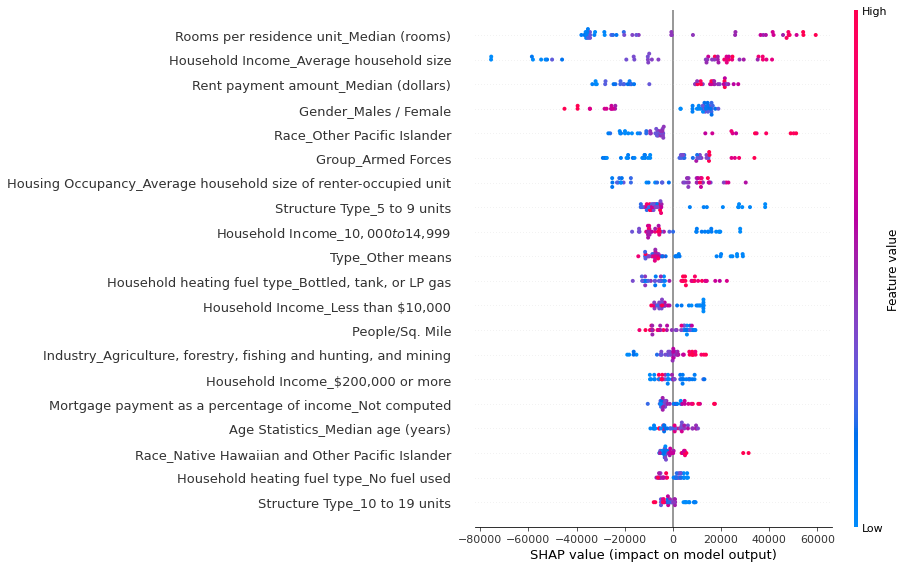

In [ ]:
explainer = shap.KernelExplainer(grid_search.predict, data=X_test) 
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test,  feature_names=feature_names) 

Regarding the demographics used to train the predictive model, we are aware that certain race-related features are a potential source of bias and wondered whether we should drop these features to ensure model fairness. At first, we tried to look for collinearity, but there was no correlation to other features. After careful consideration, we decided to keep them.

Census data are an accurate representation of the geographic distribution of the population in Austin. The race itself should not affect waste, and certain demographic groups share characteristics that are the product of the socio-economic background rather than a cultural background. However, campaigns towards waste disposal awareness might disregard certain demographic groups.

Ultimately, ethics and fairness in AI are complex issues that lack consensus and merit a deeper conversation.

### Regression model for total recycling collection per route (zone) using demographic data

#### Imports and setup

In [ ]:
# Uncomment to install some of the libraries below
!pip3 install geopandas
!pip3 install shap
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import xgboost
from sklearn.preprocessing import StandardScaler
from google.colab import drive
from matplotlib import rcParams
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import shap  
import warnings
warnings.filterwarnings("ignore")

In [ ]:
rcParams['figure.figsize'] = 16, 8
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['lines.linewidth'] = 2.

In [ ]:
drive.mount('/content/drive')
working_dir = '/content/drive/MyDrive/Yodas/Scripts'
os.chdir(working_dir)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Load main dataset

In [ ]:
# Read dataset
data = pd.read_csv('Waste_Collection___Diversion_Report__daily_.csv')
data['Load Time'] = pd.to_datetime(data['Load Time'], format='%m/%d/%Y %I:%M:%S %p')

# Use Load Time as key timestamp
data.drop('Report Date', axis=1, inplace=True)

data.dropna(subset=['Load Weight'], inplace=True)
data = data[data['Load Weight'] > 0]

# Remove data post July 11, 2021 (the last time this dataset was updated)
data = data[data['Load Time'] < '2021-07-12']

# Remove entries that are likely to be duplicates
data['Load Date'] = pd.to_datetime(data['Load Time'].dt.date)
data = data.drop_duplicates(subset=['Load Type', 'Load Weight', 'Dropoff Site', 'Route Type', 'Route Number', 'Load Date'])

data.drop_duplicates(subset=['Load Type', 'Load Weight', 'Load ID'], keep='last', inplace=True, ignore_index=True)

#### Load recycling route boundaries

In [ ]:
recycling_boundaries = gpd.read_file('recycle_routes.geojson')
recycling_boundaries.head()

,created_by,shape_area,area_supervisor,created_date,objectid_1,old_route,objectid,route_name,service_week,shape_length,modified_by,cart_delivery,service_day,modified_date,primary_key,geometry
0,Zimmerman,37060562.8085938,Willie Simmons,2007-10-01T00:00:00+00:00,147,RHBU16,182,RHBU13,B,32863.7931563218,Zimmerman,Oct 10 - Oct 29,Thursday,2020-09-28T00:00:00+00:00,149,"MULTIPOLYGON (((-97.77291 30.36593, -97.77288 ..."
1,Zimmerman,19838551.0253906,Johnny Williams,2007-10-01T00:00:00+00:00,77,RHBU13,93,RHBU53,B,21073.4691183319,Zimmerman,Oct 10 - Oct 29,Thursday,2020-09-28T00:00:00+00:00,78,"MULTIPOLYGON (((-97.76215 30.35763, -97.76207 ..."
2,Zimmerman,10138292.75,Willie Simmons,2007-10-01T00:00:00+00:00,42,RTAU12,49,RTAU12,A,14802.0931359868,Zimmerman,Nov 17 - Dec 2,Tuesday,2020-09-28T00:00:00+00:00,43,"MULTIPOLYGON (((-97.78116 30.22779, -97.78141 ..."
3,Zimmerman,26332018.9570313,Willie Simmons,2007-10-01T00:00:00+00:00,125,RFAU16,148,RFAU11,A,27218.9661254287,Zimmerman,Oct 29 - Nov 15,Friday,2020-10-13T00:00:00+00:00,126,"MULTIPOLYGON (((-97.75838 30.30331, -97.75835 ..."
4,Zimmerman,25537794.7128906,Chris Farr,2007-10-01T00:00:00+00:00,16,RMAS40,18,RMAS40,A,24756.3262855686,Zavala,Dec 2 - Dec 20,Monday,2020-10-01T00:00:00+00:00,16,"MULTIPOLYGON (((-97.79855 30.19531, -97.79823 ..."


In [ ]:
# Intersect route boundaries dataset with existing dataset, to create reclying dataset
route_numbers = list(recycling_boundaries['route_name'])
data_recycling = data[data['Route Number'].isin(route_numbers)]
print(data_recycling['Load Type'].value_counts())
# Mantain only single stream recycling loads
data_recycling = data_recycling[data_recycling['Load Type'] == 'RECYCLING - SINGLE STREAM']

RECYCLING - SINGLE STREAM    89291
RECYCLING - COMINGLE           232
RECYCLING - PAPER              222
SWEEPING                        24
RECYCLED METAL                  16
CONTAMINATED RECYCLING           3
GARBAGE COLLECTIONS              3
Name: Load Type, dtype: int64


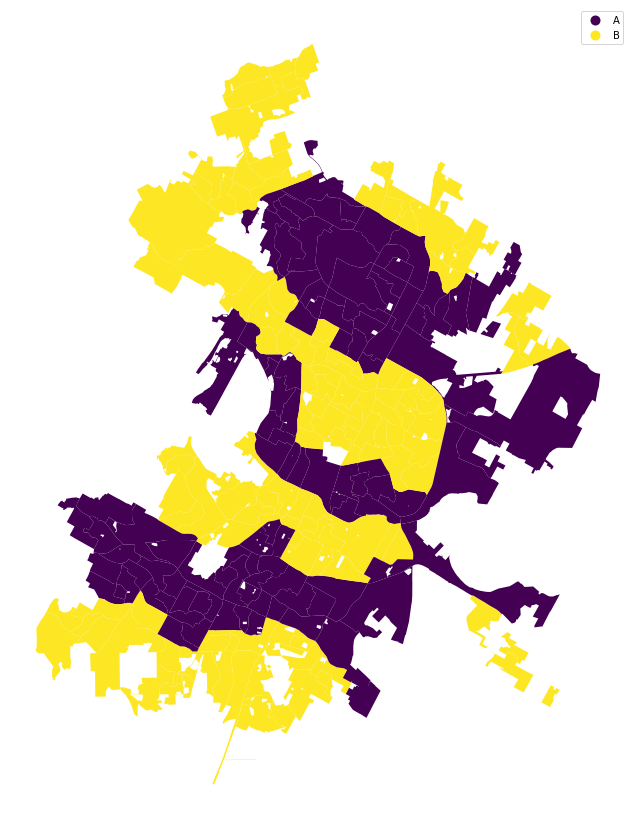

In [ ]:
ax = recycling_boundaries.plot(column='service_week', cmap='viridis', legend=True, figsize=(15, 15), legend_kwds={'bbox_to_anchor': (1, 1)})
ax.set_axis_off()

#### Visualize recycled load collected in 2020

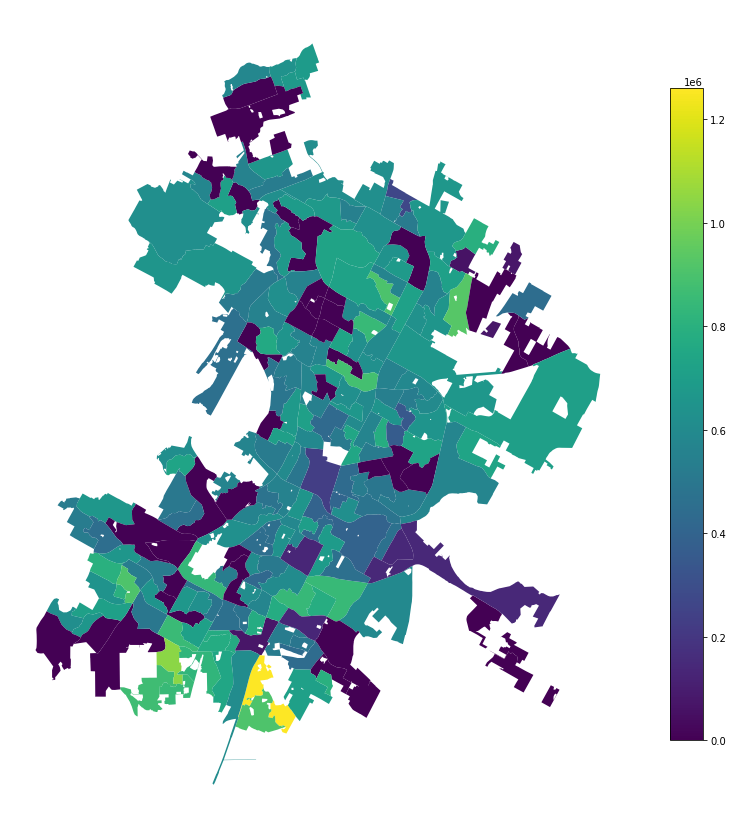

In [ ]:
# Filter 2020 data
data_recycling_2020 = data_recycling[data_recycling['Load Time'].dt.year == 2020]

# Sum load by route
for garb_rt in recycling_boundaries['route_name']:
  recycling_boundaries.loc[recycling_boundaries['route_name'] == garb_rt, 'load'] = data_recycling_2020[data_recycling_2020['Route Number'] == garb_rt]['Load Weight'].sum()
ax = recycling_boundaries.plot(column='load', legend=True, figsize=(15, 15), legend_kwds={'shrink': 0.8})
ax.set_axis_off()

**Match zip codes with recycling routes:** 

In [ ]:
zip_codes = gpd.read_file('austin_area_zip_codes.geojson')

for i, route in enumerate(recycling_boundaries['route_name']):
  mask = (recycling_boundaries['route_name'] == route)
  codes = []
  for j, code in enumerate(zip_codes['zipcode']):
    if recycling_boundaries.loc[i, 'geometry'].intersects(zip_codes.loc[j, 'geometry']):
      codes.append(zip_codes.loc[j, 'zipcode'])

  recycling_boundaries.loc[mask, 'zipcode'] = ' '.join(codes)

Zip codes are associated with more than one route, and each route crosses more than one zip code.

**Matching zip code with population density:**

In [ ]:
population_by_zipcode = pd.read_excel('population_by_zipcode.xlsx')
population_by_zipcode.head()

,Zip Code,Population,People / Sq. Mile
0,78705,26825,11008.66
1,78751,14005,5822.28
2,78752,1803,5435.92
3,78741,40661,5346.47
4,78723,3011,5175.95


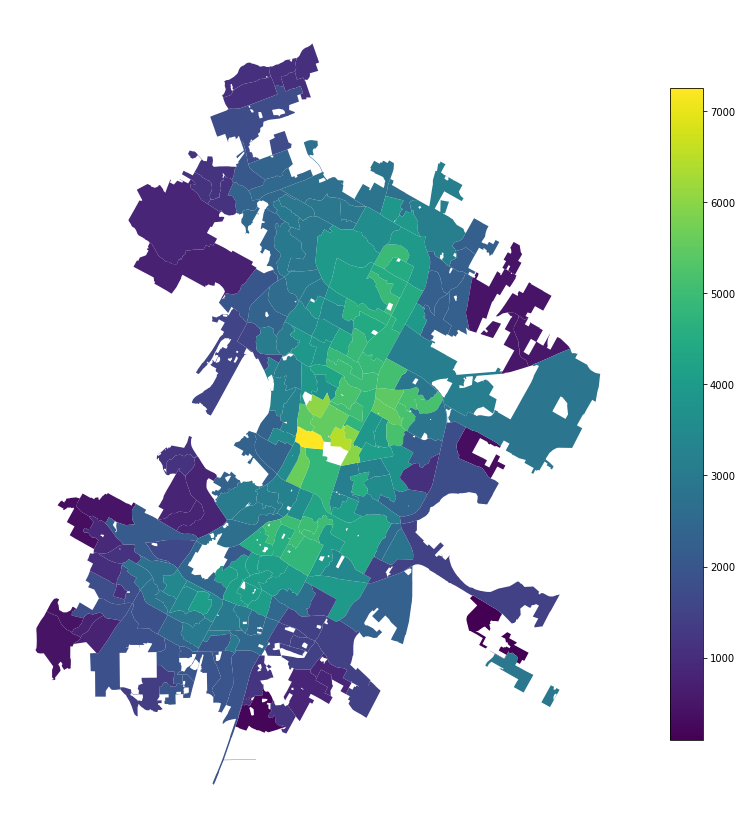

In [ ]:
for zip_codes in recycling_boundaries['zipcode']:
  mask = (recycling_boundaries['zipcode'] == zip_codes)
  zip_codes = zip_codes.split()
  listed_codes = []
  for code in zip_codes:
    if int(code) in list(population_by_zipcode['Zip Code']):
      listed_codes.append(code)

  recycling_boundaries.loc[mask, 'listed zipcode'] = ' '.join(listed_codes)

for zip_codes in recycling_boundaries['listed zipcode']:
  mask = (recycling_boundaries['listed zipcode'] == zip_codes)
  zip_codes = zip_codes.split()

  pop_density = []
  for code in zip_codes:
    if int(code) in list(population_by_zipcode['Zip Code']):
      pop_density.append(population_by_zipcode[population_by_zipcode['Zip Code'] == int(code)]['People / Sq. Mile'].values[0])

  recycling_boundaries.loc[mask, 'People/Sq. Mile'] = np.mean(pop_density)
mask = recycling_boundaries['People/Sq. Mile'].isna()
recycling_boundaries.loc[mask, 'People/Sq. Mile'] = np.nanmean(list(recycling_boundaries['People/Sq. Mile']))
density_by_route = {key: value for (key, value) in zip(list(recycling_boundaries['route_name']), list(recycling_boundaries['People/Sq. Mile']))}
# Population Density in Austin
ax = recycling_boundaries.plot(column='People/Sq. Mile', legend=True, figsize=(15, 15), legend_kwds={'shrink': 0.8})
ax.set_axis_off()

#### Matching original dataset with zipcodes 

In [ ]:
data_recycling['date'] = pd.to_datetime(data_recycling['Load Time'].dt.strftime('%Y-%d-%m'), format='%Y-%d-%m')
data_recycling.sort_values(by='date', inplace=True)
data_recycling.reset_index(drop=True, inplace=True)

# Aggregate data by route and date (sum the load weight of each route and day)
data_recycling = data_recycling.groupby(['Route Number', 'Load Date']).agg({'Load Weight': 'sum'}).reset_index() 
data_recycling.sort_values(by='Load Date', inplace=True)
data_recycling.head()

,Route Number,Load Date,Load Weight
18954,RMAU10,2008-09-15,6780.0
23778,RMBU10,2008-09-15,8720.0
29162,RTAU11,2008-09-16,25620.0
40092,RWAU21,2008-09-17,24800.0
11321,RHAU21,2008-09-18,13540.0


In [ ]:
data_recycling['Population Density'] = data_recycling['Route Number']
data_recycling['Population Density'].replace(density_by_route, inplace=True)
data_recycling['year'] = data_recycling['Load Date'].dt.year
data_recycling.dropna(inplace=True)

#### Join demographic data with recycling routes



Census are from 2010, so we need to get the total recycled load in 2010 grouped by route

In [ ]:
data_recycling = data_recycling.rename(columns={'Route Number': 'route_name'})
data_recycling_2010 = data_recycling[data_recycling.year== 2010]
data_recycling_2010_by_route = data_recycling_2010.groupby(['route_name']).sum()

In [ ]:
# Merge data with zipcodes
data_merged = data_recycling_2010_by_route[['Load Weight']].merge(recycling_boundaries[['route_name', 'listed zipcode', 'People/Sq. Mile']],on='route_name')

Match census data with routes based on zipcode

In [ ]:
census_data = pd.read_csv('2010census_byzipcode.csv').rename(columns={'Unnamed: 0':'zipcode'})
census_by_route = []
all_route_zipcodes = []
for ix, row in data_merged.iterrows(): 
  route_zipcodes = row['listed zipcode'].split()
  all_route_zipcodes.append(route_zipcodes)
  for code in route_zipcodes:

    df = census_data[census_data.zipcode==int(code)]
    if len(df)==0: 
      print(code)
    df['route_name'] = row['route_name'] 
    census_by_route.append(df)
  df_cdata = pd.concat(census_by_route)

Create final dataset

In [ ]:
all_census_data = df_cdata.groupby('route_name').mean()
all_data_merge_census = data_merged.merge(all_census_data, on='route_name') 
all_data = all_data_merge_census.set_index('route_name') 

#### Remove highly correlated features

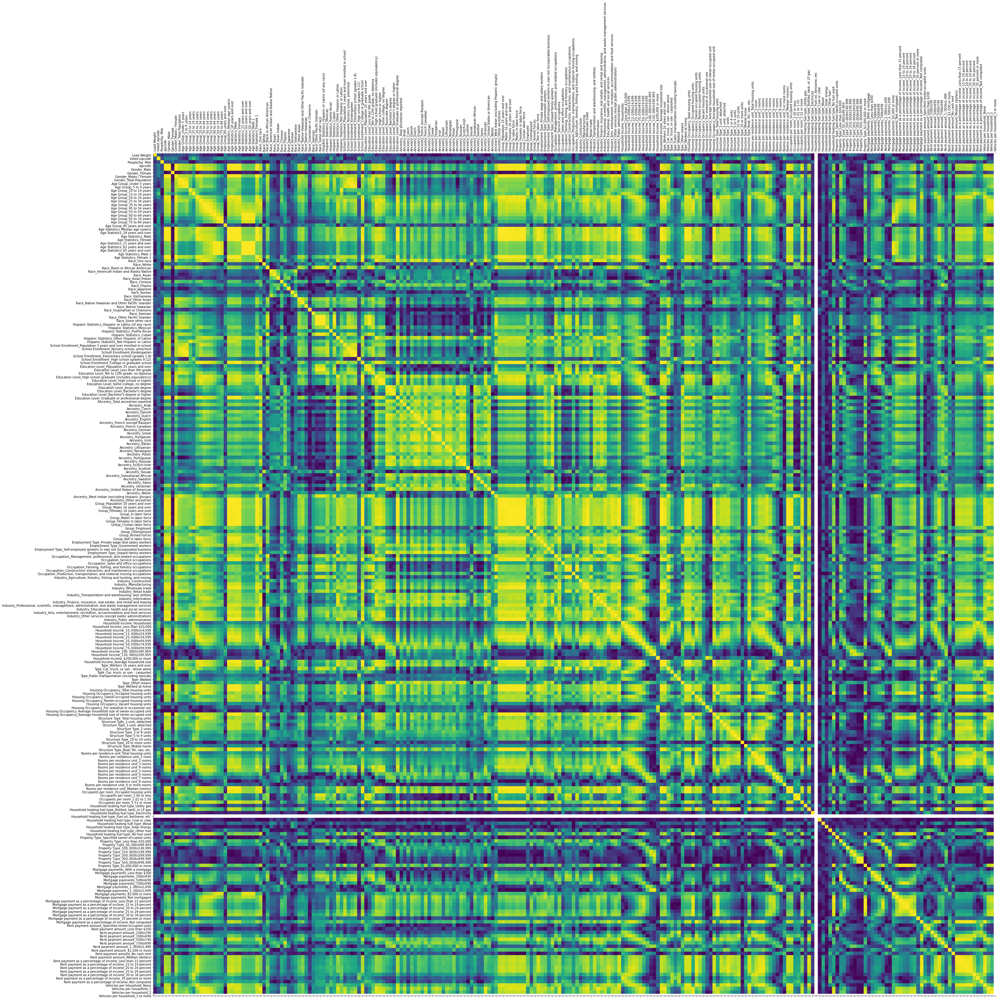

In [ ]:
cor_matrix = all_data.corr().abs()
feature_names = all_data.columns.values

fig = plt.figure(figsize=(50,50))
axes = fig.add_subplot(111)
axes.matshow(cor_matrix)
axes.set_xticks(np.arange(len(feature_names)))
axes.set_xticklabels(list(feature_names), rotation= 90); 
axes.set_yticks(np.arange(len(feature_names)))
axes.set_yticklabels(list(feature_names)); 

There is a large amount of features that are highly correlated, so we will drop the ones that have correlation higher than 0.95

In [ ]:
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
all_data = all_data.drop(columns=to_drop)
all_data = all_data.dropna(axis='columns')
print('A total of ', len(to_drop), ' features should be removed: ')
print( *to_drop, sep='\n- ')

A total of  137  features should be removed: 
Gender_Female
- Gender_Total Population
- Age Group_5 to 9 years
- Age Group_10 to 14 years
- Age Group_25 to 34 years
- Age Group_35 to 44 years
- Age Group_45 to 54 years
- Age Group_55 to 59 years
- Age Group_60 to 64 years
- Age Group_65 to 74 years
- Age Group_85 years and over
- Age Statistics_18 years and over
- Age Statistics_Male
- Age Statistics_Female
- Age Statistics_21 years and over
- Age Statistics_62 years and over
- Age Statistics_65 years and over
- Age Statistics_Male.1
- Age Statistics_Female.1
- Race_One race
- Race_White
- Hispanic Statistics_Hispanic or Latino (of any race)
- Hispanic Statistics_Mexican
- Hispanic Statistics_Other Hispanic or Latino
- Hispanic Statistics_Not Hispanic or Latino
- School Enrollment_Population 3 years and over enrolled in school
- School Enrollment_Nursery school, preschool
- School Enrollment_Kindergarten
- School Enrollment_Elementary school (grades 1-8)
- School Enrollment_High school

The distribution of the data is not uniform, so we will build a different model for loads higher than 200000 and lower than this value. This solution is not ideal, methods, such as label distribution smoothing could be applied to solve this issue and create a single model. 

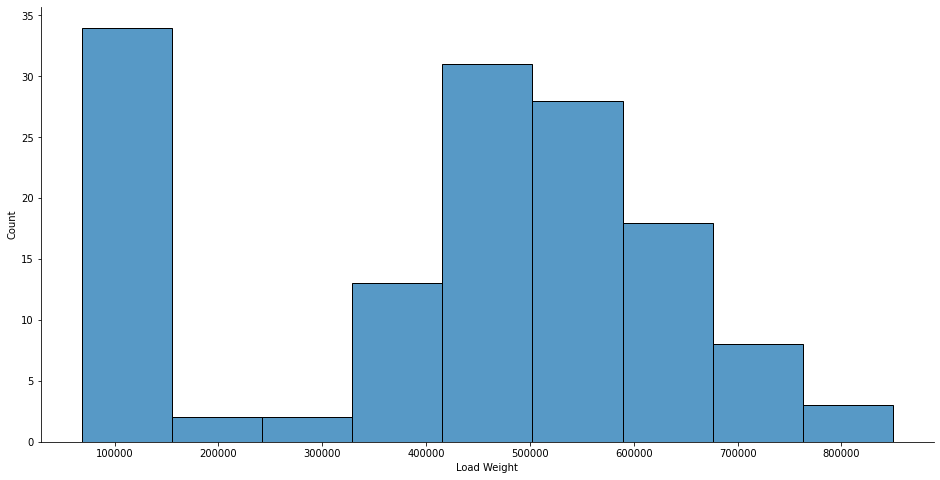

In [ ]:
sns.histplot(data=all_data, x='Load Weight')
all_data_lower = all_data[all_data['Load Weight']<200000]
all_data_higher = all_data[all_data['Load Weight']>=200000]

#### Build model for recycling loads higher than 200 000





In [ ]:
y = all_data_higher['Load Weight']
X = all_data_higher.drop(columns=['Load Weight', 'listed zipcode', 'Household heating fuel type_Fuel oil, kerosene, etc.', 'Vehicles per household_None'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
feature_names = X_train.columns.values

**Feature selection** 

In [ ]:
reg = ExtraTreesRegressor(n_estimators=100, random_state=0)
model = SelectFromModel(reg, prefit=False).fit(X_train, y_train)
X_train = model.transform(X_train)
X_test = model.transform(X_test)
feature_names = model.get_feature_names_out()
print('Kept Features:', *feature_names, sep='\n- ')

Kept Features:
- Age Statistics_Median age (years)
- Race_Black or African American
- Race_Native Hawaiian and Other Pacific Islander
- Race_Samoan
- Race_Other Pacific Islander
- Race_Some other race
- Education Level_Less than 9th grade
- Ancestry_French Canadian
- Ancestry_Portuguese
- Ancestry_Subsaharan African
- Ancestry_Swedish
- Ancestry_Swiss
- Ancestry_Ukrainian
- Group_Unemployed
- Occupation_Farming, fishing, and forestry occupations
- Industry_Agriculture, forestry, fishing and hunting, and mining
- Household Income_$150,000 to $199,999
- Housing Occupancy_Average household size of renter-occupied unit
- Structure Type_Mobile home
- Rooms per residence unit_9 or more rooms
- Household heating fuel type_Bottled, tank, or LP gas
- Household heating fuel type_Solar energy
- Household heating fuel type_No fuel used
- Property Type_Less than $50,000
- Property Type_$150,000 to $199,999
- Mortgage payments_Less than $300
- Mortgage payments_$300 to $499
- Mortgage payments_$1,50

**Scale data**

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

**Save Selected Features**

In [ ]:
import pickle
with open("features_recycle", "wb") as fp:   #Pickling
  pickle.dump(feature_names, fp)

**Model tunning**

In [ ]:
regressor = RandomForestRegressor(random_state = 42)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 5, stop = 500, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 0.5, 0.3,1]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(1, 10, num = 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [5, 10, 20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [ 5, 10, 15,20]
# Method of selecting samples for training each tree
bootstrap = [True]

# Create the random grid
param = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

grid_search = RandomizedSearchCV(estimator = regressor, param_distributions= param, n_iter=100,
                      cv = 5, n_jobs = -1, verbose = 3, scoring=['r2','neg_mean_absolute_percentage_error', 'neg_root_mean_squared_error'], refit='neg_mean_absolute_percentage_error')
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, None],
                                        'max_features': ['auto', 0.5, 0.3, 1],
                                        'min_samples_leaf': [5, 10, 15, 20],
                                        'min_samples_split': [5, 10, 20],
                                        'n_estimators': [5, 60, 115, 170, 225,
                                                         280, 335, 390, 445,
                                                         500]},
                   refit='neg_mean_absolute_percentage_error',
                   scoring=['r2', 'neg_mean_absolute_percentage_error',
                            'neg_root_mean_squared_error'],
                   verbose=3)

The mean absolute percentage error (MAPE) is used as the selection metric

Best model had a performance of: 0.13908062399307558
Best parameters {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 8, 'bootstrap': True}


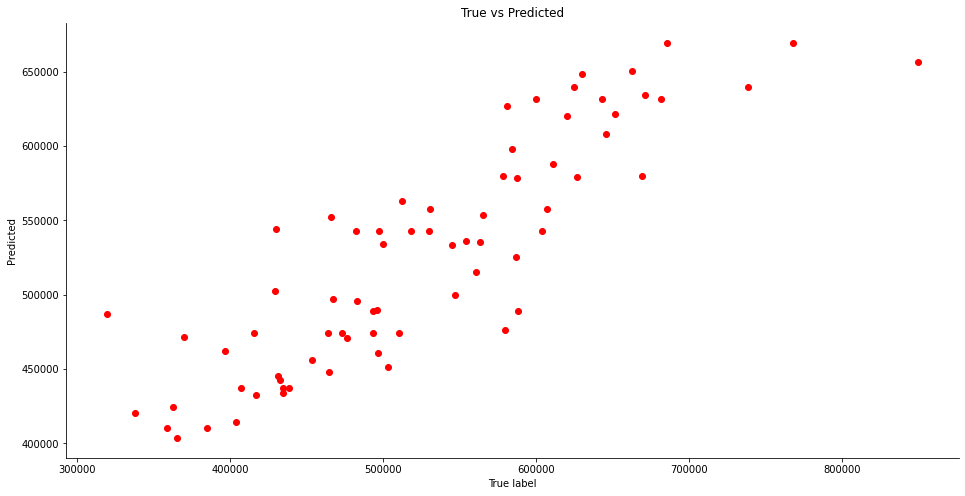

In [ ]:
print('Best model had a performance of:', np.abs(grid_search.best_score_))
y_pred_train = grid_search.predict(X_train)
print('Best parameters', grid_search.best_params_)

plt.scatter(y_train, y_pred_train, color = "red")
plt.title("True vs Predicted")
plt.xlabel("True label")
plt.ylabel("Predicted")
plt.show()

**Evaluate test set** 

Performance in the test set: 0.16063254399627058


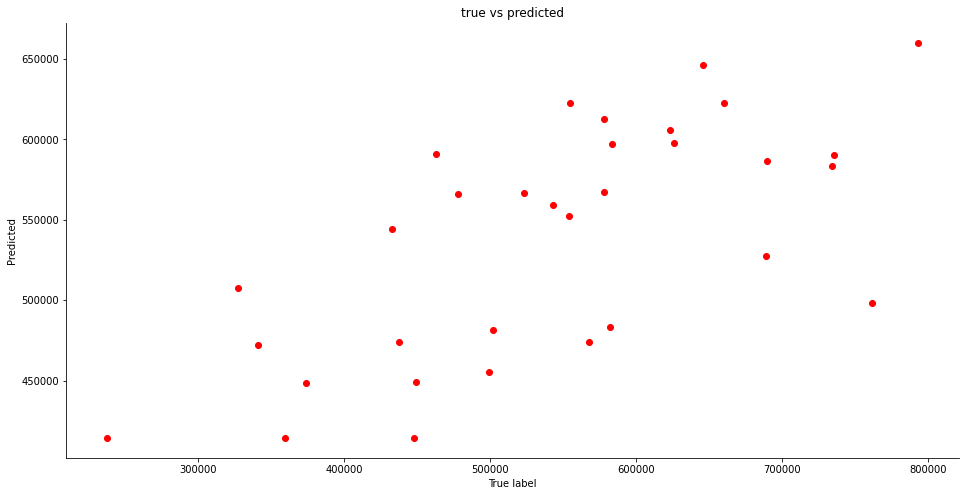

In [ ]:
print('Performance in the test set:', np.abs(grid_search.score(X_test, y_test)))
y_pred_test  = grid_search.predict(X_test)
plt.scatter(y_test, y_pred_test, color = "red")
plt.title("true vs predicted")
plt.xlabel("True label")
plt.ylabel("Predicted")
plt.show()

**Refit model**

In [ ]:
rf = regressor.set_params(**grid_search.best_params_)
rf.fit(X_train,y_train)

RandomForestRegressor(max_depth=8, min_samples_leaf=5, min_samples_split=5,
                      n_estimators=500, random_state=42)

#### Feature Importance for loads higher than 200 000

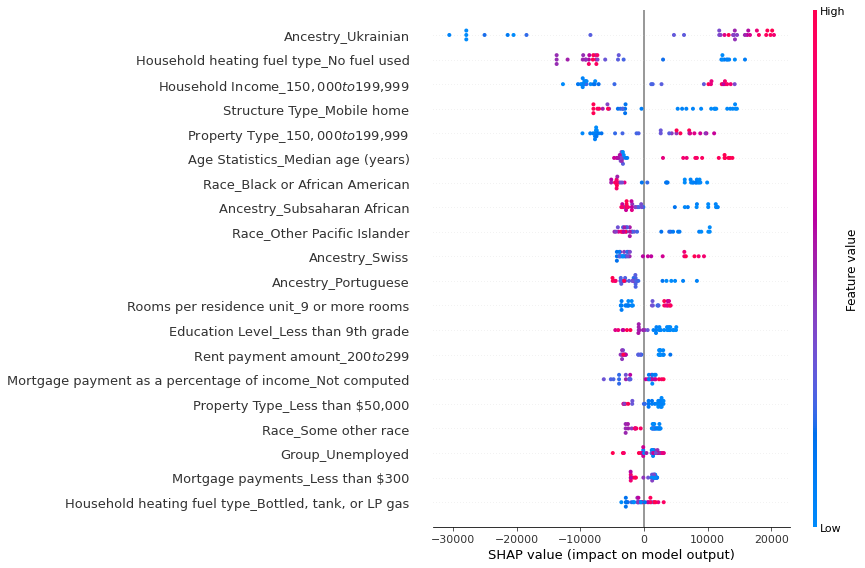

In [ ]:
explainer = shap.TreeExplainer(rf) 
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test,  feature_names=feature_names) 

There are a significative percentage of features in the top 20 related to race. This is most likely due to specific communities located in specific zones of Austin. We debated removing these features due to ethical reasons. However, since biases are subjective and harms can disproportionately affect different groups, we decided to keep them


#### Build model for Load lower than 200 000


In [ ]:
y = all_data_lower['Load Weight']
X = all_data_lower.drop(columns=['Load Weight', 'listed zipcode'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

**Feature selection**

In [ ]:
reg = ExtraTreesRegressor(n_estimators=100, random_state=0)
model = SelectFromModel(reg, prefit=False).fit(X_train, y_train)
X_train = model.transform(X_train)
X_test = model.transform(X_test)
feature_names = model.get_feature_names_out()
print('Kept Features:', *feature_names, sep='\n- ')

Kept Features:
- People/Sq. Mile
- zipcode
- Gender_Males / Female
- Age Group_20 to 24 years
- Age Group_75 to 84 years
- Age Statistics_Median age (years)
- Race_Chinese
- Race_Guamanian or Chamorro
- Race_Samoan
- School Enrollment_College or graduate school
- Ancestry_Danish
- Ancestry_Lithuanian
- Ancestry_Swiss
- Ancestry_Ukrainian
- Group_Not in labor force
- Industry_Agriculture, forestry, fishing and hunting, and mining
- Household Income_Less than $10,000
- Household Income_Average household size
- Type_Other means
- Housing Occupancy_Average household size of owner-occupied unit
- Housing Occupancy_Average household size of renter-occupied unit
- Structure Type_1-unit, attached
- Structure Type_5 to 9 units
- Structure Type_Mobile home
- Rooms per residence unit_1 room
- Rooms per residence unit_9 or more rooms
- Household heating fuel type_Bottled, tank, or LP gas
- Household heating fuel type_Wood
- Property Type_$50,000 to $99,999
- Property Type_$200,000 to $299,999
- Pr

**Scale data**

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

**Parameter tunning**

In [ ]:
regressor = RandomForestRegressor(random_state = 42)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 5, stop = 500, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 0.5, 0.3]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(1, 10, num = 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [5, 10, 20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [ 5, 10, 15,20]
# Method of selecting samples for training each tree
bootstrap = [True]
# Create the random grid

param = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
grid_search = RandomizedSearchCV(estimator = regressor, param_distributions= param, n_iter=100,
                      cv = 5, n_jobs = -1, verbose = 3, scoring=['r2','neg_mean_absolute_percentage_error', 'neg_root_mean_squared_error'], refit='neg_mean_absolute_percentage_error')
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, None],
                                        'max_features': ['auto', 0.5, 0.3],
                                        'min_samples_leaf': [5, 10, 15, 20],
                                        'min_samples_split': [5, 10, 20],
                                        'n_estimators': [5, 60, 115, 170, 225,
                                                         280, 335, 390, 445,
                                                         500]},
                   refit='neg_mean_absolute_percentage_error',
                   scoring=['r2', 'neg_mean_absolute_percentage_error',
                            'neg_root_mean_squared_error'],
                   verbose=3)

Best model had a performance of: 0.14758595158706825
Best parameters {'n_estimators': 225, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 6, 'bootstrap': True}


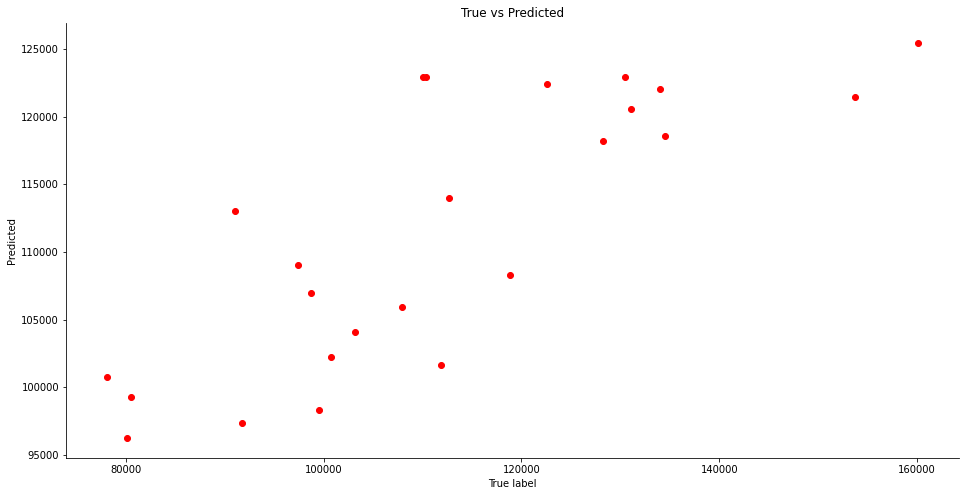

In [ ]:
print('Best model had a performance of:', np.abs(grid_search.best_score_))
y_pred_train = grid_search.predict(X_train)
print('Best parameters', grid_search.best_params_)

plt.scatter(y_train, y_pred_train, color = "red")
plt.title("True vs Predicted")
plt.xlabel("True label")
plt.ylabel("Predicted")
plt.show()

**Evaluate test set**

Performance in the test set: 0.15851345665781136


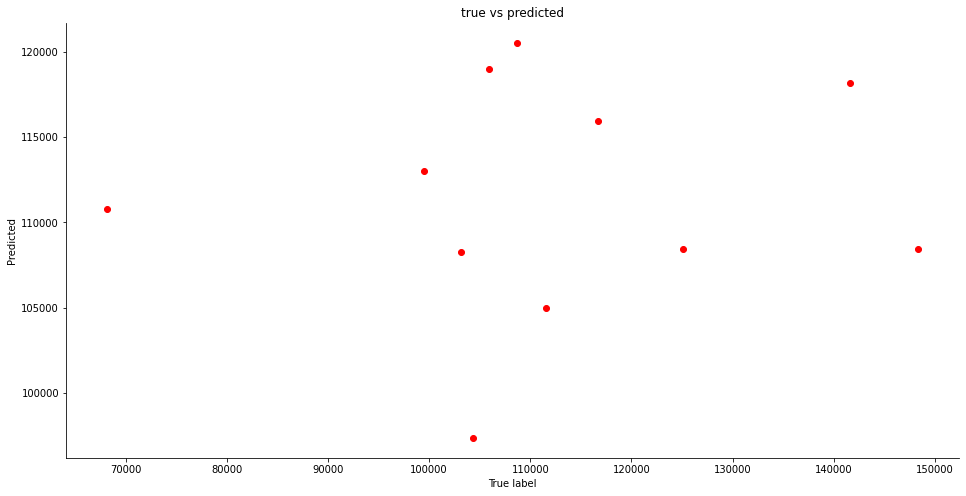

In [ ]:
print('Performance in the test set:', np.abs(grid_search.score(X_test, y_test)))
y_pred_test  = grid_search.predict(X_test)
plt.scatter(y_test, y_pred_test, color = "red")
plt.title("true vs predicted")
plt.xlabel("True label")
plt.ylabel("Predicted")
plt.show()

In [ ]:
rf = regressor.set_params(**grid_search.best_params_)
rf.fit(X_train,y_train)

RandomForestRegressor(max_depth=6, min_samples_leaf=5, min_samples_split=5,
                      n_estimators=225, random_state=42)

#### Feature importance for loads lower than 200 000

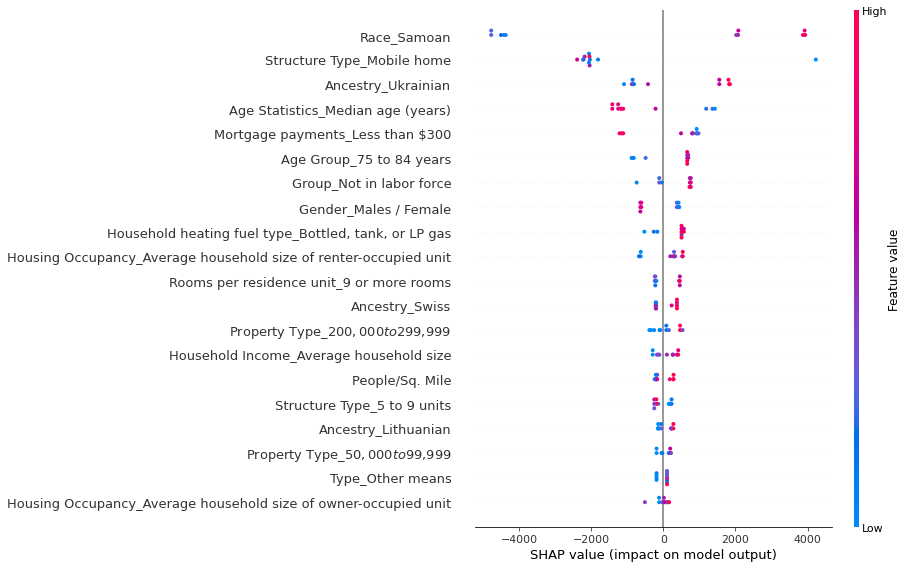

In [ ]:
explainer = shap.TreeExplainer(rf) 
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test,  feature_names=feature_names) 


### Visualization of the most relevant demographic factors

#### Imports for the section

In [ ]:
import geopandas as gpd
import pandas as pd
from google.colab import drive
import os
import numpy as np
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
from matplotlib import rcParams
import pickle

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
rcParams['figure.max_open_warning'] = False

#### Get Data  

**Fetch Zip Codes Spatial Data**

In [ ]:
zip_codes = gpd.read_file('austin_area_zip_codes.geojson')[['zipcode', 'name', 'shape_area', 'geometry']].set_index('zipcode')
zip_codes.index = zip_codes.index.astype(int)

In [ ]:
zip_codes.head()

,name,shape_area,geometry
zipcode,,,
78739,AUSTIN,3.383405e+08,"MULTIPOLYGON (((-97.89002 30.20941, -97.88929 ..."
78645,LEANDER,1.043396e+09,"MULTIPOLYGON (((-97.91075 30.50110, -97.91053 ..."
78602,BASTROP,5.914482e+09,"MULTIPOLYGON (((-97.27371 30.29662, -97.27323 ..."
78655,MARTINDALE,1.846886e+09,"MULTIPOLYGON (((-97.73690 29.78761, -97.73582 ..."
78617,DEL VALLE,1.885224e+09,"MULTIPOLYGON (((-97.51624 30.21906, -97.51600 ..."


**Fetch Demographic Data per Zip Code**

In [ ]:
demographics = pd.read_csv('2010census_byzipcode.csv', index_col=0)

In [ ]:
demographics.head()

,Gender_Male,Gender_Female,Gender_Males / Female,Gender_Total Population,Age Group_Under 5 years,Age Group_5 to 9 years,Age Group_10 to 14 years,Age Group_15 to 19 years,Age Group_20 to 24 years,Age Group_25 to 34 years,Age Group_35 to 44 years,Age Group_45 to 54 years,Age Group_55 to 59 years,Age Group_60 to 64 years,Age Group_65 to 74 years,Age Group_75 to 84 years,Age Group_85 years and over,Age Statistics_Median age (years),Age Statistics_18 years and over,Age Statistics_Male,Age Statistics_Female,Age Statistics_21 years and over,Age Statistics_62 years and over,Age Statistics_65 years and over,Age Statistics_Male.1,Age Statistics_Female.1,Race_One race,Race_White,Race_Black or African American,Race_American Indian and Alaska Native,Race_Asian,Race_Asian Indian,Race_Chinese,Race_Filipino,Race_Japanese,Race_Korean,Race_Vietnamese,Race_Other Asian,Race_Native Hawaiian and Other Pacific Islander,Race_Native Hawaiian,Race_Guamanian or Chamorro,Race_Samoan,Race_Other Pacific Islander,Race_Some other race,Hispanic Statistics_Hispanic or Latino (of any race),Hispanic Statistics_Mexican,Hispanic Statistics_Puerto Rican,Hispanic Statistics_Cuban,Hispanic Statistics_Other Hispanic or Latino,Hispanic Statistics_Not Hispanic or Latino,School Enrollment_Population 3 years and over enrolled in school,"School Enrollment_Nursery school, preschool",School Enrollment_Kindergarten,School Enrollment_Elementary school (grades 1-8),School Enrollment_High school (grades 9-12),School Enrollment_College or graduate school,Education Level_Population 25 years and over,Education Level_Less than 9th grade,"Education Level_9th to 12th grade, no diploma",Education Level_High school graduate (includes equivalency),Education Level_High school or higher,"Education Level_Some college, no degree",Education Level_Associate degree,Education Level_Bachelor's degree,Education Level_Bachelor's degree or higher,Education Level_Graduate or professional degree,Ancestry_Total ancestries reported,Ancestry_Arab,Ancestry_Czech,Ancestry_Danish,Ancestry_Dutch,Ancestry_English,Ancestry_French (except Basque),Ancestry_French Canadian,Ancestry_German,Ancestry_Greek,Ancestry_Hungarian,Ancestry_Irish,Ancestry_Italian,Ancestry_Lithuanian,Ancestry_Norwegian,Ancestry_Polish,Ancestry_Portuguese,Ancestry_Russian,Ancestry_Scotch-Irish,Ancestry_Scottish,Ancestry_Slovak,Ancestry_Subsaharan African,Ancestry_Swedish,Ancestry_Swiss,Ancestry_Ukrainian,Ancestry_United States or American,Ancestry_Welsh,Ancestry_West Indian (excluding Hispanic groups),Ancestry_Other ancestries,Group_Population 16 years and over,Group_Males 16 years and over,Group_Females 16 years and over,Group_In labor force,Group_Males in labor force,Group_Females in labor force,Group_Civilian labor force,Group_Employed,Group_Unemployed,Group_Unemployment level,Group_Armed Forces,Group_Not in labor force,Employment Type_Private wage and salary workers,Employment Type_Government workers,Employment Type_Self-employed workers in own not incorporated business,Employment Type_Unpaid family workers,"Occupation_Management, professional, and related occupations",Occupation_Service occupations,Occupation_Sales and office occupations,"Occupation_Farming, fishing, and forestry occupations","Occupation_Construction, extraction, and maintenance occupations","Occupation_Production, transportation, and material moving occupations","Industry_Agriculture, forestry, fishing and hunting, and mining",Industry_Construction,Industry_Manufacturing,Industry_Wholesale trade,Industry_Retail trade,"Industry_Transportation and warehousing, and utilities",Industry_Information,"Industry_Finance, insurance, real estate, and rental and leasing","Industry_Professional, scientific, management, administrative, and waste management services","Industry_Educational, health and social services","Industry_Arts, entertainment, recreation, accommodation and food services",Industry_Other services (except public administration),Industry_Public administration,Househo

**Fetch Garbage Routes**

In [ ]:
garbage_boundaries = gpd.read_file('garbage_routes.geojson')

In [ ]:
garbage_boundaries.head()

,rt_old,garb_day,landfill,garb_rt,super_num,op_type,garb_sup,geometry
0,None,Thursday,TDS,PAH83,697,Auto,Gilbert,"MULTIPOLYGON (((-97.70618 30.36742, -97.70723 ..."
1,PAM84,Monday,TDS,PAM54,500,Auto,Castillo,"MULTIPOLYGON (((-97.83237 30.16213, -97.83237 ..."
2,None,Monday,TDS,PAM71,596,Auto,Carnline,"MULTIPOLYGON (((-97.72977 30.19009, -97.72103 ..."
3,PAH75,Thursday,TDS,PAH54,500,Auto,Castillo,"MULTIPOLYGON (((-97.65374 30.26269, -97.65322 ..."
4,None,Wednesday,TDS,PAW71,596,Auto,Carnline,"MULTIPOLYGON (((-97.64683 30.38640, -97.64724 ..."


**Fetch Recycling Routes**

In [ ]:
recycle_boundaries = gpd.read_file('recycle_routes.geojson')

In [ ]:
recycle_boundaries.head()

,created_by,shape_area,area_supervisor,created_date,objectid_1,old_route,objectid,route_name,service_week,shape_length,modified_by,cart_delivery,service_day,modified_date,primary_key,geometry
0,Zimmerman,37060562.8085938,Willie Simmons,2007-10-01T00:00:00+00:00,147,RHBU16,182,RHBU13,B,32863.7931563218,Zimmerman,Oct 10 - Oct 29,Thursday,2020-09-28T00:00:00+00:00,149,"MULTIPOLYGON (((-97.77291 30.36593, -97.77288 ..."
1,Zimmerman,19838551.0253906,Johnny Williams,2007-10-01T00:00:00+00:00,77,RHBU13,93,RHBU53,B,21073.4691183319,Zimmerman,Oct 10 - Oct 29,Thursday,2020-09-28T00:00:00+00:00,78,"MULTIPOLYGON (((-97.76215 30.35763, -97.76207 ..."
2,Zimmerman,10138292.75,Willie Simmons,2007-10-01T00:00:00+00:00,42,RTAU12,49,RTAU12,A,14802.0931359868,Zimmerman,Nov 17 - Dec 2,Tuesday,2020-09-28T00:00:00+00:00,43,"MULTIPOLYGON (((-97.78116 30.22779, -97.78141 ..."
3,Zimmerman,26332018.9570313,Willie Simmons,2007-10-01T00:00:00+00:00,125,RFAU16,148,RFAU11,A,27218.9661254287,Zimmerman,Oct 29 - Nov 15,Friday,2020-10-13T00:00:00+00:00,126,"MULTIPOLYGON (((-97.75838 30.30331, -97.75835 ..."
4,Zimmerman,25537794.7128906,Chris Farr,2007-10-01T00:00:00+00:00,16,RMAS40,18,RMAS40,A,24756.3262855686,Zavala,Dec 2 - Dec 20,Monday,2020-10-01T00:00:00+00:00,16,"MULTIPOLYGON (((-97.79855 30.19531, -97.79823 ..."


**Fetch Population by Zip Code**

In [ ]:
population_by_zipcode = pd.read_excel('population_by_zipcode.xlsx').set_index('Zip Code').rename(columns={'People / Sq. Mile': 'People/Sq. Mile'})

In [ ]:
population_by_zipcode.head()

,Population,People/Sq. Mile
Zip Code,,
78705,26825,11008.66
78751,14005,5822.28
78752,1803,5435.92
78741,40661,5346.47
78723,3011,5175.95


#### Build tables for plots

**Join Demographics with coordinates shapes**

In [ ]:
demographics_zip_codes = demographics.join(other=zip_codes)
assert len(demographics_zip_codes) == len(demographics)
print(len(demographics_zip_codes))

43


**Join Zip Codes with Population**

In [ ]:
demographics_zip_codes = demographics_zip_codes.join(other=population_by_zipcode)

In [ ]:
demographics_zip_codes.head(2)

,Gender_Male,Gender_Female,Gender_Males / Female,Gender_Total Population,Age Group_Under 5 years,Age Group_5 to 9 years,Age Group_10 to 14 years,Age Group_15 to 19 years,Age Group_20 to 24 years,Age Group_25 to 34 years,Age Group_35 to 44 years,Age Group_45 to 54 years,Age Group_55 to 59 years,Age Group_60 to 64 years,Age Group_65 to 74 years,Age Group_75 to 84 years,Age Group_85 years and over,Age Statistics_Median age (years),Age Statistics_18 years and over,Age Statistics_Male,Age Statistics_Female,Age Statistics_21 years and over,Age Statistics_62 years and over,Age Statistics_65 years and over,Age Statistics_Male.1,Age Statistics_Female.1,Race_One race,Race_White,Race_Black or African American,Race_American Indian and Alaska Native,Race_Asian,Race_Asian Indian,Race_Chinese,Race_Filipino,Race_Japanese,Race_Korean,Race_Vietnamese,Race_Other Asian,Race_Native Hawaiian and Other Pacific Islander,Race_Native Hawaiian,Race_Guamanian or Chamorro,Race_Samoan,Race_Other Pacific Islander,Race_Some other race,Hispanic Statistics_Hispanic or Latino (of any race),Hispanic Statistics_Mexican,Hispanic Statistics_Puerto Rican,Hispanic Statistics_Cuban,Hispanic Statistics_Other Hispanic or Latino,Hispanic Statistics_Not Hispanic or Latino,School Enrollment_Population 3 years and over enrolled in school,"School Enrollment_Nursery school, preschool",School Enrollment_Kindergarten,School Enrollment_Elementary school (grades 1-8),School Enrollment_High school (grades 9-12),School Enrollment_College or graduate school,Education Level_Population 25 years and over,Education Level_Less than 9th grade,"Education Level_9th to 12th grade, no diploma",Education Level_High school graduate (includes equivalency),Education Level_High school or higher,"Education Level_Some college, no degree",Education Level_Associate degree,Education Level_Bachelor's degree,Education Level_Bachelor's degree or higher,Education Level_Graduate or professional degree,Ancestry_Total ancestries reported,Ancestry_Arab,Ancestry_Czech,Ancestry_Danish,Ancestry_Dutch,Ancestry_English,Ancestry_French (except Basque),Ancestry_French Canadian,Ancestry_German,Ancestry_Greek,Ancestry_Hungarian,Ancestry_Irish,Ancestry_Italian,Ancestry_Lithuanian,Ancestry_Norwegian,Ancestry_Polish,Ancestry_Portuguese,Ancestry_Russian,Ancestry_Scotch-Irish,Ancestry_Scottish,Ancestry_Slovak,Ancestry_Subsaharan African,Ancestry_Swedish,Ancestry_Swiss,Ancestry_Ukrainian,Ancestry_United States or American,Ancestry_Welsh,Ancestry_West Indian (excluding Hispanic groups),Ancestry_Other ancestries,Group_Population 16 years and over,Group_Males 16 years and over,Group_Females 16 years and over,Group_In labor force,Group_Males in labor force,Group_Females in labor force,Group_Civilian labor force,Group_Employed,Group_Unemployed,Group_Unemployment level,Group_Armed Forces,Group_Not in labor force,Employment Type_Private wage and salary workers,Employment Type_Government workers,Employment Type_Self-employed workers in own not incorporated business,Employment Type_Unpaid family workers,"Occupation_Management, professional, and related occupations",Occupation_Service occupations,Occupation_Sales and office occupations,"Occupation_Farming, fishing, and forestry occupations","Occupation_Construction, extraction, and maintenance occupations","Occupation_Production, transportation, and material moving occupations","Industry_Agriculture, forestry, fishing and hunting, and mining",Industry_Construction,Industry_Manufacturing,Industry_Wholesale trade,Industry_Retail trade,"Industry_Transportation and warehousing, and utilities",Industry_Information,"Industry_Finance, insurance, real estate, and rental and leasing","Industry_Professional, scientific, management, administrative, and waste management services","Industry_Educational, health and social services","Industry_Arts, entertainment, recreation, accommodation and food services",Industry_Other services (except public administration),Industry_Public administration,Househo

#### Plot Routes and Zip Codes

**Create GeoPandas DataFrame**

In [ ]:
gdp_demographics_zip_codes = gpd.GeoDataFrame(demographics_zip_codes)

**Garbage Routes**

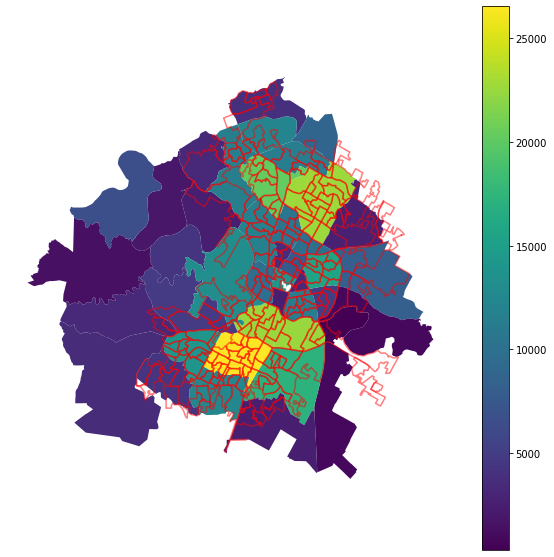

In [ ]:
ax = gdp_demographics_zip_codes.plot(column='Gender_Male', cmap='viridis', figsize=(10,10), legend=True)
garbage_boundaries.boundary.plot(ax=ax, color='red', alpha=.5)


ax.set_axis_off()

**Recycling Routes**

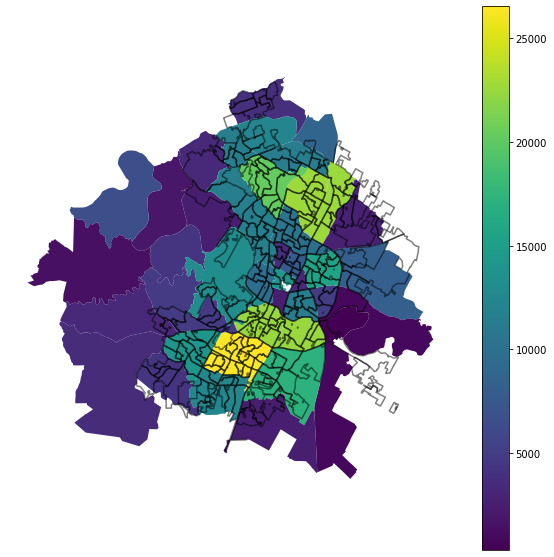

In [ ]:
ax = gdp_demographics_zip_codes.plot(column='Gender_Male', cmap='viridis', figsize=(10,10), legend=True)
recycle_boundaries.boundary.plot(ax=ax, color='black', alpha=.5)
ax.set_axis_off()

#### Plot Zip Codes with Demographic Data

In [ ]:
check_zip = zip_codes.join(other=demographics)
check_zip.head()

,name,shape_area,geometry,Gender_Male,Gender_Female,Gender_Males / Female,Gender_Total Population,Age Group_Under 5 years,Age Group_5 to 9 years,Age Group_10 to 14 years,Age Group_15 to 19 years,Age Group_20 to 24 years,Age Group_25 to 34 years,Age Group_35 to 44 years,Age Group_45 to 54 years,Age Group_55 to 59 years,Age Group_60 to 64 years,Age Group_65 to 74 years,Age Group_75 to 84 years,Age Group_85 years and over,Age Statistics_Median age (years),Age Statistics_18 years and over,Age Statistics_Male,Age Statistics_Female,Age Statistics_21 years and over,Age Statistics_62 years and over,Age Statistics_65 years and over,Age Statistics_Male.1,Age Statistics_Female.1,Race_One race,Race_White,Race_Black or African American,Race_American Indian and Alaska Native,Race_Asian,Race_Asian Indian,Race_Chinese,Race_Filipino,Race_Japanese,Race_Korean,Race_Vietnamese,Race_Other Asian,Race_Native Hawaiian and Other Pacific Islander,Race_Native Hawaiian,Race_Guamanian or Chamorro,Race_Samoan,Race_Other Pacific Islander,Race_Some other race,Hispanic Statistics_Hispanic or Latino (of any race),Hispanic Statistics_Mexican,Hispanic Statistics_Puerto Rican,Hispanic Statistics_Cuban,Hispanic Statistics_Other Hispanic or Latino,Hispanic Statistics_Not Hispanic or Latino,School Enrollment_Population 3 years and over enrolled in school,"School Enrollment_Nursery school, preschool",School Enrollment_Kindergarten,School Enrollment_Elementary school (grades 1-8),School Enrollment_High school (grades 9-12),School Enrollment_College or graduate school,Education Level_Population 25 years and over,Education Level_Less than 9th grade,"Education Level_9th to 12th grade, no diploma",Education Level_High school graduate (includes equivalency),Education Level_High school or higher,"Education Level_Some college, no degree",Education Level_Associate degree,Education Level_Bachelor's degree,Education Level_Bachelor's degree or higher,Education Level_Graduate or professional degree,Ancestry_Total ancestries reported,Ancestry_Arab,Ancestry_Czech,Ancestry_Danish,Ancestry_Dutch,Ancestry_English,Ancestry_French (except Basque),Ancestry_French Canadian,Ancestry_German,Ancestry_Greek,Ancestry_Hungarian,Ancestry_Irish,Ancestry_Italian,Ancestry_Lithuanian,Ancestry_Norwegian,Ancestry_Polish,Ancestry_Portuguese,Ancestry_Russian,Ancestry_Scotch-Irish,Ancestry_Scottish,Ancestry_Slovak,Ancestry_Subsaharan African,Ancestry_Swedish,Ancestry_Swiss,Ancestry_Ukrainian,Ancestry_United States or American,Ancestry_Welsh,Ancestry_West Indian (excluding Hispanic groups),Ancestry_Other ancestries,Group_Population 16 years and over,Group_Males 16 years and over,Group_Females 16 years and over,Group_In labor force,Group_Males in labor force,Group_Females in labor force,Group_Civilian labor force,Group_Employed,Group_Unemployed,Group_Unemployment level,Group_Armed Forces,Group_Not in labor force,Employment Type_Private wage and salary workers,Employment Type_Government workers,Employment Type_Self-employed workers in own not incorporated business,Employment Type_Unpaid family workers,"Occupation_Management, professional, and related occupations",Occupation_Service occupations,Occupation_Sales and office occupations,"Occupation_Farming, fishing, and forestry occupations","Occupation_Construction, extraction, and maintenance occupations","Occupation_Production, transportation, and material moving occupations","Industry_Agriculture, forestry, fishing and hunting, and mining",Industry_Construction,Industry_Manufacturing,Industry_Wholesale trade,Industry_Retail trade,"Industry_Transportation and warehousing, and utilities",Industry_Information,"Industry_Finance, insurance, real estate, and rental and leasing","Industry_Professional, scientific, management, administrative, and waste management services","Industry_Educational, health and social services","Industry_Arts, entertainment, recreation, accommodation and food services",Industry_Other services (except public administration),Industry_Publ

In [ ]:
check_zip['does_not_have_demographics'] = check_zip['Gender_Male'].isnull()

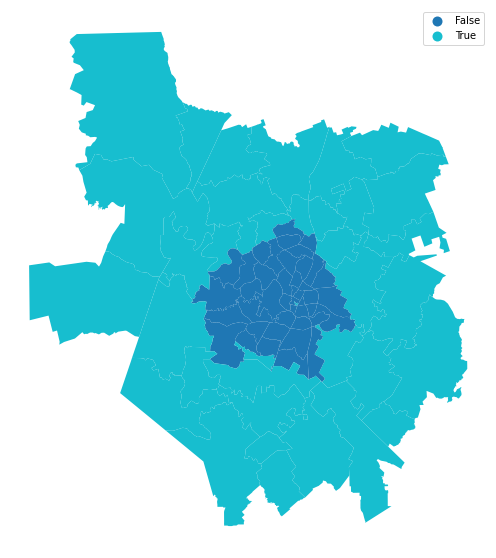

In [ ]:
ax = check_zip.plot(column='does_not_have_demographics', categorical=True, legend=True, figsize=(10,10))
ax.set_axis_off()

#### Demographic Absolute Values Maps

**Read most important features from Garbage and Recycle Models**

In [ ]:
with open("features_recycle", "rb") as fp:   # Unpickling
  features_recycle = pickle.load(fp)

print("Features:", *features_recycle, sep='\n-')

Features:
-Age Statistics_Median age (years)
-Race_Black or African American
-Race_Native Hawaiian and Other Pacific Islander
-Race_Samoan
-Race_Other Pacific Islander
-Race_Some other race
-Education Level_Less than 9th grade
-Ancestry_French Canadian
-Ancestry_Portuguese
-Ancestry_Subsaharan African
-Ancestry_Swedish
-Ancestry_Swiss
-Ancestry_Ukrainian
-Group_Unemployed
-Occupation_Farming, fishing, and forestry occupations
-Industry_Agriculture, forestry, fishing and hunting, and mining
-Household Income_$150,000 to $199,999
-Housing Occupancy_Average household size of renter-occupied unit
-Structure Type_Mobile home
-Rooms per residence unit_9 or more rooms
-Household heating fuel type_Bottled, tank, or LP gas
-Household heating fuel type_Solar energy
-Household heating fuel type_No fuel used
-Property Type_Less than $50,000
-Property Type_$150,000 to $199,999
-Mortgage payments_Less than $300
-Mortgage payments_$300 to $499
-Mortgage payments_$1,500 to $1,999
-Mortgage payment as 

In [ ]:
with open("features_garbage", "rb") as fp:   # Unpickling
  features_garbage = pickle.load(fp)

print("Features:", *features_garbage, sep='\n-')

**Join 2 lists of most important features, for garbage and recycling**

In [ ]:
most_important_features = np.unique(features_garbage.tolist() + features_recycle.tolist())

In [ ]:
len(most_important_features)

86

**Plot Distribution of Features**

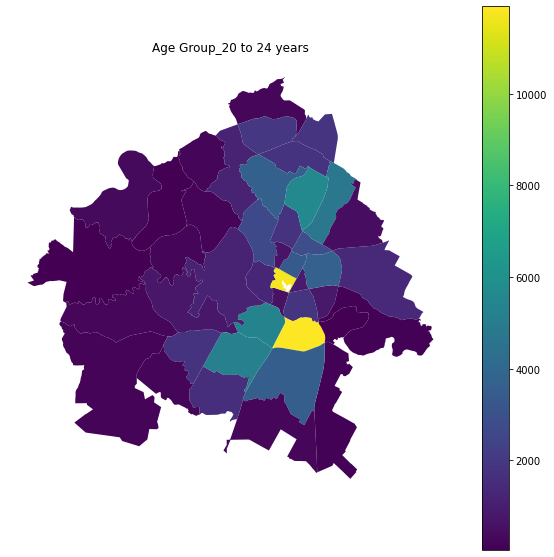

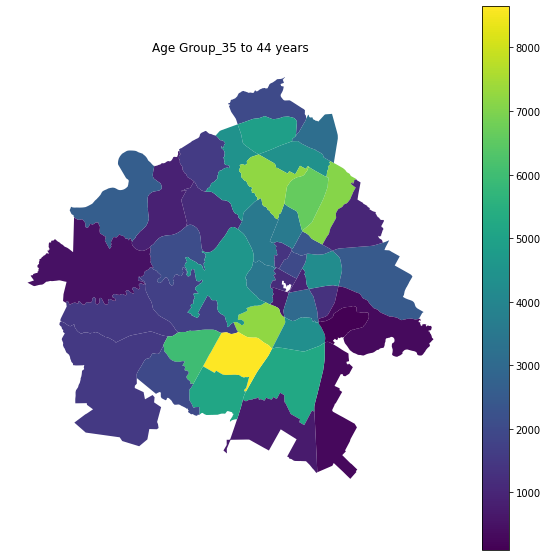

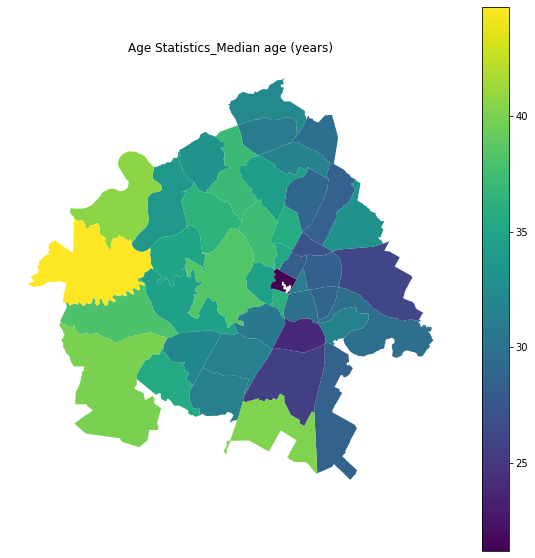

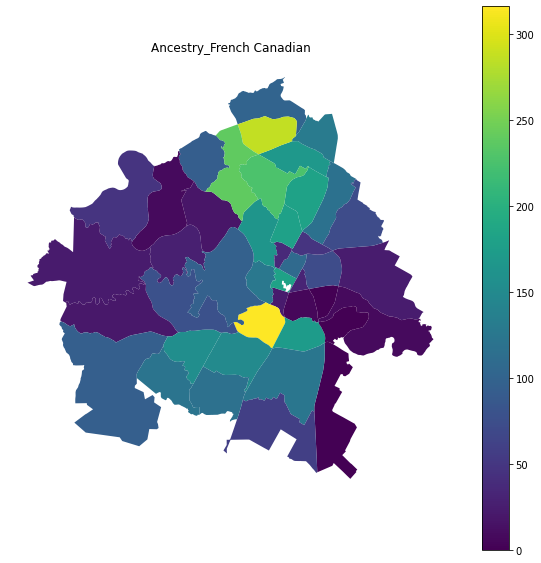

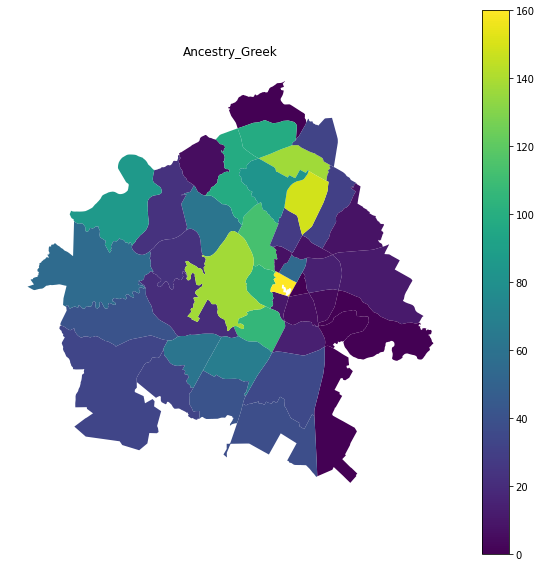

...

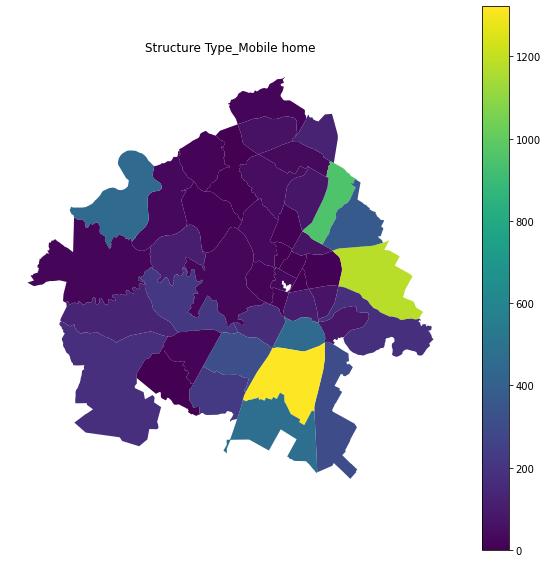

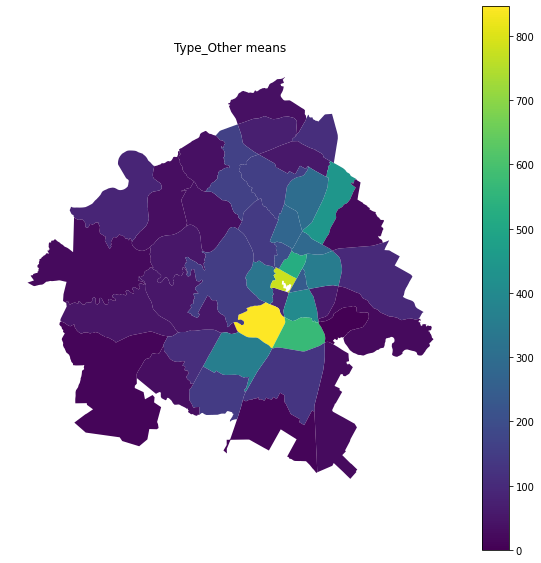

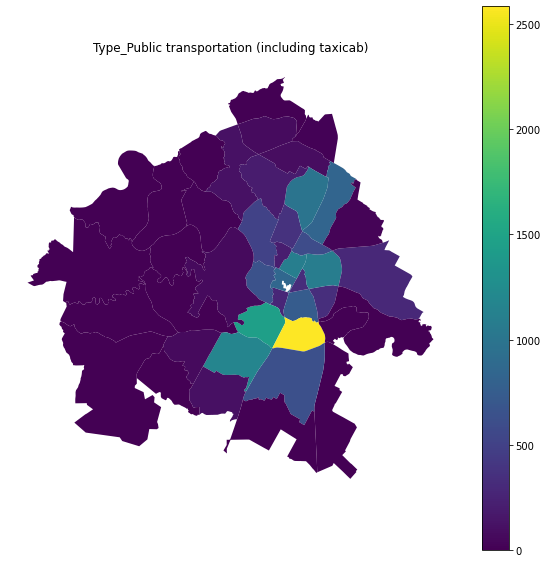

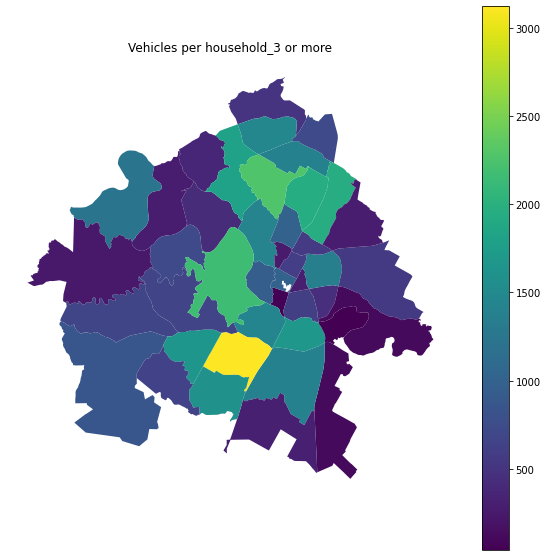

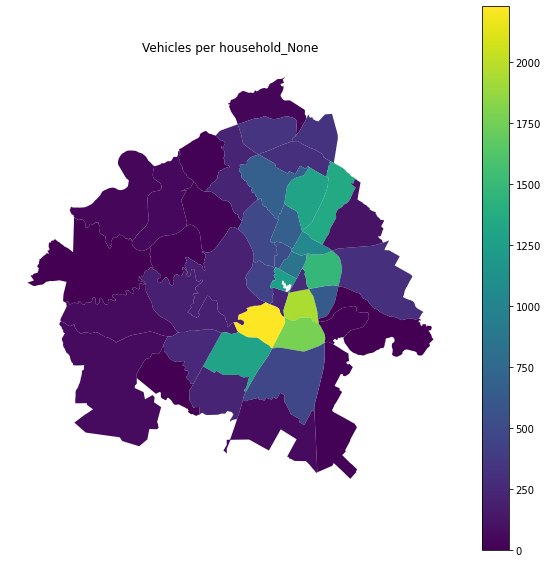

In [ ]:
for c in most_important_features:
  ax = gdp_demographics_zip_codes.plot(column=c, cmap='viridis', figsize=(10,10), legend=True)
  ax.set_title(c)
  ax.set_axis_off()

#### Population-Normalized Values Maps

**Normalize data**

In [ ]:
gdp_demographics_zip_codes_norm = gdp_demographics_zip_codes.apply(pd.to_numeric, errors='coerce').fillna(0).astype(float).dropna()
gdp_demographics_zip_codes_norm = gdp_demographics_zip_codes_norm[gdp_demographics_zip_codes_norm.columns[:-5]].div(gdp_demographics_zip_codes_norm.Population, axis=0)
gdp_demographics_zip_codes_norm = gpd.GeoDataFrame(gdp_demographics_zip_codes_norm.join(other=zip_codes))

/usr/local/lib/python3.7/dist-packages/pandas/core/tools/numeric.py:184: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  values, set(), coerce_numeric=coerce_numeric


In [ ]:
gdp_demographics_zip_codes_norm.head()

,Gender_Male,Gender_Female,Gender_Males / Female,Gender_Total Population,Age Group_Under 5 years,Age Group_5 to 9 years,Age Group_10 to 14 years,Age Group_15 to 19 years,Age Group_20 to 24 years,Age Group_25 to 34 years,Age Group_35 to 44 years,Age Group_45 to 54 years,Age Group_55 to 59 years,Age Group_60 to 64 years,Age Group_65 to 74 years,Age Group_75 to 84 years,Age Group_85 years and over,Age Statistics_Median age (years),Age Statistics_18 years and over,Age Statistics_Male,Age Statistics_Female,Age Statistics_21 years and over,Age Statistics_62 years and over,Age Statistics_65 years and over,Age Statistics_Male.1,Age Statistics_Female.1,Race_One race,Race_White,Race_Black or African American,Race_American Indian and Alaska Native,Race_Asian,Race_Asian Indian,Race_Chinese,Race_Filipino,Race_Japanese,Race_Korean,Race_Vietnamese,Race_Other Asian,Race_Native Hawaiian and Other Pacific Islander,Race_Native Hawaiian,Race_Guamanian or Chamorro,Race_Samoan,Race_Other Pacific Islander,Race_Some other race,Hispanic Statistics_Hispanic or Latino (of any race),Hispanic Statistics_Mexican,Hispanic Statistics_Puerto Rican,Hispanic Statistics_Cuban,Hispanic Statistics_Other Hispanic or Latino,Hispanic Statistics_Not Hispanic or Latino,School Enrollment_Population 3 years and over enrolled in school,"School Enrollment_Nursery school, preschool",School Enrollment_Kindergarten,School Enrollment_Elementary school (grades 1-8),School Enrollment_High school (grades 9-12),School Enrollment_College or graduate school,Education Level_Population 25 years and over,Education Level_Less than 9th grade,"Education Level_9th to 12th grade, no diploma",Education Level_High school graduate (includes equivalency),Education Level_High school or higher,"Education Level_Some college, no degree",Education Level_Associate degree,Education Level_Bachelor's degree,Education Level_Bachelor's degree or higher,Education Level_Graduate or professional degree,Ancestry_Total ancestries reported,Ancestry_Arab,Ancestry_Czech,Ancestry_Danish,Ancestry_Dutch,Ancestry_English,Ancestry_French (except Basque),Ancestry_French Canadian,Ancestry_German,Ancestry_Greek,Ancestry_Hungarian,Ancestry_Irish,Ancestry_Italian,Ancestry_Lithuanian,Ancestry_Norwegian,Ancestry_Polish,Ancestry_Portuguese,Ancestry_Russian,Ancestry_Scotch-Irish,Ancestry_Scottish,Ancestry_Slovak,Ancestry_Subsaharan African,Ancestry_Swedish,Ancestry_Swiss,Ancestry_Ukrainian,Ancestry_United States or American,Ancestry_Welsh,Ancestry_West Indian (excluding Hispanic groups),Ancestry_Other ancestries,Group_Population 16 years and over,Group_Males 16 years and over,Group_Females 16 years and over,Group_In labor force,Group_Males in labor force,Group_Females in labor force,Group_Civilian labor force,Group_Employed,Group_Unemployed,Group_Unemployment level,Group_Armed Forces,Group_Not in labor force,Employment Type_Private wage and salary workers,Employment Type_Government workers,Employment Type_Self-employed workers in own not incorporated business,Employment Type_Unpaid family workers,"Occupation_Management, professional, and related occupations",Occupation_Service occupations,Occupation_Sales and office occupations,"Occupation_Farming, fishing, and forestry occupations","Occupation_Construction, extraction, and maintenance occupations","Occupation_Production, transportation, and material moving occupations","Industry_Agriculture, forestry, fishing and hunting, and mining",Industry_Construction,Industry_Manufacturing,Industry_Wholesale trade,Industry_Retail trade,"Industry_Transportation and warehousing, and utilities",Industry_Information,"Industry_Finance, insurance, real estate, and rental and leasing","Industry_Professional, scientific, management, administrative, and waste management services","Industry_Educational, health and social services","Industry_Arts, entertainment, recreation, accommodation and food services",Industry_Other services (except public administration),Industry_Public administration,Househo

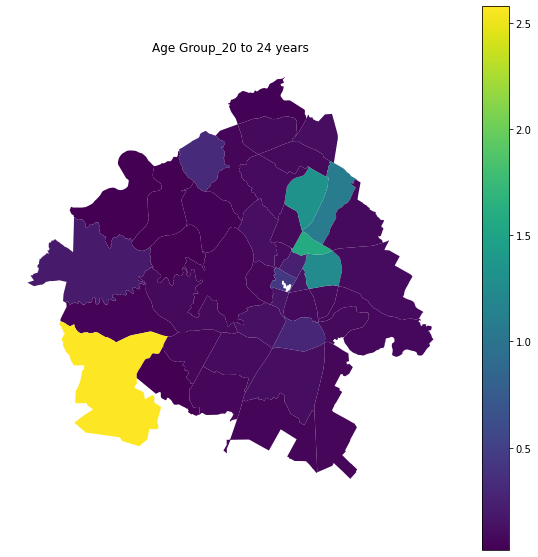

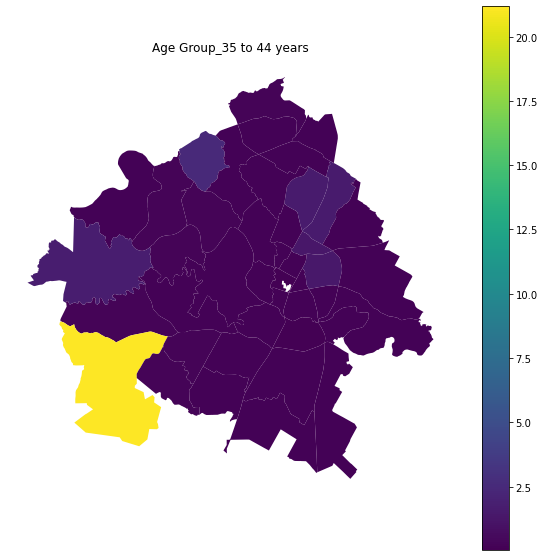

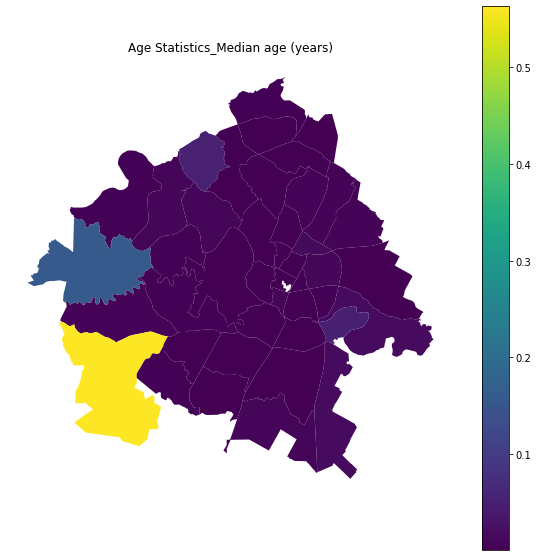

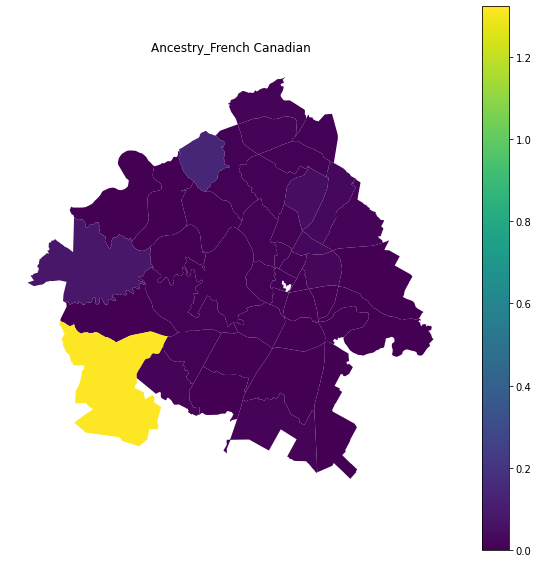

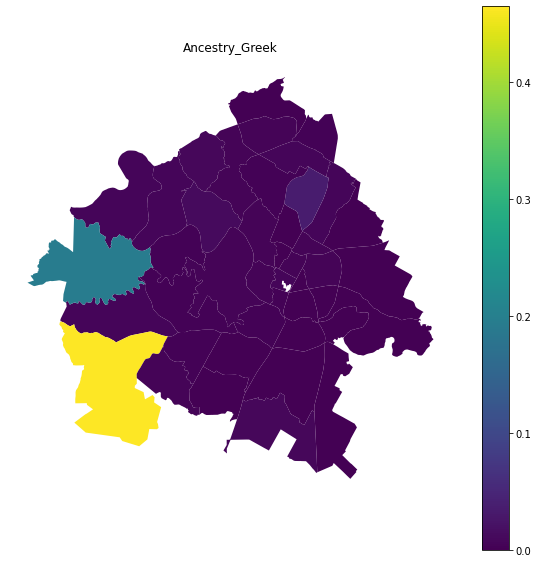

...

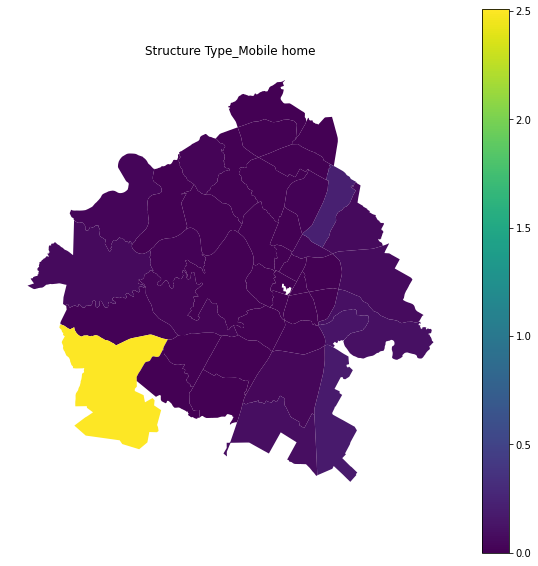

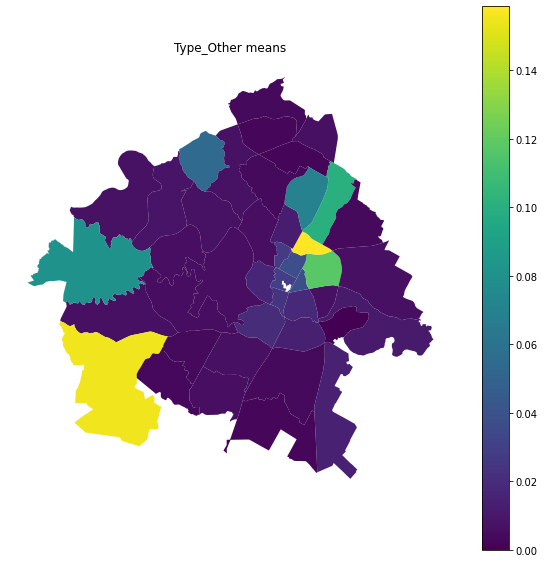

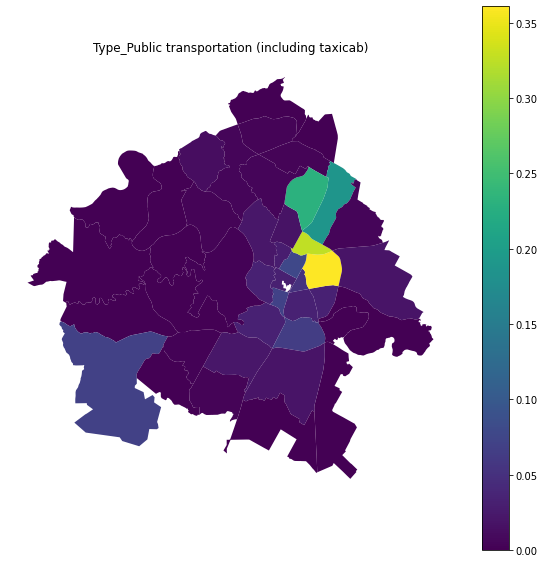

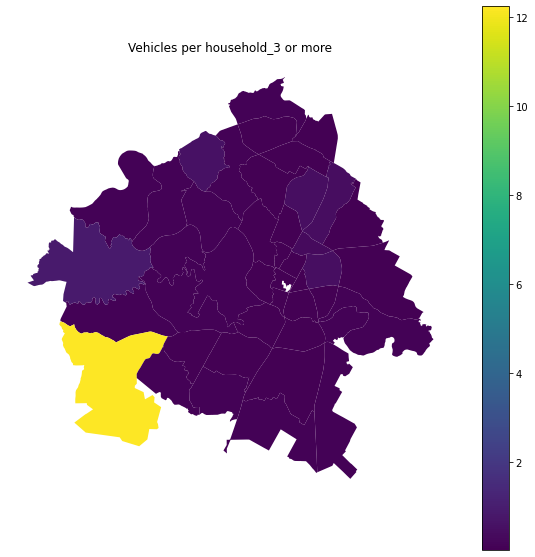

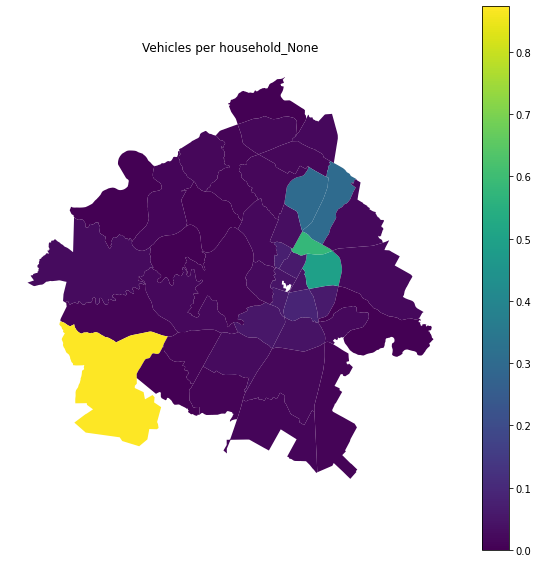

In [ ]:
for c in most_important_features:
  if c in gdp_demographics_zip_codes_norm.columns:
    ax = gdp_demographics_zip_codes_norm.plot(column=c, cmap='viridis', figsize=(10,10), legend=True)
    ax.set_title(c)
    ax.set_axis_off()

### Route clustering and optimization

#### Imports and setup

In [ ]:
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import statistics
import numpy as np
import math
from scipy import stats
from sklearn.linear_model import LinearRegression
import seaborn as sns
from sklearn.cluster import KMeans
import geopandas as gpd
import warnings
from gekko import GEKKO
warnings.filterwarnings('ignore')

#### General EDA

In [ ]:
# processing waste data
loads_df = pd.read_csv("waste_collection.csv").iloc[:, 1:]
loads_df

,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Load Date
0,RECYCLING - PAPER,2000-01-26 12:39:00,2940.0,MRF,RECYCLING,RH12,163262,2000-01-26 00:00:00
1,BULK,2001-03-16 09:38:00,4240.0,TDS LANDFILL,BULK,BU05,522335,2001-03-16 00:00:00
2,BULK,2001-03-16 13:33:00,4740.0,TDS LANDFILL,BULK,BU05,522334,2001-03-16 00:00:00
3,BULK,2001-10-16 11:51:00,14080.0,TDS LANDFILL,BULK,BU16,545997,2001-10-16 00:00:00
4,BULK,2001-10-16 15:28:00,8260.0,TDS LANDFILL,BULK,BU16,545996,2001-10-16 00:00:00
...,...,...,...,...,...,...,...,...
655357,BULK,2021-07-11 07:07:01,10100.0,TDS LANDFILL,BULK,BU27,842414,2021-07-11 00:00:00
655358,TIRES,2021-07-11 07:07:05,1500.0,TDS LANDFILL,BULK,BU16,848381,2021-07-11 00:00:00
655359,TIRES,2021-07-11 07:07:05,2120.0,MRF,BULK,BU16,848380,2021-07-11 00:00:00
655360,GARBAGE COLLECTIONS,2021-07-11 07:07:42,17200.0,TDS LANDFILL,GARBAGE COLLECTION,PW30,928229,2021-07-11 00:00:00


In [ ]:
loads_df['Load Weight'] = loads_df['Load Weight'].astype(float)
loads_df[['Date','Time']] = loads_df['Load Time'].str.split(' ', expand=True)
loads_df[['Year','Month', 'Day']] = loads_df['Date'].str.split('-', expand=True)
loads_df['Year'] = loads_df['Year'].astype(int)
loads_df['Load Weight'] = loads_df['Load Weight'].astype(float)
loads_df

,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Load Date,Date,Time,Year,Month,Day
0,RECYCLING - PAPER,2000-01-26 12:39:00,2940.0,MRF,RECYCLING,RH12,163262,2000-01-26 00:00:00,2000-01-26,12:39:00,2000,01,26
1,BULK,2001-03-16 09:38:00,4240.0,TDS LANDFILL,BULK,BU05,522335,2001-03-16 00:00:00,2001-03-16,09:38:00,2001,03,16
2,BULK,2001-03-16 13:33:00,4740.0,TDS LANDFILL,BULK,BU05,522334,2001-03-16 00:00:00,2001-03-16,13:33:00,2001,03,16
3,BULK,2001-10-16 11:51:00,14080.0,TDS LANDFILL,BULK,BU16,545997,2001-10-16 00:00:00,2001-10-16,11:51:00,2001,10,16
4,BULK,2001-10-16 15:28:00,8260.0,TDS LANDFILL,BULK,BU16,545996,2001-10-16 00:00:00,2001-10-16,15:28:00,2001,10,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...
655357,BULK,2021-07-11 07:07:01,10100.0,TDS LANDFILL,BULK,BU27,842414,2021-07-11 00:00:00,2021-07-11,07:07:01,2021,07,11
655358,TIRES,2021-07-11 07:07:05,1500.0,TDS LANDFILL,BULK,BU16,848381,2021-07-11 00:00:00,2021-07-11,07:07:05,2021,07,11
655359,TIRES,2021-07-11 07:07:05,2120.0,MRF,BULK,BU16,848380,2021-07-11 00:00:00,2021-07-11,07:07:05,2021,07,11
655360,GARBAGE COLLECTIONS,2021-07-11 07:07:42,17200.0,TDS LANDFILL,GARBAGE COLLECTION,PW30,928229,2021-07-11 00:00:00,2021-07-11,07:07:42,2021,07,11


Text(0.5, 1.0, 'Total Weight (lbs) Collected by Year')

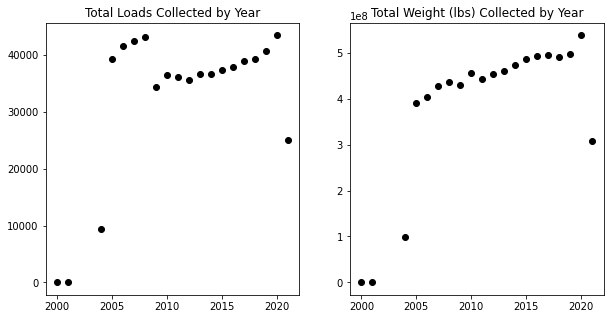

In [ ]:
# finding relevant years for analysis by number of loads
aux = loads_df.copy()
aux = aux.groupby(['Year']).agg({'Load Weight':'sum', 'Load ID': 'count'}).reset_index()
aux.rename(columns={"Load Weight": "Total_Weight", "Load ID": "Total_Loads"}, inplace=True)
aux[['Total_Loads']]=aux[['Total_Loads']].astype(int)
fig, axs = plt.subplots(1,2, figsize=(10,5), sharex = True)
axs[0].scatter(aux[['Year']],aux[['Total_Loads']], color='black')
axs[0].set_title('Total Loads Collected by Year')
axs[1].scatter(aux[['Year']],aux[['Total_Weight']], color='black')
axs[1].set_title('Total Weight (lbs) Collected by Year')


Data between 2010 and 2019 (including) seem to follow a more reliable trend both in number of loads and in total weight:
* Before 2010 there was potentially a different strategy for collection and before 2005 there's seems to be incomplete data
* In 2020 there  was a drastic reduction in no. of loads and weight collected, which is a very visible result of the consequences of consistent lockdowns during the Covid-19 pandemic

This way, we'll focus our analysis for the years between 2010 and 2019

In [ ]:
filtered_loads_df = loads_df[(loads_df['Year'] >= 2010) & (loads_df['Year'] < 2020)]
filtered_loads_df.head()

,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Load Date,Date,Time,Year,Month,Day
210581,YARD TRIMMING,2010-01-02 00:00:00,11500.0,HORNSBY BEND,YARD TRIMMINGS,YF05,352641,2010-01-02 00:00:00,2010-01-02,00:00:00,2010,01,02
210582,LITTER,2010-01-02 06:35:00,2860.0,TDS LANDFILL,KAB,KAB07,353333,2010-01-02 00:00:00,2010-01-02,06:35:00,2010,01,02
210583,LITTER,2010-01-02 08:30:00,8140.0,TDS LANDFILL,SWEEPER DUMPSITES,DSS04,353337,2010-01-02 00:00:00,2010-01-02,08:30:00,2010,01,02
210584,RECYCLING - SINGLE STREAM,2010-01-02 08:54:00,6600.0,MRF,RECYCLING - SINGLE STREAM,DF2,352865,2010-01-02 00:00:00,2010-01-02,08:54:00,2010,01,02
210585,RECYCLING - SINGLE STREAM,2010-01-02 09:11:00,6180.0,MRF,RECYCLING - SINGLE STREAM,RFBS40A,352868,2010-01-02 00:00:00,2010-01-02,09:11:00,2010,01,02


**Waste production general stats**

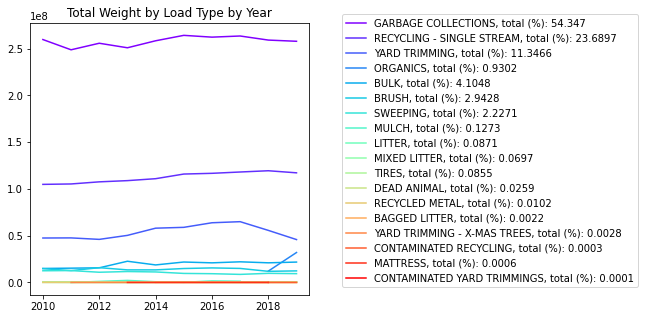

In [ ]:
# Total waste and specific waste weight by year 
aux = filtered_loads_df.copy()
aux = aux.groupby(['Load Type', 'Year']).agg({'Load Weight':'sum', 'Load ID': 'count'}).reset_index()
aux.rename(columns={"Load Weight": "Total_Weight", "Load ID": "Total_Loads"}, inplace=True)
ordered = aux.sort_values(by='Total_Weight', ascending=False)
# Plot per load types
load_types = list(ordered['Load Type'].unique())
fig, axs = plt.subplots(1, figsize=(5,5), sharex = True)
total = aux['Total_Weight'].sum()
colors = cm.rainbow(np.linspace(0, 1, len(load_types)))
for load_type, c in zip(load_types, colors):
    plot_df = aux[aux['Load Type'] == load_type]
    total_by_type = plot_df['Total_Weight'].sum()
    axs.plot(plot_df[['Year']],plot_df[['Total_Weight']], color=c, label = f'{load_type}, total (%): {round(total_by_type/total * 100, 4)}')
axs.set_title('Total Weight by Load Type by Year')
axs.legend(bbox_to_anchor=(1.1, 1.05))


Although total waste collected has incfreased through the years, the proportions of each load type hasn't changed much, with common garbage collection accounting for more than 50% of total waste, with recycling appearing as a far second accounting for about 23% of total weight collected.

We'll focus mainly on these 2 load types

**Relationship with Population**

<AxesSubplot:xlabel='Year'>

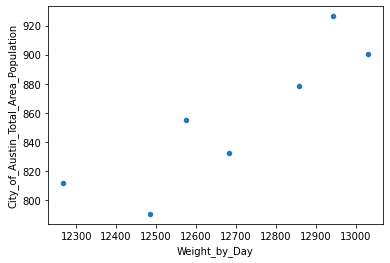

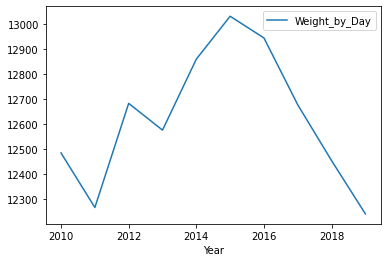

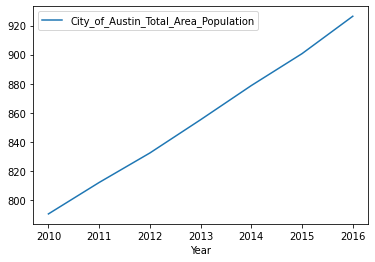

In [ ]:
waste_by_year = filtered_loads_df.groupby(['Year']).agg({'Load Weight':'sum', 'Day': 'count',}).reset_index()
waste_by_year.rename(columns={"Load Weight": "Total_Weight", "Day": "Total_Days"}, inplace=True)
waste_by_year["Weight_by_Day"] = waste_by_year["Total_Weight"] / waste_by_year["Total_Days"]

population_df = pd.read_excel("austion_population_growth.xlsx")
population_df = population_df[(population_df['Year'] >= 2010) & (population_df['Year'] < 2020)]

# join both dataframes
_waste_population_df = waste_by_year.merge(population_df, how = 'left', left_on = 'Year', right_on = 'Year')
_waste_population_df = _waste_population_df[['Year','Total_Weight','Weight_by_Day','City_of_Austin_Total_Area_Population']]
_waste_population_df = _waste_population_df.dropna()

_waste_population_df.plot(x ='Weight_by_Day', y='City_of_Austin_Total_Area_Population', kind = 'scatter')
waste_by_year.plot(x ='Year', y='Weight_by_Day', kind = 'line')
_waste_population_df.plot(x ='Year', y='City_of_Austin_Total_Area_Population', kind = 'line')



Although population increased, it appears to have no relation with waste collected per day. Besides, this value shows inconstant variations along the year (no detectable trend through the years, except for the rapid increase since 2019)

#### Detecting Flaws and Improving Garbage Collection

**Potential Improvements Identification**

The most practical way to detect potential improvements in garbage collection, is to assess the relationship between the total loads and total weight collected per collection route, assuming that the number of loads are representative of the total trips done by garbage trucks.

The routes with the lowest weight collected in comparison with the loads done, will then represent areas were the collections can be rethinked.

We'll analyse the collections from the year 2019 (as it is the most recent year that probably represents production trends more accurately)

In [ ]:
garbage_loads_df = filtered_loads_df[(filtered_loads_df['Load Type'] == "GARBAGE COLLECTIONS")]
loads_by_route = garbage_loads_df.copy()
loads_by_route = loads_by_route[(loads_by_route['Year'] == 2019) ]
loads_by_route = loads_by_route.groupby(['Route Number']).agg({'Load Weight':'sum', 'Load ID': 'count'}).reset_index()
loads_by_route.rename(columns={"Load Weight": "Total_Weight", "Load ID": "Total_Loads"}, inplace=True)
loads_by_route['Weight_By_Load'] = loads_by_route['Total_Weight'] / loads_by_route['Total_Loads']
print(f'Routes:{len(loads_by_route)}')
print(f"Max Loads:{loads_by_route['Total_Loads'].max()}")
print(f"Min Loads:{loads_by_route['Total_Loads'].min()}")
loads_by_route

Routes:292
Max Loads:108
Min Loads:1


,Route Number,Total_Weight,Total_Loads,Weight_By_Load
0,DW1,2280.0,1,2280.000000
1,OH-4,11940.0,1,11940.000000
2,PAF01,1062100.0,52,20425.000000
3,PAF02,1208240.0,51,23690.980392
4,PAF03,1079080.0,53,20360.000000
...,...,...,...,...
287,PW41,2142000.0,106,20207.547170
288,WNONAC,30540.0,1,30540.000000
289,YH06,10340.0,1,10340.000000
290,YM11,5880.0,1,5880.000000


Text(0.5, 1.0, 'Weight/ Load by Route')

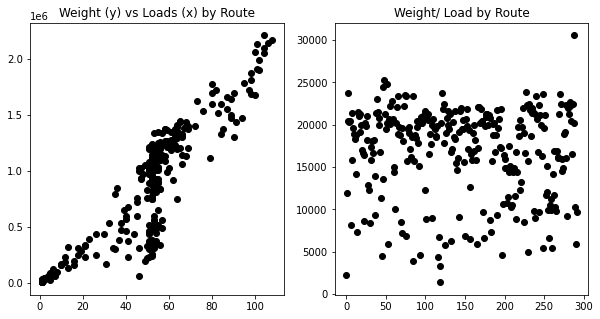

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10,5))
axs[0].scatter(loads_by_route[['Total_Loads']],loads_by_route[['Total_Weight']], color='black')
axs[0].set_title('Weight (y) vs Loads (x) by Route')
axs[1].scatter(loads_by_route.index,loads_by_route[['Weight_By_Load']], color='black')
axs[1].set_title('Weight/ Load by Route')

* The weight per load relationship, in general terms, follows a linear distribution with little dispersion
* Although, there seems to be 3 different clusters when it comes the actual weight per load ratio: one around 20000,another aroung 15000 and a third between 5000 and 10000
* There's also a route that stands out completely that has the best relationship between weight and loads (around 30000)

In [ ]:
# identifying the outlier
best_ratio = loads_by_route[(loads_by_route['Weight_By_Load'] == loads_by_route['Weight_By_Load'].max())].iloc[0]['Weight_By_Load']
best_route = loads_by_route[(loads_by_route['Weight_By_Load'] == loads_by_route['Weight_By_Load'].max())].iloc[0]['Route Number']
loads_by_route[(loads_by_route['Weight_By_Load'] == loads_by_route['Weight_By_Load'].max())]

,Route Number,Total_Weight,Total_Loads,Weight_By_Load
288,WNONAC,30540.0,1,30540.0


In [ ]:
filtered_loads_df[(filtered_loads_df['Route Number'] == best_route)]

,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID,Load Date,Date,Time,Year,Month,Day
557019,GARBAGE COLLECTIONS,2019-04-10 17:28:00,30540.0,TDS LANDFILL,GARBAGE COLLECTION,WNONAC,822202,2019-04-10 00:00:00,2019-04-10,17:28:00,2019,04,10


<AxesSubplot:xlabel='Route Number', ylabel='Total_Loads'>

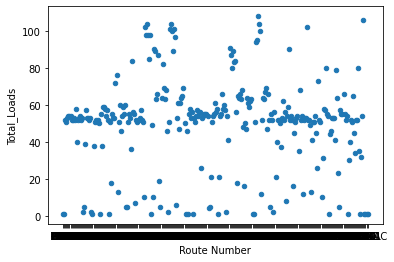

In [ ]:
# dispersion of number of loads per route
loads_by_route.plot(x='Route Number', y ='Total_Loads', kind = 'scatter')

* The number of loads per route varies a lot, indicating that routes might change frequently
* Route number WNONAC indicates that it is possible to have a weight by load ratio of 30540
* Still, we'll focus on clustering the routes by ratio and analyse that distribution further

In [ ]:
df_tofit = loads_by_route.copy()
df_tofit = df_tofit[['Weight_By_Load']]

# Using a basic KMeans algorithm 
kmeans = KMeans(n_clusters=3, max_iter=500)
kmeans.fit(df_tofit)

# Let's take a look at the results
clustered_routes = df_tofit.copy()
clustered_routes.insert(0, 'CLUSTER_LABEL', kmeans.labels_)
clustered_routes[['Route Number','Total_Loads', 'Total_Weight']] = loads_by_route[['Route Number','Total_Loads', 'Total_Weight']]

# Cluster stats table 
clustered_routes_grouped = clustered_routes.copy()
clustered_routes_grouped = clustered_routes_grouped.groupby('CLUSTER_LABEL').agg({'Route Number':'count', 'Weight_By_Load': 'mean'}).reset_index()
clustered_routes_grouped.rename(columns={"Route Number": "N_Routes"}, inplace=True)

#Sort by weight by load avg and change label names
clustered_routes_grouped.sort_values(by='Weight_By_Load', ascending=True, inplace=True)
clustered_routes_grouped.reset_index(inplace=True)
clustered_routes_grouped.drop('index', axis=1, inplace=True)

clustered_routes.loc[clustered_routes["CLUSTER_LABEL"] == clustered_routes_grouped.at[0,'CLUSTER_LABEL'], "CLUSTER_LABEL"] = '3. Low'
clustered_routes.loc[clustered_routes["CLUSTER_LABEL"] == clustered_routes_grouped.at[1,'CLUSTER_LABEL'], "CLUSTER_LABEL"] = '2. Medium'
clustered_routes.loc[clustered_routes["CLUSTER_LABEL"] == clustered_routes_grouped.at[2,'CLUSTER_LABEL'], "CLUSTER_LABEL"] = '1. High'

clustered_routes_grouped['CLUSTER_LABEL'] = clustered_routes_grouped['CLUSTER_LABEL'].astype(str)
clustered_routes_grouped.at[0,'CLUSTER_LABEL'] = '3. Low'
clustered_routes_grouped.at[1,'CLUSTER_LABEL'] = '2. Medium'
clustered_routes_grouped.at[2,'CLUSTER_LABEL'] = '1. High'
clustered_routes_grouped.head()



,CLUSTER_LABEL,N_Routes,Weight_By_Load
0,3. Low,62,8161.977039
1,2. Medium,78,15924.954798
2,1. High,152,20871.988608


In [ ]:
clustered_routes

,CLUSTER_LABEL,Weight_By_Load,Route Number,Total_Loads,Total_Weight
0,3. Low,2280.000000,DW1,1,2280.0
1,3. Low,11940.000000,OH-4,1,11940.0
2,1. High,20425.000000,PAF01,52,1062100.0
3,1. High,23690.980392,PAF02,51,1208240.0
4,1. High,20360.000000,PAF03,53,1079080.0
...,...,...,...,...,...
287,1. High,20207.547170,PW41,106,2142000.0
288,1. High,30540.000000,WNONAC,1,30540.0
289,3. Low,10340.000000,YH06,1,10340.0
290,3. Low,5880.000000,YM11,1,5880.0


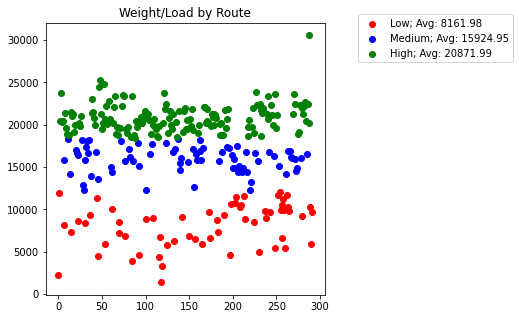

In [ ]:
# Cluster chart
aux = clustered_routes.copy()
aux = aux.reset_index()
fig, axs = plt.subplots(1, figsize=(5,5), sharex=True)
axs.scatter(aux[aux['CLUSTER_LABEL']=='3. Low']['index'],aux[aux['CLUSTER_LABEL']=='3. Low']['Weight_By_Load'], color='red', label = f"Low; Avg: {round(clustered_routes_grouped.at[0,'Weight_By_Load'],2)}")
axs.scatter(aux[aux['CLUSTER_LABEL']=='2. Medium']['index'],aux[aux['CLUSTER_LABEL']=='2. Medium']['Weight_By_Load'], color='blue', label = f"Medium; Avg: {round(clustered_routes_grouped.at[1,'Weight_By_Load'],2)}")
axs.scatter(aux[aux['CLUSTER_LABEL']=='1. High']['index'],aux[aux['CLUSTER_LABEL']=='1. High']['Weight_By_Load'], color='green', label = f"High; Avg: {round(clustered_routes_grouped.at[2,'Weight_By_Load'],2)}")
axs.set_title('Weight/Load by Route')
axs.legend(bbox_to_anchor=(1.1, 1.05))



**Route Clusters Visualization**

In [ ]:
garbage_boundaries = gpd.read_file('garbage_routes.geojson')
garbage_boundaries = garbage_boundaries.drop_duplicates(subset = ['garb_rt', 'rt_old'])
route_numbers = list(garbage_boundaries['garb_rt'])
route_numbers =route_numbers + list(garbage_boundaries['rt_old'])
route_numbers = list(set(route_numbers))
route_numbers.remove('NO ROUTE')
route_numbers.remove(None)
garbage_boundaries.head()

,rt_old,garb_day,landfill,garb_rt,super_num,op_type,garb_sup,geometry
0,None,Thursday,TDS,PAH83,697,Auto,Gilbert,"MULTIPOLYGON (((-97.70618 30.36742, -97.70723 ..."
1,PAM84,Monday,TDS,PAM54,500,Auto,Castillo,"MULTIPOLYGON (((-97.83237 30.16213, -97.83237 ..."
2,None,Monday,TDS,PAM71,596,Auto,Carnline,"MULTIPOLYGON (((-97.72977 30.19009, -97.72103 ..."
3,PAH75,Thursday,TDS,PAH54,500,Auto,Castillo,"MULTIPOLYGON (((-97.65374 30.26269, -97.65322 ..."
4,None,Wednesday,TDS,PAW71,596,Auto,Carnline,"MULTIPOLYGON (((-97.64683 30.38640, -97.64724 ..."


In [ ]:
clustered_routes['geometry'] = np.nan
loads_by_route_geo = clustered_routes.set_index("Route Number")
loads_by_route_geo = gpd.GeoDataFrame(loads_by_route_geo)
for garb_rt in route_numbers:
    try:
        if not garbage_boundaries.loc[garbage_boundaries['garb_rt'] == garb_rt]['geometry'].empty:
            loads_by_route_geo.at[garb_rt, 'geometry'] = garbage_boundaries.loc[garbage_boundaries['garb_rt'] == garb_rt]['geometry'].iloc[0]
        elif not garbage_boundaries.loc[garbage_boundaries['rt_old'] == garb_rt]['geometry'].empty:
            loads_by_route_geo.at[garb_rt, 'geometry'] = garbage_boundaries.loc[garbage_boundaries['rt_old'] == garb_rt]['geometry'].iloc[0]
    except:
        pass
    
            
loads_by_route_geo = loads_by_route_geo.reset_index()
loads_by_route_geo.dropna(inplace=True)
loads_by_route_geo.head()

,Route Number,CLUSTER_LABEL,Weight_By_Load,Total_Loads,Total_Weight,geometry
2,PAF01,1. High,20425.000000,52.0,1062100.0,"MULTIPOLYGON (((-97.80021 30.36734, -97.79845 ..."
3,PAF02,1. High,23690.980392,51.0,1208240.0,"MULTIPOLYGON (((-97.77222 30.32272, -97.77117 ..."
4,PAF03,1. High,20360.000000,53.0,1079080.0,"MULTIPOLYGON (((-97.76012 30.34036, -97.75954 ..."
5,PAF04,1. High,20431.111111,54.0,1103280.0,"MULTIPOLYGON (((-97.77663 30.30588, -97.77664 ..."
8,PAF50,1. High,21351.923077,52.0,1110300.0,"MULTIPOLYGON (((-97.77245 30.29746, -97.77172 ..."


In [ ]:
# Cluster stats table 
clustered_routes_grouped = loads_by_route_geo.copy()
clustered_routes_grouped = clustered_routes_grouped.groupby('CLUSTER_LABEL').agg({'Route Number':'count', 'Weight_By_Load': 'mean'}).reset_index()
clustered_routes_grouped.rename(columns={"Route Number": "N_Routes"}, inplace=True)

#Sort by weight by load avg and change label names
clustered_routes_grouped.sort_values(by='Weight_By_Load', ascending=True, inplace=True)
clustered_routes_grouped.reset_index(inplace=True)
clustered_routes_grouped.drop('index', axis=1, inplace=True)

clustered_routes.loc[clustered_routes["CLUSTER_LABEL"] == clustered_routes_grouped.at[0,'CLUSTER_LABEL'], "CLUSTER_LABEL"] = '3. Low'
clustered_routes.loc[clustered_routes["CLUSTER_LABEL"] == clustered_routes_grouped.at[1,'CLUSTER_LABEL'], "CLUSTER_LABEL"] = '2. Medium'
clustered_routes.loc[clustered_routes["CLUSTER_LABEL"] == clustered_routes_grouped.at[2,'CLUSTER_LABEL'], "CLUSTER_LABEL"] = '1. High'

clustered_routes_grouped['CLUSTER_LABEL'] = clustered_routes_grouped['CLUSTER_LABEL'].astype(str)
clustered_routes_grouped.at[0,'CLUSTER_LABEL'] = '3. Low'
clustered_routes_grouped.at[1,'CLUSTER_LABEL'] = '2. Medium'
clustered_routes_grouped.at[2,'CLUSTER_LABEL'] = '1. High'
clustered_routes_grouped.head()

,CLUSTER_LABEL,N_Routes,Weight_By_Load
0,3. Low,7,11263.442085
1,2. Medium,52,16340.461801
2,1. High,145,20810.587155


Routes with Lowest ratios:

In [ ]:
loads_by_route_geo.loc[clustered_routes["CLUSTER_LABEL"] == "3. Low"]

,Route Number,CLUSTER_LABEL,Weight_By_Load,Total_Loads,Total_Weight,geometry,Area,Miles,Load_Emissions
44,PAH07,3. Low,11360.000000,1.0,11360.0,"MULTIPOLYGON (((-97.75719 30.37167, -97.75723 ...",1.071746,2.727420,20.419281
208,PF23,3. Low,10254.594595,37.0,379420.0,"MULTIPOLYGON (((-97.69183 30.26334, -97.69535 ...",1.080043,2.748534,20.577360
252,PT10,3. Low,11752.000000,55.0,646360.0,"MULTIPOLYGON (((-97.75145 30.21643, -97.75360 ...",1.386481,3.528368,26.415718
254,PT12,3. Low,12020.000000,1.0,12020.0,"MULTIPOLYGON (((-97.75431 30.19338, -97.75516 ...",0.633209,1.611414,12.064119
257,PT20,3. Low,10505.660377,53.0,556800.0,"MULTIPOLYGON (((-97.73573 30.24990, -97.73543 ...",0.833551,2.121251,15.881100
258,PT21,3. Low,11234.339623,53.0,595420.0,"MULTIPOLYGON (((-97.73504 30.24465, -97.73523 ...",1.282423,3.263557,24.433162
262,PT31,3. Low,11717.500000,64.0,749920.0,"MULTIPOLYGON (((-97.70488 30.25109, -97.70338 ...",4.613990,11.741852,87.907334


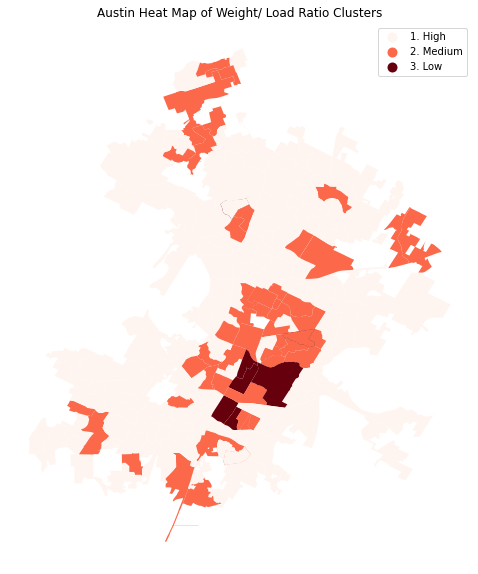

In [ ]:
fig = plt.figure(figsize=(10, 10))
ax = plt.gca()
ax.set_axis_off()
loads_by_route_geo.plot(column = 'CLUSTER_LABEL', cmap='Reds', legend=True, categorical=True, ax=ax)
ax.set_title("Austin Heat Map of Weight/ Load Ratio Clusters")
plt.show()

#### Estimating the impact of reducing the number of loads for the "Medium" and "Low" ratio routes

A typical Side Loader Garbage Trucks (common for the removal of household waste) can take up to around 30000lbs of garbage (1). As the best route weight per load was 30540lbs, than we'll assume that each load correponds to a truck trip.

Research shows that loaded dump trucks had approximately 30% higher fuel consumption than when empty (2). We can, then estimate the increase in fuel cosumption by an additional pound of waste collected as 30%/30000 = 0.001%

Diesel combustion can generate 22.46 pounds of CO2 per gallon consumed (3) and diesel fueled garbage tracks average 3 miles per gallon (4), i.e. these trucks can emit 22.46 * 1/3 =  7.48 pounds of CO2 per mile, with an increase of (((1+0.001/100)*1/3) * 22.46) - 7.48)/ 7.48 = 0.00099%

Austin has an area of 319.9 sq mi (5), while Texas as an area of 268596 square miles (6) with 683533 miles of roads (7). Allowing us to estimate that Austin would have arount 319.9/268596 * 683533 = 814 miles of roads.

Sources:
* (1) https://routereadytrucks.com/blogs/know-4-major-types-garbage-trucks/according
* (2) https://www.tandfonline.com/doi/full/10.1080/10962247.2014.990587
* (3) https://www.eia.gov/environment/emissions/co2_vol_mass.php
* (4) https://qz.com/749622/the-economics-of-electric-garbage-trucks-arewesome/#:~:text=Garbage%20trucks%20are%20one%20of,of%20the%20average%20US%20home.
* (5) https://worldpopulationreview.com/us-cities/austin-tx-population
* (6) https://worldpopulationreview.com/state-rankings/states-by-area
* (7) https://blog.cubitplanning.com/2010/02/road-miles-by-state/

In [ ]:
co2_emission_per_mile = 22.46/3
road_miles_per_sqrmile = 683533/268596
austin_roadmiles = 319.9 * road_miles_per_sqrmile
co2_increase_per_waste_lbs_perct = (22.46*((1+(30/100)/30000)/3) - co2_emission_per_mile)/co2_emission_per_mile *100
print(co2_emission_per_mile, road_miles_per_sqrmile, austin_roadmiles, co2_increase_per_waste_lbs_perct)

7.486666666666667 2.5448368553515315 814.0933100269549 0.0009999999999926708


In [ ]:
# calculating area of each route to estimate CO2 emissions per load
loads_by_route_geo['Area']=loads_by_route_geo['geometry'].area
polygon_area = loads_by_route_geo['Area'].sum()
# change area to sqr miles
polygon_vs_real_ratio = 319.9 / polygon_area
loads_by_route_geo['Area'] = loads_by_route_geo['Area'] * polygon_vs_real_ratio
# calculate road miles
loads_by_route_geo['Miles'] = loads_by_route_geo['Area'] * road_miles_per_sqrmile 
# calculate emission per load
loads_by_route_geo['Load_Emissions'] = loads_by_route_geo['Miles'] * co2_emission_per_mile 

loads_by_route_geo.head()

,Route Number,CLUSTER_LABEL,Weight_By_Load,Total_Loads,Total_Weight,geometry,Area,Miles,Load_Emissions
2,PAF01,1. High,20425.000000,52.0,1062100.0,"MULTIPOLYGON (((-97.80021 30.36734, -97.79845 ...",4.672814,11.891549,89.028066
3,PAF02,1. High,23690.980392,51.0,1208240.0,"MULTIPOLYGON (((-97.77222 30.32272, -97.77117 ...",1.840340,4.683365,35.062793
4,PAF03,1. High,20360.000000,53.0,1079080.0,"MULTIPOLYGON (((-97.76012 30.34036, -97.75954 ...",2.123601,5.404217,40.459574
5,PAF04,1. High,20431.111111,54.0,1103280.0,"MULTIPOLYGON (((-97.77663 30.30588, -97.77664 ...",1.362570,3.467520,25.960163
8,PAF50,1. High,21351.923077,52.0,1110300.0,"MULTIPOLYGON (((-97.77245 30.29746, -97.77172 ...",0.852264,2.168873,16.237628


In [ ]:
# Total CO2 emissions in 2019
real_emissions = loads_by_route_geo['Load_Emissions'] + (co2_increase_per_waste_lbs_perct / 100 * loads_by_route_geo['Weight_By_Load'])
em = round(sum(real_emissions*loads_by_route_geo['Total_Loads']))
print(f"Total CO2 emissions 2019: {em} lbs")



Total CO2 emissions 2019: 390599 lbs


Considering that there might be many reasons for it to be necessary to complete a route even if there is not that much waste to collect, such as:
* poor or low capacity trash cans
* impossibility for the garbage to be on the streets for more than a specific amount of time
* ...

Then, it's reasonable to be conservative in the estimations of potential reduction in the number of loads. Therefore, we'll do it by shifting up the weight by load of each route by the difference between each clusters average and the average of the 'high' cluster (except when the route only has 1 load).

In [ ]:
# Loads per route if Low and Medium routes shifted up by the average
low_shift = clustered_routes_grouped.at[2,'Weight_By_Load'] - clustered_routes_grouped.at[0,'Weight_By_Load']
medium_shift = clustered_routes_grouped.at[2,'Weight_By_Load'] - clustered_routes_grouped.at[1,'Weight_By_Load']

optimized_routes_df = loads_by_route_geo.copy()
optimized_routes_df.loc[(optimized_routes_df['CLUSTER_LABEL'] == '3. Low') & (optimized_routes_df['Total_Loads'] != 1),'Weight_By_Load'] = optimized_routes_df.loc[optimized_routes_df['CLUSTER_LABEL'] == '3. Low','Weight_By_Load'] + low_shift
optimized_routes_df.loc[(optimized_routes_df['CLUSTER_LABEL'] == '2. Medium') & (optimized_routes_df['Total_Loads'] != 1),'Weight_By_Load'] = optimized_routes_df.loc[optimized_routes_df['CLUSTER_LABEL'] == '2. Medium','Weight_By_Load'] + medium_shift

optimized_routes_df['Total_Loads'] = optimized_routes_df['Total_Weight'] / optimized_routes_df['Weight_By_Load']
print(f"Current Loads: {loads_by_route_geo['Total_Loads'].sum()}")
print(f"Optimized Loads: {optimized_routes_df['Total_Loads'].sum()}")



Current Loads: 11848.0
Optimized Loads: 11119.204446461543


In [ ]:
# Total CO2 emissions reduced
real_emissions = optimized_routes_df['Load_Emissions'] + (co2_increase_per_waste_lbs_perct / 100 * optimized_routes_df['Weight_By_Load'])
em_opt = round(sum(real_emissions*optimized_routes_df['Total_Loads']))
print(f"Emissions Optimized: {em_opt} lbs")
print(f"Reduction: {round((em - em_opt)/em * 100, 2)}%")


Emissions Optimized: 369221 lbs
Reduction: 5.47%


Text(0.5, 1.0, 'Weight/ Load by Route Real')

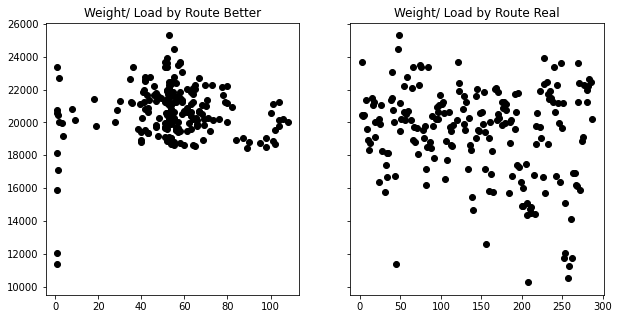

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10,5), sharey = True)
axs[0].scatter(optimized_routes_df[['Total_Loads']],optimized_routes_df[['Weight_By_Load']], color='black')
axs[0].set_title('Weight/ Load by Route Better')
axs[1].scatter(loads_by_route_geo.index,loads_by_route_geo[['Weight_By_Load']], color='black')
axs[1].set_title('Weight/ Load by Route Real')

#### Non-Linear Programming: Finding optimal number of loads per route

In [ ]:
# model inputs
max_load_capacity = 30000
routes_df = loads_by_route_geo.copy()
co2_increase_per_waste_lbs_perct = co2_increase_per_waste_lbs_perct

for index, row in routes_df.iterrows():
    
    #initialize model
    m = GEKKO(remote=True)

    #decision variables
    weight_by_load = m.Var(value=routes_df.at[index,"Weight_By_Load"], lb=0, ub=max_load_capacity)

    #Objective minimize CO2
    m.Minimize((weight_by_load * co2_increase_per_waste_lbs_perct / 100 + routes_df.at[index,"Load_Emissions"])*(routes_df.at[index,"Total_Weight"])/weight_by_load)

    #set options
    m.options.IMODE = 3 #steady state optimization
    
    #solve
    m.solve()
    
    # change values on route df
    routes_df.at[index,"Weight_By_Load"] = weight_by_load.value[0]


routes_df


#########################
#########2#########
#########################
apm 193.136.33.115_gk_model8 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

**********************

apm 193.136.33.115_gk_model10 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 0
Number of Lagrangian Hessian evaluations             = 4
Total CPU secs in IPOPT (w/o function evaluations)   =      0.003
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
 
 The solution was found.
 
 The final value of the objective function is    612.057589106184     
 
 ---------------------------------------------------
 Solver         :  IPOPT (v3.12)
 Solution time  :   1.080000000365544E-002 sec
 Objective      :    612.057594147080     
 Successful solution
 ---------------------------------------------------
 
#########################
#########9#########
#########################
apm 193.136.33.115_gk_model13 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1

#########################
#########11#########
#########################
apm 193.136.33.115_gk_model15 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########15#########
#########################
apm 193.136.33.115_gk_model17 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

apm 193.136.33.115_gk_model19 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

apm 193.136.33.115_gk_model21 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

apm 193.136.33.115_gk_model23 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

#########################
#########27#########
#########################
apm 193.136.33.115_gk_model26 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########32#########
#########################
apm 193.136.33.115_gk_model28 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########34#########
#########################
apm 193.136.33.115_gk_model30 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########38#########
#########################
apm 193.136.33.115_gk_model32 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

apm 193.136.33.115_gk_model34 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

#########################
#########43#########
#########################
apm 193.136.33.115_gk_model37 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########47#########
#########################
apm 193.136.33.115_gk_model39 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

apm 193.136.33.115_gk_model41 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

apm 193.136.33.115_gk_model43 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

#########################
#########56#########
#########################
apm 193.136.33.115_gk_model46 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

apm 193.136.33.115_gk_model48 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

 Solution time  :   8.099999991827644E-003 sec
 Objective      :    555.407916897056     
 Successful solution
 ---------------------------------------------------
 
#########################
#########64#########
#########################
apm 193.136.33.115_gk_model51 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 *******************************

#########################
#########66#########
#########################
apm 193.136.33.115_gk_model53 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########68#########
#########################
apm 193.136.33.115_gk_model55 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########72#########
#########################
apm 193.136.33.115_gk_model57 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########74#########
#########################
apm 193.136.33.115_gk_model59 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

apm 193.136.33.115_gk_model61 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

#########################
#########80#########
#########################
apm 193.136.33.115_gk_model63 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########82#########
#########################
apm 193.136.33.115_gk_model65 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########84#########
#########################
apm 193.136.33.115_gk_model67 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########88#########
#########################
apm 193.136.33.115_gk_model69 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########90#########
#########################
apm 193.136.33.115_gk_model71 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

#########################
#########94#########
#########################
apm 193.136.33.115_gk_model73 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

apm 193.136.33.115_gk_model75 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

#########################
#########99#########
#########################
apm 193.136.33.115_gk_model78 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

********************

apm 193.136.33.115_gk_model80 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit http://projects.coin-or.org/Ipopt
******************************************************************************

This is Ipopt version 3.12.10, running with linear solver ma57.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:        1

Total number of variables............................:        1
                     variab

   5  3.0532977e+03 0.00e+00 2.49e-10 -11.0 2.00e-07    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:   5.9388550046168461e+01    3.0532977440713362e+03
Dual infeasibility......:   2.4893154204619350e-10    1.2798125483228195e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   1.1829131309552518e-10    6.0816200957427669e-09
Overall NLP error.......:   2.4893154204619350e-10    1.2798125483228195e-08


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 0
Number of Lagrangian Hessian evaluations             = 5
Total CPU secs in IPOPT (w/o fun

Number of Lagrangian Hessian evaluations             = 5
Total CPU secs in IPOPT (w/o function evaluations)   =      0.003
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
 
 The solution was found.
 
 The final value of the objective function is    411.370053463324     
 
 ---------------------------------------------------
 Solver         :  IPOPT (v3.12)
 Solution time  :   1.269999999203719E-002 sec
 Objective      :    411.370057484261     
 Successful solution
 ---------------------------------------------------
 
#########################
#########112#########
#########################
apm 193.136.33.115_gk_model87 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :         

#########################
#########114#########
#########################
apm 193.136.33.115_gk_model89 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

*******************

#########################
#########120#########
#########################
apm 193.136.33.115_gk_model91 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

*******************

apm 193.136.33.115_gk_model93 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program c

 Objective      :    587.772257463835     
 Successful solution
 ---------------------------------------------------
 
#########################
#########128#########
#########################
apm 193.136.33.115_gk_model96 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization wit

#########################
#########130#########
#########################
apm 193.136.33.115_gk_model98 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

*******************

#########################
#########134#########
#########################
apm 193.136.33.115_gk_model100 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########136#########
#########################
apm 193.136.33.115_gk_model102 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

 Successful solution
 ---------------------------------------------------
 
#########################
#########139#########
#########################
apm 193.136.33.115_gk_model104 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 *****************

#########################
#########143#########
#########################
apm 193.136.33.115_gk_model106 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########145#########
#########################
apm 193.136.33.115_gk_model108 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########147#########
#########################
apm 193.136.33.115_gk_model110 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########151#########
#########################
apm 193.136.33.115_gk_model112 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

apm 193.136.33.115_gk_model114 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program 

#########################
#########155#########
#########################
apm 193.136.33.115_gk_model116 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########159#########
#########################
apm 193.136.33.115_gk_model118 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########161#########
#########################
apm 193.136.33.115_gk_model120 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########163#########
#########################
apm 193.136.33.115_gk_model122 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########167#########
#########################
apm 193.136.33.115_gk_model124 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

apm 193.136.33.115_gk_model126 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program 

 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit http://projects.coin-or.org/Ipopt
******************************************************************************

This is Ipopt version 3.12.10, running with linear solver ma57.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:        1

Total number of variables............................:        1
                     variab

#########################
#########176#########
#########################
apm 193.136.33.115_gk_model131 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

apm 193.136.33.115_gk_model133 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program 

#########################
#########181#########
#########################
apm 193.136.33.115_gk_model136 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########185#########
#########################
apm 193.136.33.115_gk_model138 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########187#########
#########################
apm 193.136.33.115_gk_model140 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########191#########
#########################
apm 193.136.33.115_gk_model142 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########193#########
#########################
apm 193.136.33.115_gk_model144 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########195#########
#########################
apm 193.136.33.115_gk_model146 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########199#########
#########################
apm 193.136.33.115_gk_model148 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########201#########
#########################
apm 193.136.33.115_gk_model150 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########205#########
#########################
apm 193.136.33.115_gk_model152 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########207#########
#########################
apm 193.136.33.115_gk_model154 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########210#########
#########################
apm 193.136.33.115_gk_model156 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########212#########
#########################
apm 193.136.33.115_gk_model158 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########216#########
#########################
apm 193.136.33.115_gk_model160 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########218#########
#########################
apm 193.136.33.115_gk_model162 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########222#########
#########################
apm 193.136.33.115_gk_model164 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

 
#########################
#########224#########
#########################
apm 193.136.33.115_gk_model166 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

****************

#########################
#########227#########
#########################
apm 193.136.33.115_gk_model168 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

apm 193.136.33.115_gk_model170 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program 

#########################
#########232#########
#########################
apm 193.136.33.115_gk_model172 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########234#########
#########################
apm 193.136.33.115_gk_model174 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

apm 193.136.33.115_gk_model176 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program 

#########################
#########241#########
#########################
apm 193.136.33.115_gk_model179 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########244#########
#########################
apm 193.136.33.115_gk_model181 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

apm 193.136.33.115_gk_model183 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program 

#########################
#########249#########
#########################
apm 193.136.33.115_gk_model185 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########251#########
#########################
apm 193.136.33.115_gk_model187 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########253#########
#########################
apm 193.136.33.115_gk_model189 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########257#########
#########################
apm 193.136.33.115_gk_model191 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########261#########
#########################
apm 193.136.33.115_gk_model193 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########263#########
#########################
apm 193.136.33.115_gk_model195 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########267#########
#########################
apm 193.136.33.115_gk_model197 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########269#########
#########################
apm 193.136.33.115_gk_model199 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

apm 193.136.33.115_gk_model201 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program 

#########################
#########275#########
#########################
apm 193.136.33.115_gk_model203 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

#########################
#########277#########
#########################
apm 193.136.33.115_gk_model205 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

apm 193.136.33.115_gk_model207 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************************************************************************
This program 

#########################
#########286#########
#########################
apm 193.136.33.115_gk_model210 <br><pre> ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            1
   Intermediates:            0
   Connections  :            0
   Equations    :            1
   Residuals    :            1
 
 Number of state variables:              1
 Number of total equations: -            0
 Number of slack variables: -            0
 ---------------------------------------
 Degrees of freedom       :              1
 
 **********************************************
 Steady State Optimization with Interior Point Solver
 **********************************************
  
  
 Info: Exact Hessian

******************

,Route Number,CLUSTER_LABEL,Weight_By_Load,Total_Loads,Total_Weight,geometry,Area,Miles,Load_Emissions
2,PAF01,1. High,30000.0,52.0,1062100.0,"MULTIPOLYGON (((-97.80021 30.36734, -97.79845 ...",4.672814,11.891549,89.028066
3,PAF02,1. High,30000.0,51.0,1208240.0,"MULTIPOLYGON (((-97.77222 30.32272, -97.77117 ...",1.840340,4.683365,35.062793
4,PAF03,1. High,30000.0,53.0,1079080.0,"MULTIPOLYGON (((-97.76012 30.34036, -97.75954 ...",2.123601,5.404217,40.459574
5,PAF04,1. High,30000.0,54.0,1103280.0,"MULTIPOLYGON (((-97.77663 30.30588, -97.77664 ...",1.362570,3.467520,25.960163
8,PAF50,1. High,30000.0,52.0,1110300.0,"MULTIPOLYGON (((-97.77245 30.29746, -97.77172 ...",0.852264,2.168873,16.237628
...,...,...,...,...,...,...,...,...,...
281,PW31,1. High,30000.0,52.0,1103220.0,"MULTIPOLYGON (((-97.67217 30.38963, -97.67251 ...",0.766351,1.950239,14.600788
282,PW32,1. High,30000.0,80.0,1777320.0,"MULTIPOLYGON (((-97.62770 30.35480, -97.63059 ...",4.728966,12.034448,90.097902
283,PW33,1. High,30000.0,35.0,793160.0,"MULTIPOLYGON (((-97.62770 30.35480, -97.63059 ...",4.728966,12.034448,90.097902
286,PW40,1. High,30000.0,54.0,1212220.0,"MULTIPOLYGON (((-97.67112 30.36307, -97.67204 ...",0.626519,1.594389,11.936655


In [ ]:
routes_df['Total_Loads'] = routes_df['Total_Weight']/routes_df['Weight_By_Load']
routes_df['Total_Loads'] = routes_df['Total_Loads'].apply(lambda x: math.ceil(x))
routes_df

,Route Number,CLUSTER_LABEL,Weight_By_Load,Total_Loads,Total_Weight,geometry,Area,Miles,Load_Emissions
2,PAF01,1. High,30000.0,36,1062100.0,"MULTIPOLYGON (((-97.80021 30.36734, -97.79845 ...",4.672814,11.891549,89.028066
3,PAF02,1. High,30000.0,41,1208240.0,"MULTIPOLYGON (((-97.77222 30.32272, -97.77117 ...",1.840340,4.683365,35.062793
4,PAF03,1. High,30000.0,36,1079080.0,"MULTIPOLYGON (((-97.76012 30.34036, -97.75954 ...",2.123601,5.404217,40.459574
5,PAF04,1. High,30000.0,37,1103280.0,"MULTIPOLYGON (((-97.77663 30.30588, -97.77664 ...",1.362570,3.467520,25.960163
8,PAF50,1. High,30000.0,38,1110300.0,"MULTIPOLYGON (((-97.77245 30.29746, -97.77172 ...",0.852264,2.168873,16.237628
...,...,...,...,...,...,...,...,...,...
281,PW31,1. High,30000.0,37,1103220.0,"MULTIPOLYGON (((-97.67217 30.38963, -97.67251 ...",0.766351,1.950239,14.600788
282,PW32,1. High,30000.0,60,1777320.0,"MULTIPOLYGON (((-97.62770 30.35480, -97.63059 ...",4.728966,12.034448,90.097902
283,PW33,1. High,30000.0,27,793160.0,"MULTIPOLYGON (((-97.62770 30.35480, -97.63059 ...",4.728966,12.034448,90.097902
286,PW40,1. High,30000.0,41,1212220.0,"MULTIPOLYGON (((-97.67112 30.36307, -97.67204 ...",0.626519,1.594389,11.936655


In [ ]:
real_emissions = routes_df['Load_Emissions'] + (co2_increase_per_waste_lbs_perct / 100 * routes_df['Weight_By_Load'])
em_opt = round(sum(real_emissions*routes_df['Total_Loads']))
print(f"Emissions Optimized: {em_opt} lbs")
print(f"Reduction: {round((em - em_opt)/em * 100, 2)}%")

Emissions Optimized: 258400 lbs
Reduction: 33.85%


## 🖼️ Visualisations

### Recycling rate per zone

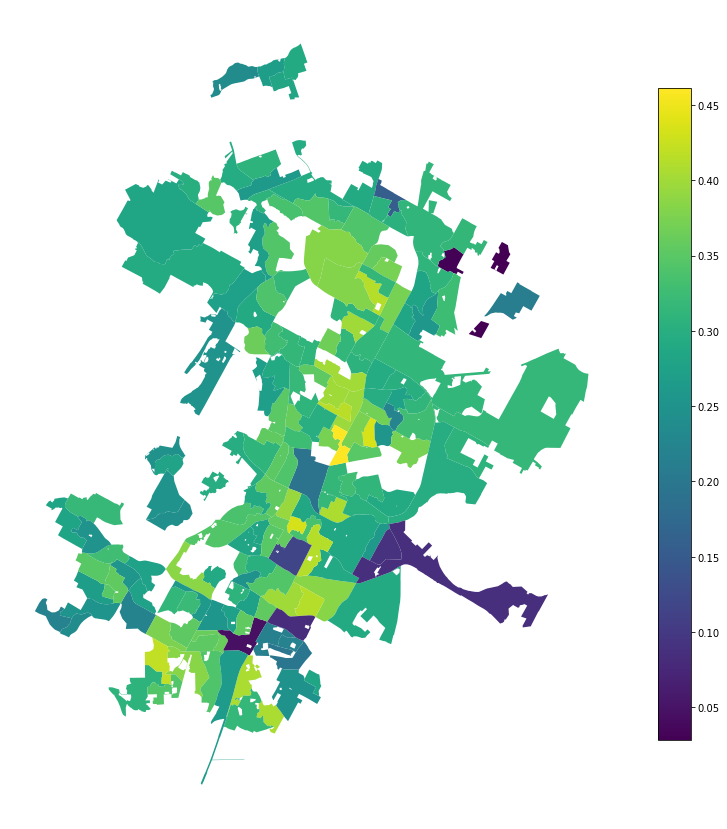



### Feature importance of regression model

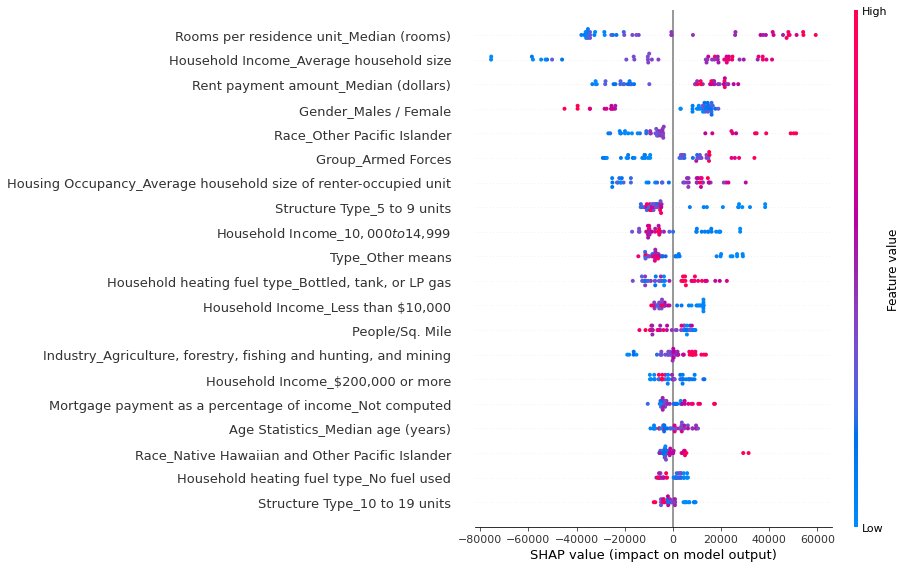




### Forecasting results

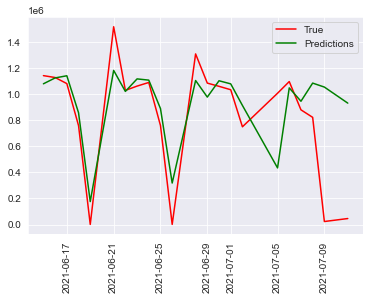

## 👓 References
* https://data.austintexas.gov/Utilities-and-City-Services/Waste-Collection-Diversion-Report-daily-/mbnu-4wq9
* http://zipatlas.com/
* https://www.theguardian.com/us-news/2019/jul/02/us-plastic-waste-recycling
* https://data.austintexas.gov/Utilities-and-City-Services/
* https://data.austintexas.gov/Locations-and-Maps/Garbage-Routes/azhh-4hg8
* https://data.austintexas.gov/dataset/BOUNDARIES_recycle_collection_routes/7tin-f8k2




## ⏭️ Appendix
Add here any code, images or text that you still find relevant, but that was too long to include in the main report. This section is optional.


### Weather models for weight of garbage to collect - binary classification

We analysed the weather data collected from the OpenWeather API and developed models to evaluate the influence of the weather of the waste production.

#### Imports and setup

In [ ]:
import pandas as pd
import pytz
import time
from datetime import timezone
import requests
from datetime import datetime, timedelta
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

#### Processing

**Load waste collection dataset**

In [ ]:
df = pd.read_csv('waste_dataset.csv')
df['Load Date'] = df['Load Time'].apply(lambda x: x.split(' ')[0])
df = df.drop_duplicates(subset=['Load Type', 'Load Weight', 'Dropoff Site', 'Route Type', 'Route Number', 'Load Date'])

waste = df[['Load Type', 'Load Time', 'Load Weight']].copy()
waste['Load Time'] = pd.to_datetime(waste['Load Time'])

waste = waste.rename(columns={'Load Type': 'type', 'Load Time': 'time', 'Load Weight': 'weight'})
waste_filtered = waste.dropna().loc[(waste['type'] == 'GARBAGE COLLECTIONS') & (waste['weight'] > 0)]

waste_day = waste_filtered.copy()
waste_day['time'] = waste_day['time'].apply(lambda t: t.date())

waste_day_gb = waste_day.drop(columns=['type']).groupby('time').sum().reset_index().sort_values(by='time')
waste_day_gb

,time,weight
0,2004-02-28,30600.0
1,2004-08-25,139140.0
2,2004-08-26,61480.0
3,2004-09-28,120740.0
4,2004-09-29,102600.0
...,...,...
5098,2021-07-06,1096040.0
5099,2021-07-07,879290.0
5100,2021-07-08,821640.0
5101,2021-07-09,23060.0


**Get weather data**

In [ ]:
data = waste_day_gb.copy()
data['time'] = data['time'].apply(lambda x: datetime.combine(x, datetime.min.time()))

print(data['time'].min(), data['time'].max())

start_d = data['time'].min()
end_d = data['time'].max()

start_ = time.mktime(start_d.timetuple())
end_ = time.mktime(end_d.timetuple())

start = int(start_d.replace(tzinfo=timezone.utc).timestamp())
end = (end_d.replace(tzinfo=timezone.utc).timestamp())

print(start, end)

API_key = "4814a9397d22192a2f2255c76aad295a"

city_name = "Austin"
state_code = "TX"
country_code = 840

url_geo = f"http://api.openweathermap.org/geo/1.0/direct?q={city_name},{state_code},{country_code}&appid={API_key}"
geo_data = requests.get(url_geo).json()[0]

lat = geo_data['lat']
lon = geo_data['lon']

print('AUSTIN:', lat, lon)

dt = datetime(2021, 3, 14)
int(dt.replace(tzinfo=timezone.utc).timestamp())

dt_2 = dt + timedelta(hours=169)
int(dt_2.replace(tzinfo=timezone.utc).timestamp())

start_ts = 1615680000 # 2021-03-14
all_wd = []

while datetime.fromtimestamp(start_ts) < datetime(2021, 7, 12):
    
    print(datetime.fromtimestamp(start_ts))

    url_weather = f"https://history.openweathermap.org/data/2.5/history/city?lat={lat}&lon={lon}&type=hour&start={start_ts}&cnt=200&appid={API_key}"
    response = requests.get(url_weather).json()

    print("   > ", response['message'])
    
    try:
        wd = response['list']
        dates_list = [e['dt'] for e in wd]
        last_date = datetime.fromtimestamp(dates_list[-1])
        start = last_date + timedelta(hours=1)
        start_ts = int(start.replace(tzinfo=timezone.utc).timestamp())

        wd = pd.DataFrame(wd)
        wd['time'] = wd['dt'].apply(lambda x: datetime.fromtimestamp(x))
        
        all_wd.append(wd)

    except:
        print("Error with", start_ts)
        
all_wd = pd.concat(all_wd, ignore_index=True)
all_wd

2004-02-28 00:00:00 2021-07-11 00:00:00
1077926400 1625961600.0
AUSTIN: 30.2711286 -97.7436995
2021-03-14 00:00:00
   >  Count: 169
2021-03-21 01:00:00
   >  Count: 169
2021-03-28 04:00:00
   >  Count: 169
2021-04-04 06:00:00
   >  Count: 169
2021-04-11 08:00:00
   >  Count: 169
2021-04-18 10:00:00
   >  Count: 169
2021-04-25 12:00:00
   >  Count: 169
2021-05-02 14:00:00
   >  Count: 169
2021-05-09 16:00:00
   >  Count: 169
2021-05-16 18:00:00
   >  Count: 169
2021-05-23 20:00:00
   >  Count: 169
2021-05-30 22:00:00
   >  Count: 169
2021-06-07 00:00:00
   >  Count: 169
2021-06-14 02:00:00
   >  Count: 169
2021-06-21 04:00:00
   >  Count: 169
2021-06-28 06:00:00
   >  Count: 169
2021-07-05 08:00:00
   >  Count: 169


,dt,main,wind,clouds,weather,rain,time
0,1615680000,"{'temp': 296.68, 'feels_like': 296.66, 'pressu...","{'speed': 5.66, 'deg': 150}",{'all': 100},"[{'id': 804, 'main': 'Clouds', 'description': ...",NaN,2021-03-14 00:00:00
1,1615683600,"{'temp': 295.21, 'feels_like': 295.14, 'pressu...","{'speed': 7.2, 'deg': 160}",{'all': 100},"[{'id': 804, 'main': 'Clouds', 'description': ...",NaN,2021-03-14 01:00:00
2,1615687200,"{'temp': 294.28, 'feels_like': 294.22, 'pressu...","{'speed': 7.2, 'deg': 150}",{'all': 100},"[{'id': 804, 'main': 'Clouds', 'description': ...",NaN,2021-03-14 02:00:00
3,1615690800,"{'temp': 293.54, 'feels_like': 293.54, 'pressu...","{'speed': 5.66, 'deg': 160}",{'all': 100},"[{'id': 804, 'main': 'Clouds', 'description': ...",NaN,2021-03-14 03:00:00
4,1615694400,"{'temp': 292.88, 'feels_like': 293.05, 'pressu...","{'speed': 5.36, 'deg': 113}",{'all': 100},"[{'id': 804, 'main': 'Clouds', 'description': ...",NaN,2021-03-14 04:00:00
...,...,...,...,...,...,...,...
2868,1626058800,"{'temp': 300.89, 'feels_like': 304.07, 'pressu...","{'speed': 0, 'deg': 0}",{'all': 1},"[{'id': 800, 'main': 'Clear', 'description': '...",NaN,2021-07-12 04:00:00
2869,1626062400,"{'temp': 300.34, 'feels_like': 303.32, 'pressu...","{'speed': 0.45, 'deg': 161, 'gust': 0.45}",{'all': 1},"[{'id': 800, 'main': 'Clear', 'description': '...",NaN,2021-07-12 05:00:00
2870,1626066000,"{'temp': 300.04, 'feels_like': 302.83, 'pressu...","{'speed': 0.89, 'deg': 206, 'gust': 1.34}",{'all': 1},"[{'id': 800, 'main': 'Clear', 'description': '...",NaN,2021-07-12 06:00:00
2871,1626069600,"{'temp': 299.59, 'feels_like': 299.59, 'pressu...","{'speed': 1.34, 'deg': 147, 'gust': 1.79}",{'all': 1},"[{'id': 800, 'main': 'Clear', 'description': '...",NaN,2021-07-12 07:00:00


**Filter and process weather data - feature engineering**

In [ ]:
wd = all_wd.copy()
wd_ = pd.json_normalize(wd.main)
wd_['time'] = wd['time'].tolist()
wd_['weather'] = wd['weather'].tolist()
wd_['weather'] = wd_['weather'].apply(lambda x: x[0]['main'])
wd_['time'] = wd_['time'].apply(lambda x: x.date())
wd_ = wd_.drop(columns=['temp_min', 'temp_max'])
wd_gb1 = wd_.groupby('time').mean().reset_index()

weather_list = [wd_.loc[wd_['time'] == t]['weather'].mode()[0] for t in wd_['time'].unique()]
wd_gb1['weather'] = weather_list
wd_gb1['weather'] = pd.factorize(wd_gb1['weather'])[0]
wd_gb1

,time,temp,feels_like,pressure,humidity,weather
0,2021-03-14,291.397500,290.925833,1013.333333,63.125000,0
1,2021-03-15,290.506250,289.494583,1013.125000,51.250000,1
2,2021-03-16,294.652500,294.720000,1009.500000,70.083333,0
3,2021-03-17,294.207083,293.778333,1007.458333,54.000000,0
4,2021-03-18,287.077917,285.427500,1020.916667,35.833333,1
...,...,...,...,...,...,...
116,2021-07-08,299.391667,301.231667,1012.041667,78.958333,0
117,2021-07-09,297.949583,298.871667,1013.583333,92.208333,0
118,2021-07-10,299.947500,302.359167,1015.041667,85.958333,0
119,2021-07-11,301.313333,304.745417,1014.250000,79.875000,0


**Create final dataset**

In [ ]:
dataset = waste_day_gb.merge(wd_gb1, on='time')
dataset.to_csv('meteo_dataset.csv', index=False)
dataset

,time,weight,temp,feels_like,pressure,humidity,weather
0,2021-03-15,1235640.0,290.506250,289.494583,1013.125000,51.250000,1
1,2021-03-16,1034880.0,294.652500,294.720000,1009.500000,70.083333,0
2,2021-03-17,1058040.0,294.207083,293.778333,1007.458333,54.000000,0
3,2021-03-18,929520.0,287.077917,285.427500,1020.916667,35.833333,1
4,2021-03-19,701560.0,286.517083,284.929583,1025.916667,39.416667,1
...,...,...,...,...,...,...,...
94,2021-07-06,1096040.0,299.123333,301.080417,1011.666667,86.250000,0
95,2021-07-07,879290.0,298.749583,300.387500,1012.000000,84.416667,0
96,2021-07-08,821640.0,299.391667,301.231667,1012.041667,78.958333,0
97,2021-07-09,23060.0,297.949583,298.871667,1013.583333,92.208333,0


**Analyse final dataset and create labels**

The data will be divided in half using the median of the weight, so we will get two labels: lower than median and higher than median. Therefore, we are transforming the prediction of waste production into a binary classification problem.

<AxesSubplot:>

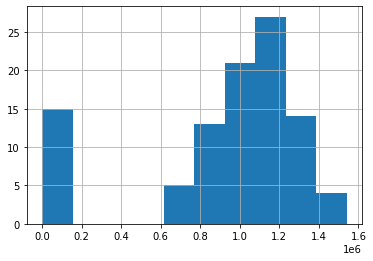

In [ ]:
dataset['weight'].hist()

In [ ]:
med = dataset['weight'].median()
med

1059570.0

In [ ]:
len(dataset[dataset['weight'] <= med]), len(dataset[dataset['weight'] > med])

(50, 49)

In [ ]:
dataset['label'] = dataset['weight'].apply(lambda x: 0 if x <= med else 1)
dataset

,time,weight,temp,feels_like,pressure,humidity,weather,label
0,2021-03-15,1235640.0,290.506250,289.494583,1013.125000,51.250000,1,1
1,2021-03-16,1034880.0,294.652500,294.720000,1009.500000,70.083333,0,0
2,2021-03-17,1058040.0,294.207083,293.778333,1007.458333,54.000000,0,0
3,2021-03-18,929520.0,287.077917,285.427500,1020.916667,35.833333,1,0
4,2021-03-19,701560.0,286.517083,284.929583,1025.916667,39.416667,1,0
...,...,...,...,...,...,...,...,...
94,2021-07-06,1096040.0,299.123333,301.080417,1011.666667,86.250000,0,1
95,2021-07-07,879290.0,298.749583,300.387500,1012.000000,84.416667,0,0
96,2021-07-08,821640.0,299.391667,301.231667,1012.041667,78.958333,0,0
97,2021-07-09,23060.0,297.949583,298.871667,1013.583333,92.208333,0,0


**Feature scaling and dataset split**

In [ ]:
features = dataset.drop(columns=['time', 'label', 'weight']).columns.tolist()

X = dataset.drop(columns=['time', 'label', 'weight']).to_numpy()
y = dataset['label'].to_numpy()

scaler = StandardScaler()
X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### Classification

**Logistic Regression**

In [ ]:
clf = LogisticRegression(random_state=0)

param_grid = {
    'penalty': ['l2', 'none'],                      
    'solver': ['lbfgs', 'sag', 'saga'],   
    'C': [0.1, 1, 10, 100]
}

cv = GridSearchCV(estimator = clf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 1, scoring='accuracy')
cv.fit(X_train, y_train)

print("Best validation score = {:.2f}".format(cv.best_score_))

clf.set_params(**cv.best_params_)
clf.fit(X_train, y_train)
clf.score(X_train, y_train)

y_test_pred = clf.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("Test accuracy = {:.2f}".format(test_acc))

#imp = pd.DataFrame({'feature': features, 'importance': clf.coef_[0]}).sort_values(by='importance', ascending=False)

#fig, ax = plt.subplots()
#sns.barplot(x='importance', y='feature', data=imp, ax=ax)

Fitting 3 folds for each of 24 candidates, totalling 72 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Best validation score = 0.39
Test accuracy = 0.40


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done  72 out of  72 | elapsed:    2.7s finished
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:1510: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:1510: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "


**KNN**

In [ ]:
clf = KNeighborsClassifier(n_neighbors=3)

param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],                      
    'weights': ['uniform', 'distance'],   
}

cv = GridSearchCV(estimator = clf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 1, scoring='accuracy')
cv.fit(X_train, y_train)

print("Best validation score = {:.2f}".format(cv.best_score_))

clf.set_params(**cv.best_params_)
clf.fit(X_train, y_train)
clf.score(X_train, y_train)

y_test_pred = clf.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("Test accuracy = {:.2f}".format(test_acc))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best validation score = 0.49
Test accuracy = 0.30


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  30 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    0.0s finished
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


**SVM**

In [ ]:
clf = SVC()

param_grid = {
    'C': [0.1, 1, 10, 100],                      
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': ['auto', 'scale']
}

cv = GridSearchCV(estimator = clf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 1, scoring='accuracy')
cv.fit(X_train, y_train)

print("Best validation score = {:.2f}".format(cv.best_score_))

clf.set_params(**cv.best_params_)
clf.fit(X_train, y_train)
clf.score(X_train, y_train)

y_test_pred = clf.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("Test accuracy = {:.2f}".format(test_acc))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 3 folds for each of 24 candidates, totalling 72 fits


[Parallel(n_jobs=-1)]: Done  72 out of  72 | elapsed:    0.0s finished


Best validation score = 0.53
Test accuracy = 0.40


C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


**Random Forest**

In [ ]:
clf = RandomForestClassifier()

param_grid = {
    'bootstrap': [True],
    'max_depth': [10, 20, 50, 100],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [10, 20, 50, 100, 200]
}

cv = GridSearchCV(estimator = clf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 1, scoring='accuracy')
cv.fit(X_train, y_train)

print("Best validation score = {:.2f}".format(cv.best_score_))

clf.set_params(**cv.best_params_)
clf.fit(X_train, y_train)
clf.score(X_train, y_train)

y_test_pred = clf.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("Test accuracy = {:.2f}".format(test_acc))

#imp = pd.DataFrame({'feature': features, 'importance': rf.feature_importances_}).sort_values(by='importance', ascending=False)

#fig, ax = plt.subplots()
#sns.barplot(x='importance', y='feature', data=imp, ax=ax)

Fitting 3 folds for each of 360 candidates, totalling 1080 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   12.0s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:   18.7s


Best validation score = 0.56
Test accuracy = 0.55


[Parallel(n_jobs=-1)]: Done 1080 out of 1080 | elapsed:   24.5s finished
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


#### Conclusions

None of the models obtained a good performance. The only model to obtain a test accuracy score above 50% was the random forest, but only reaching 55%, which indicates that there is no clear influence of the weather on the waste production.

### Time based models for weight of garbage to collect - multiclass classification

We also developed models to evaluate the influence of time-based features of the waste production. The first experiments were with binary classification, similarly to the weather-based models, and showed really good performance, so we moved to 3 class classification.

#### Imports and setup

In [ ]:
import pandas as pd
import pytz
import time
from datetime import timezone
import requests
from datetime import datetime, timedelta
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from tqdm.notebook import tqdm_notebook
import itertools
from sklearn.utils.testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import TimeSeriesSplit

#### Read and process waste dataset

In [ ]:
pd.read_csv('waste_dataset.csv').head(3)

,Report Date,Load Type,Load Time,Load Weight,Dropoff Site,Route Type,Route Number,Load ID
0,12/08/2020,BULK,12/08/2020 03:02:00 PM,5220.0,TDS LANDFILL,BULK,BU13,899097
1,12/08/2020,RECYCLING - SINGLE STREAM,12/08/2020 10:00:00 AM,11140.0,TDS - MRF,RECYCLING - SINGLE STREAM,RTAU53,899078
2,12/03/2020,RECYCLING - SINGLE STREAM,12/03/2020 10:34:00 AM,10060.0,BALCONES RECYCLING,RECYCLING - SINGLE STREAM,RHBU10,899082


In [ ]:
df = pd.read_csv('waste_dataset.csv')
df['Load Date'] = df['Load Time'].apply(lambda x: x.split(' ')[0])
df = df.drop_duplicates(subset=['Load Type', 'Load Weight', 'Dropoff Site', 'Route Type', 'Route Number', 'Load Date'])

waste = df[['Load Type', 'Load Time', 'Load Weight', 'Route Number']].copy()
waste['Load Time'] = pd.to_datetime(waste['Load Time'])

waste = waste.rename(columns={'Load Type': 'type', 'Load Time': 'time', 'Load Weight': 'weight', 'Route Number': 'route'})
waste_filtered = waste.dropna().loc[(waste['type'] == 'GARBAGE COLLECTIONS') & (waste['weight'] > 0)]

waste_day = waste_filtered.copy()
waste_day['time'] = waste_day['time'].apply(lambda t: t.date())

waste_day_gb = waste_day.drop(columns=['type']).groupby('time').sum().reset_index().sort_values(by='time')
waste_day_gb.to_csv("processed_waste_dataset.csv", index=False)
waste_day_gb.head(3)

,time,weight
0,2004-02-28,30600.0
1,2004-08-25,139140.0
2,2004-08-26,61480.0


In [ ]:
data = pd.read_csv('processed_waste_dataset.csv') 
data['time'] = pd.to_datetime(data['time'])
data.head(3)

,time,weight
0,2004-02-28,30600.0
1,2004-08-25,139140.0
2,2004-08-26,61480.0


#### Feature engineering

In [ ]:
data['month'] = data['time'].dt.month
data['quarter'] = data['time'].dt.quarter
data['semester'] = np.where(data['quarter'].isin([1,2]),1,2)
data['day_of_week'] = data['time'].dt.dayofweek
data['is_weekend'] = np.where(data['day_of_week'].isin([5,6]),1,0)
data['day_of_year'] = data['time'].dt.dayofyear
data['is_month_start'] = data['time'].dt.is_month_start.astype('int')
data['is_month_end'] = data['time'].dt.is_month_end.astype('int')
data['is_year_start'] = data['time'].dt.is_year_start.astype('int')
data['is_year_end'] = data['time'].dt.is_year_end.astype('int')

austin_next_to_holidays = dict()
austin_next_to_holidays['New Year'] = (1,2)
austin_next_to_holidays['Luther King'] = (1,18)
austin_next_to_holidays['President'] = (2,22)
austin_next_to_holidays['Memorial'] = (5,31)
austin_next_to_holidays['Juneteenth'] = (6,21)
austin_next_to_holidays['Independence'] = (7,5)
austin_next_to_holidays['Labor'] = (9,6)
austin_next_to_holidays['Veterans'] = (11,12)
austin_next_to_holidays['Thanksgiving'] = (11,26)
austin_next_to_holidays['Christmas'] = (12,26)

data['is_next_to_holiday'] = data['time'].apply(lambda d: 1 if (d.month, d.day) in list(austin_next_to_holidays.values()) else 0)
data.head(3)

,time,weight,month,quarter,semester,day_of_week,is_weekend,day_of_year,is_month_start,is_month_end,is_year_start,is_year_end,is_next_to_holiday
0,2004-02-28,30600.0,2,1,1,5,1,59,0,0,0,0,0
1,2004-08-25,139140.0,8,3,2,2,0,238,0,0,0,0,0
2,2004-08-26,61480.0,8,3,2,3,0,239,0,0,0,0,0


In [ ]:
dataset = data.copy()

#### Analyse final dataset and create labels - 3 classes

<AxesSubplot:>

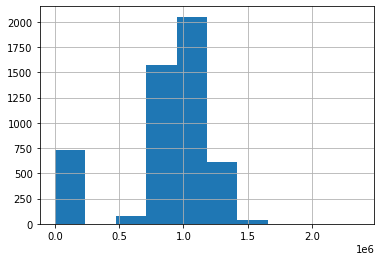

In [ ]:
dataset['weight'].hist()

In [ ]:
q1 = dataset['weight'].quantile(q=1/3)
q2 = dataset['weight'].quantile(q=2/3)

In [ ]:
len(dataset[dataset['weight'] <= q1]), len(dataset[(dataset['weight'] > q1) & (dataset['weight'] < q2)]), len(dataset[dataset['weight'] >= q2])

(1701, 1700, 1702)

In [ ]:
dataset['label'] = dataset.apply(lambda row: 0 if row['weight'] <= q1 else -1, axis=1)
dataset['label'] = dataset.apply(lambda row: 1 if row['weight'] > q1 and row['weight'] < q2 else row['label'], axis=1)
dataset['label'] = dataset.apply(lambda row: 2 if row['weight'] >= q2 else row['label'], axis=1)
dataset['label'].value_counts()

2    1702
0    1701
1    1700
Name: label, dtype: int64

In [ ]:
dataset.to_csv('final_temporal_dataset.csv', index=False)

#### Statistics of final dataset

In [ ]:
dataset = pd.read_csv('final_temporal_dataset.csv').drop(columns=['day_of_week', 'is_weekend'])
print(dataset['label'].value_counts())
dataset.head(3)

2    1702
0    1701
1    1700
Name: label, dtype: int64


,time,weight,month,quarter,semester,day_of_year,is_month_start,is_month_end,is_year_start,is_year_end,is_next_to_holiday,label
0,2004-02-28,30600.0,2,1,1,59,0,0,0,0,0,0
1,2004-08-25,139140.0,8,3,2,238,0,0,0,0,0,0
2,2004-08-26,61480.0,8,3,2,239,0,0,0,0,0,0


#### Year analysis

Remove years with small representation

In [ ]:
year_analysis = dataset.sort_values(by='time').copy()
year_analysis['time'] = pd.to_datetime(year_analysis['time'])
year_analysis['year'] = year_analysis['time'].dt.year
year_analysis['is_leap'] = year_analysis['time'].dt.is_leap_year
year_analysis['days_in_year'] = year_analysis.apply(lambda row: 366 if row['is_leap'] == True else 365, axis=1)
year_analysis_gb = year_analysis.groupby('year').max().reset_index()[['year', 'days_in_year']]
available_days_df = pd.DataFrame(year_analysis['year'].value_counts()).reset_index().rename(columns={'year': 'available_days', 'index': 'year'})
year_analysis_gb = year_analysis_gb.merge(available_days_df, on='year')
year_analysis_gb['percentage'] = year_analysis_gb.apply(lambda row: (row['available_days']/row['days_in_year'])*100, axis=1)
year_analysis_gb

,year,days_in_year,available_days,percentage
0,2004,366,74,20.218579
1,2005,365,280,76.712329
2,2006,365,302,82.739726
3,2007,365,301,82.465753
4,2008,366,299,81.693989
5,2009,365,308,84.383562
6,2010,365,307,84.109589
7,2011,365,310,84.931507
8,2012,366,309,84.426230
9,2013,365,308,84.383562


In [ ]:
dataset['time'] = pd.to_datetime(dataset['time'])
dataset['year'] = dataset['time'].dt.year
dataset = dataset.loc[dataset['year'] > 2005].drop(columns=['year'])
dataset.head(3)

,time,weight,month,quarter,semester,day_of_year,is_month_start,is_month_end,is_year_start,is_year_end,is_next_to_holiday,label
354,2006-01-02,1200980.0,1,1,1,2,0,0,0,0,1,2
355,2006-01-03,1103200.0,1,1,1,3,0,0,0,0,0,2
356,2006-01-04,1156800.0,1,1,1,4,0,0,0,0,0,2


#### Time based split into train and test

In [ ]:
dataset = dataset.sort_values(by='time')

train_val_dataset = dataset.iloc[:int(len(dataset)*0.8)]
test_dataset = dataset.iloc[int(len(dataset)*0.8):]

len(dataset), len(train_val_dataset), len(test_dataset)

(4749, 3799, 950)

#### Scaling

In [ ]:
features = dataset.drop(columns=['time', 'label', 'weight']).columns.tolist()

X_train_val = train_val_dataset.drop(columns=['time', 'label', 'weight']).to_numpy()
y_train_val = train_val_dataset['label'].to_numpy()

X_test = test_dataset.drop(columns=['time', 'label', 'weight']).to_numpy()
y_test = test_dataset['label'].to_numpy()

scaler = StandardScaler()
X_train_val = scaler.fit_transform(X_train_val)
X_test = scaler.transform(X_test)

#### Time based cross validation and parameter optimization

In [ ]:
@ignore_warnings(category=ConvergenceWarning)
def parameter_optimization_cv(model, parameters_dict, X_train_val, y_train_val):
    
    print("Running parameter optimization ...\n")

    params_values = []
    params_names = list(parameters_dict.keys())
    for key in parameters_dict.keys():
        params_values.append(parameters_dict[key])
    all_combinations = list(itertools.product(*params_values))
    
    results = []
    
    for combination in tqdm_notebook(all_combinations):
        
        zip_iterator = zip(params_names, list(combination))
        parameters = dict(zip_iterator)
        
        model.set_params(**parameters)

        tscv = TimeSeriesSplit(n_splits=3)
        
        folds_results = []
        
        for train_index, val_index in tscv.split(X_train_val):
            
            X_train = X_train_val[train_index]
            X_val = X_train_val[val_index]
            
            y_train = y_train_val[train_index]
            y_val = y_train_val[val_index]
            
            model.fit(X_train, y_train)
            y_val_pred = model.predict(X_val)
            val_accuracy = accuracy_score(y_val, y_val_pred)
            
            folds_results.append(val_accuracy)
            
        avg_accuracy = np.mean(folds_results)
        results.append({'parameters': parameters, 'accuracy': avg_accuracy})
        
    results = pd.DataFrame(results).sort_values(by='accuracy', ascending=False)
    best_results = results.iloc[0]
    best_parameters = best_results['parameters']
    
    print('   > Best parameters:', best_parameters)
    print('   > Best val accuracy (mean of all folds) = {:.3f}'.format(best_results['accuracy']))
    
    best_model = model.set_params(**best_parameters)
    best_model.fit(X_train_val, y_train_val)
    
    return best_model

#### Classification

**Logistic Regression**

In [ ]:
clf = LogisticRegression(random_state=0)

param_grid = {
    'penalty': ['l2'],                      
    'solver': ['lbfgs', 'sag', 'saga'],   
    'C': [0.1, 1, 10, 100]
}

best_model = parameter_optimization_cv(clf, param_grid, X_train_val, y_train_val)

y_test_pred = best_model.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("\nTest accuracy = {:.3f}".format(test_acc))

#imp = pd.DataFrame({'feature': features, 'importance': clf.coef_[0]}).sort_values(by='importance', ascending=False)

#fig, ax = plt.subplots()
#sns.barplot(x='importance', y='feature', data=imp, ax=ax)

Running parameter optimization ...



C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-package

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)



   > Best parameters: {'penalty': 'l2', 'solver': 'lbfgs', 'C': 0.1}
   > Best val accuracy (mean of all folds) = 0.319


C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)



Test accuracy = 0.429


**KNN**

In [ ]:
clf = KNeighborsClassifier(n_neighbors=3)

param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],                      
    'weights': ['uniform', 'distance'],   
}

best_model = parameter_optimization_cv(clf, param_grid, X_train_val, y_train_val)

y_test_pred = best_model.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("\nTest accuracy = {:.3f}".format(test_acc))

Running parameter optimization ...




   > Best parameters: {'n_neighbors': 3, 'weights': 'distance'}
   > Best val accuracy (mean of all folds) = 0.344

Test accuracy = 0.320


**SVM**

In [ ]:
clf = SVC()

param_grid = {
    'C': [0.1, 1, 10, 100],                      
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': ['auto', 'scale']
}

best_model = parameter_optimization_cv(clf, param_grid, X_train_val, y_train_val)

y_test_pred = best_model.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("\nTest accuracy = {:.3f}".format(test_acc))

Running parameter optimization ...




   > Best parameters: {'C': 10, 'kernel': 'sigmoid', 'gamma': 'scale'}
   > Best val accuracy (mean of all folds) = 0.338

Test accuracy = 0.304


**Random Forest**

In [ ]:
clf = RandomForestClassifier()

param_grid = {
    'bootstrap': [True],
    'max_depth': [10, 20, 50, 100],
    'max_features': [1],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [10, 20, 50, 100, 200]
}

best_model = parameter_optimization_cv(clf, param_grid, X_train_val, y_train_val)

y_test_pred = best_model.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("\nTest accuracy = {:.3f}".format(test_acc))

Running parameter optimization ...




   > Best parameters: {'bootstrap': True, 'max_depth': 100, 'max_features': 1, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 20}
   > Best val accuracy (mean of all folds) = 0.342

Test accuracy = 0.312


In [ ]:
cm = confusion_matrix(y_test, y_test_pred)

Text(33.0, 0.5, 'True label')

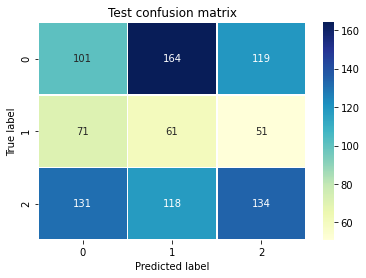

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.set_title('Test confusion matrix')     
sns.heatmap(cm, linewidth=0.5, ax=ax, annot=True, cmap='YlGnBu', fmt='d')

ax.set_xlabel('Predicted label')
ax.set_ylabel('True label')

<AxesSubplot:xlabel='importance', ylabel='feature'>

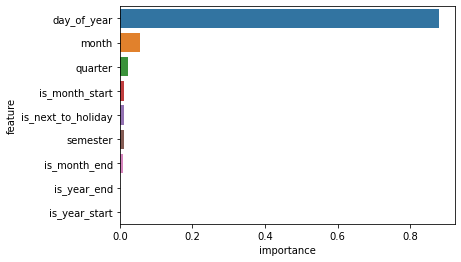

In [ ]:
imp = pd.DataFrame({'feature': features, 'importance': clf.feature_importances_}).sort_values(by='importance', ascending=False)

fig, ax = plt.subplots()
sns.barplot(x='importance', y='feature', data=imp, ax=ax)

#### Distribution of most important features

<AxesSubplot:xlabel='label', ylabel='day_of_year'>

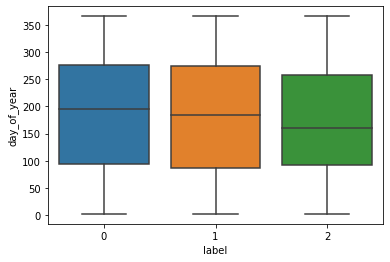

In [ ]:
sns.boxplot(x='label', y='day_of_year', data=dataset)

<AxesSubplot:xlabel='label', ylabel='month'>

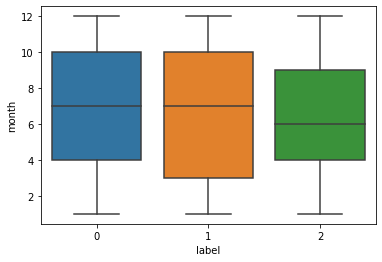

In [ ]:
sns.boxplot(x='label', y='month', data=dataset)

#### Conclusions

None of the models obtained reasonable performance in the test set, making it useless in a product point of view. As observed in the features distributions, the two most important ones do not show a clear influence on the classes. The only feature that we observed that had influence in the classes was the day of the week, but that happens because of the routes' scheduling and not because of trends in the waste production, so that feature was not considered for this method.